# Diversity of Categories

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import chain, product
import json

In [3]:
# show all columns of dataframes
#pd.set_option('display.max_columns', None)

## Loading data
Necessary data are the dataframe created in the basic_exploration and the race_codes. The race codes contain information about the code of the race and its corresponding description/title.

In [4]:
data_path = r'../../data/cps_clean_original_races.csv'
race_occ_path = r'../../data/race_codes.txt'

In [5]:
data_df = pd.read_csv(data_path, sep=';')

In [6]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4052248 entries, 0 to 4052247
Data columns (total 31 columns):
 #   Column          Dtype  
---  ------          -----  
 0   YEAR            int64  
 1   SERIAL          int64  
 2   CPSID           float64
 3   ASECFLAG        float64
 4   PERNUM          int64  
 5   ASECWT          float64
 6   AGE             int64  
 7   SEX             int64  
 8   RACE            int64  
 9   ASIAN           float64
 10  SPLOC           int64  
 11  SPRULE          int64  
 12  BPL             float64
 13  YRIMMIG         float64
 14  CITIZEN         float64
 15  MBPL            float64
 16  FBPL            float64
 17  NATIVITY        float64
 18  HISPAN          float64
 19  EMPSTAT         int64  
 20  OCC2010         float64
 21  OCCLY           float64
 22  OCC10LY         float64
 23  INCWAGE         int64  
 24  MIGSTA1         float64
 25  WHYMOVE         float64
 26  MIGRATE1        float64
 27  Category        object 
 28  occ_title   

In [7]:
race_codes_df = pd.read_csv(race_occ_path, sep=';')

## How diverse are the occupation categories in the year 2023?
Create a dataframe that only contains needed information. The occupation category instead of the exact occupation is used, because there are 423 different occupations available. Occupation categories are based on OCC2010. This column provides a more standardized representation of the occupation and occupation categories. Originally it was introduced to ensure comparability among several years.

In [8]:
data_df = data_df[data_df['YEAR'] == 2023]

In [9]:
data_df['OCC2010'].unique().size

423

In [10]:
race_occ_df = pd.DataFrame()
race_occ_df['RACE'] = data_df['RACE']
race_occ_df['occ_code'] = data_df['OCC2010']
race_occ_df['occ_category'] = data_df['Category']
race_occ_df['ASECWT'] = data_df['ASECWT']

In [11]:
race_occ_df = pd.merge(race_occ_df, race_codes_df, on='RACE', how='left')

In [12]:
race_occ_df['occ_category'] = race_occ_df['occ_category'].astype('category')
race_occ_df['race_title'] = race_occ_df['race_title'].astype('category')

### Diversity of entire dataset
As expected the following shows, that some races are overrepresented in the entire dataset. This is why it is important to incorporate the weight into the analysis to properly represent the actual distribution of races in the U.S. <br>

The top 5 races based on weight are
* White 100
* Black 200
* Asian only 651
* American Indian/Aleut/Eskimo 300
* White-Black 801

In [13]:
race_weighed = race_occ_df.groupby(['RACE'])['ASECWT'].sum().reset_index()

In [14]:
race_counts = race_occ_df['RACE'].value_counts().rename_axis('RACE').reset_index(name='total_counts')

In [15]:
races = race_counts.merge(race_weighed, on='RACE')
races = pd.merge(races, race_codes_df, on='RACE', how='left')

In [16]:
races.sort_values(by=['ASECWT'], ascending=False)

,RACE,total_counts,ASECWT,race_title,start,end
0,100,50859,1.179386e+08,White,1967,2023
1,200,7316,1.960354e+07,Black,1967,2023
2,651,4950,1.076659e+07,Asian only,2003,2023
3,300,823,1.579602e+06,American Indian/Aleut/Eskimo,1988,2023
6,801,364,1.017797e+06,White-Black,2003,2023
4,802,436,9.122458e+05,White-American Indian,2003,2023
7,803,316,7.292213e+05,White-Asian,2003,2023
5,652,397,7.161629e+05,Hawaiian/Pacific Islander only,2003,2023
10,805,63,1.353441e+05,Black-American Indian,2003,2023
8,804,64,1.146162e+05,White-Hawaiian/Pacific Islander,2003,2023


In [17]:
race_occ_df[race_occ_df['RACE'] == 100]['ASECWT'].sum()

117938641.67

### Nr of races per occupation category

Total numbers

In [18]:
grouped_df = race_occ_df.groupby(['occ_category', 'race_title']).size().reset_index(name='count')
diversity_df = []
for occupation_category, group_df in grouped_df.groupby('occ_category'):
    # Pivot the DataFrame to have 'race_title' as columns and 'count' as values
    pivot_df = group_df.pivot(index='occ_category', columns='race_title', values='count').fillna(0)
    # only select those races which are present in the category
    pivot_df = pivot_df.loc[:, (pivot_df != 0).any(axis=0)]

    diversity_df.append([occupation_category, len(pivot_df.columns)])

diversity_df = pd.DataFrame(diversity_df)
diversity_df.columns = ['occ_category', 'nr_races']
diversity_df.sort_values(by='nr_races', inplace=True)

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2254681230.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title']).size().reset_index(name='count')
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2254681230.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for occupation_category, group_df in grouped_df.groupby('occ_category'):


In [19]:
diversity_df

,occ_category,nr_races
8,EXTRACTION,5
9,"FARMING, FISHING, AND FORESTRY",8
18,NOT IN UNIVERSE (UNEMPLOYED OR NEVER WORKED),8
24,TECHNICIANS,9
4,COMMUNITY AND SOCIAL SERVICES,11
13,HEALTHCARE SUPPORT,11
15,LEGAL,11
16,"LIFE, PHYSICAL, AND SOCIAL SCIENCE",11
22,PROTECTIVE SERVICE,12
20,PERSONAL CARE AND SERVICE,13


Sum of weights

In [20]:
grouped_df = race_occ_df.groupby(['occ_category', 'race_title'])['ASECWT'].sum().reset_index()
diversity_df = []
for occupation_category, group_df in grouped_df.groupby('occ_category'):
    # Pivot the DataFrame to have 'race_title' as columns and 'count' as values
    pivot_df = group_df.pivot(index='occ_category', columns='race_title', values='ASECWT').fillna(0)
    # only select those races which are present in the category
    pivot_df = pivot_df.loc[:, (pivot_df != 0).any(axis=0)]

    diversity_df.append([occupation_category, len(pivot_df.columns)])
diversity_df = pd.DataFrame(diversity_df)
diversity_df.columns = ['occ_category', 'nr_races']
diversity_df.sort_values(by='nr_races', inplace=True)

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2956925229.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title'])['ASECWT'].sum().reset_index()
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2956925229.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for occupation_category, group_df in grouped_df.groupby('occ_category'):


In [21]:
diversity_df.to_csv('../../data/diversity_categories_race_count.csv', index=False, sep=';')

In [22]:
diversity_df

,occ_category,nr_races
8,EXTRACTION,5
9,"FARMING, FISHING, AND FORESTRY",8
18,NOT IN UNIVERSE (UNEMPLOYED OR NEVER WORKED),8
24,TECHNICIANS,9
4,COMMUNITY AND SOCIAL SERVICES,11
13,HEALTHCARE SUPPORT,11
15,LEGAL,11
16,"LIFE, PHYSICAL, AND SOCIAL SCIENCE",11
22,PROTECTIVE SERVICE,12
20,PERSONAL CARE AND SERVICE,13


C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2011290666.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(diversity_df['occ_category'], rotation = 45, ha='right')


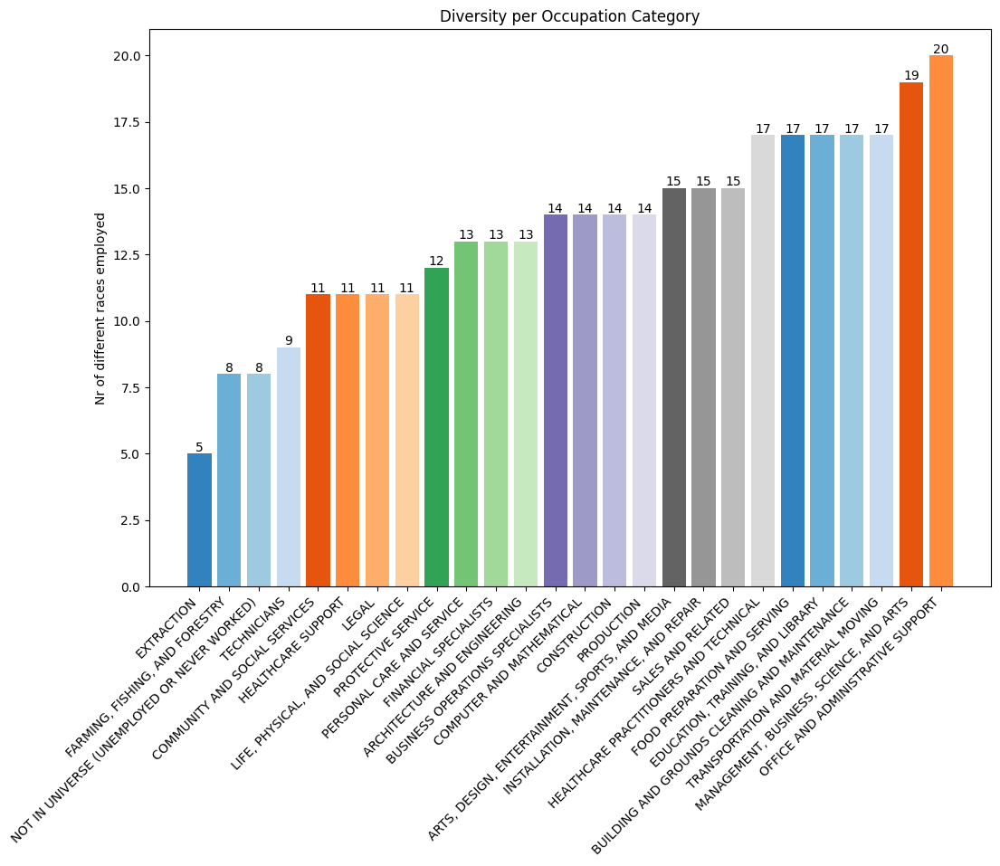

In [23]:
fig, ax = plt.subplots(figsize=(12, 8))
bar_container = ax.bar(diversity_df['occ_category'], diversity_df['nr_races'], color=plt.cm.tab20c.colors
        )

ax.set_title('Diversity per Occupation Category', y = 1)
ax.set(ylabel='Nr of different races employed')
ax.bar_label(bar_container, fmt='{:,.0f}')
ax.set_xticklabels(diversity_df['occ_category'], rotation = 45, ha='right')
plt.show()

### Plot
For each occupation category plot the amount of people per race working in that field. It can be observed that several categories are more diverse than others. 
* Art, Design, Entertainment Sports and Media is very diverse. But maybe this is because this cateory combines many subcategories.
* Extraction + military are least diverse. They both contain only few jobs (4 and 5)
* Food preperation and Serving + Healthcare are the most diverse categories.

In [24]:
races

,RACE,total_counts,ASECWT,race_title,start,end
0,100,50859,1.179386e+08,White,1967,2023
1,200,7316,1.960354e+07,Black,1967,2023
2,651,4950,1.076659e+07,Asian only,2003,2023
3,300,823,1.579602e+06,American Indian/Aleut/Eskimo,1988,2023
4,802,436,9.122458e+05,White-American Indian,2003,2023
5,652,397,7.161629e+05,Hawaiian/Pacific Islander only,2003,2023
6,801,364,1.017797e+06,White-Black,2003,2023
7,803,316,7.292213e+05,White-Asian,2003,2023
8,804,64,1.146162e+05,White-Hawaiian/Pacific Islander,2003,2023
9,809,64,6.705849e+04,Asian-Hawaiian/Pacific Islander,2003,2023


In [25]:
def plot_occ_races(race_occ_df: pd.DataFrame, races: pd.DataFrame, percentage: bool = False, weighted: bool = False):
    """
    plot amount of people per race working in each occupation category
    """

    if weighted:
        grouped_df = race_occ_df.groupby(['occ_category', 'race_title'])['ASECWT'].sum().reset_index()
    else:
        grouped_df = race_occ_df.groupby(['occ_category', 'race_title']).size().reset_index(name='count')

    fig_count=0
    for occupation_category, group_df in grouped_df.groupby('occ_category'):
        # Pivot the DataFrame to have 'race_title' as columns and 'count' as values
        if weighted:
            pivot_df = group_df.pivot(index='occ_category', columns='race_title', values='ASECWT').fillna(0)
        else: 
            pivot_df = group_df.pivot(index='occ_category', columns='race_title', values='count').fillna(0)
        # only select those races which are present in the category
        pivot_df = pivot_df.loc[:, (pivot_df != 0).any(axis=0)]

        pivot_df = pivot_df.sort_values(by = f'{occupation_category}', axis = 1, ascending = False) 

        array = pivot_df.to_numpy()
        array = array[0]
        titles = list(pivot_df.columns.str.strip())

        if percentage:
            current_title = 0
            relative_array = []
            for count in array:
                relative_array.append(100 / races[races['race_title'].str.strip() == titles[current_title]]['ASECWT'].item() * count)
                current_title += 1

        cmap = plt.cm.tab20
        colors = cmap(np.arange(len(titles)) % cmap.N)

        fig, ax = plt.subplots(figsize=(10.5, 8))

        if percentage:
            bar_container = ax.bar(titles, relative_array, color = colors)
            ax.set(ylabel='Percentage of race', title=f'Percentage of people belonging to specific race working in {occupation_category}')
            ax.bar_label(bar_container, fmt=lambda x: f'{x:.2f}%')
        elif weighted:
            bar_container = ax.bar(titles, array, color = colors)
            ax.set(ylabel='sum of weights', title=f'{occupation_category}')
            ax.bar_label(bar_container, fmt='{:,.0f}', rotation=15, fontsize=8)
        else:
            bar_container = ax.bar(titles, array, color = colors)
            ax.set(ylabel='count', title=f'{occupation_category}')
            ax.bar_label(bar_container, fmt='{:,.0f}')

        ax.set_xticklabels(titles, rotation = 45, ha='right')
        plt.tight_layout()
        plt.savefig(f'../../plots/percentage_race_per_occ_23_{fig_count}')

        plt.show()
        fig_count += 1

Absolute numbers

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title']).size().reset_index(name='count')
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for occupation_category, group_df in grouped_df.groupby('occ_category'):
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titl

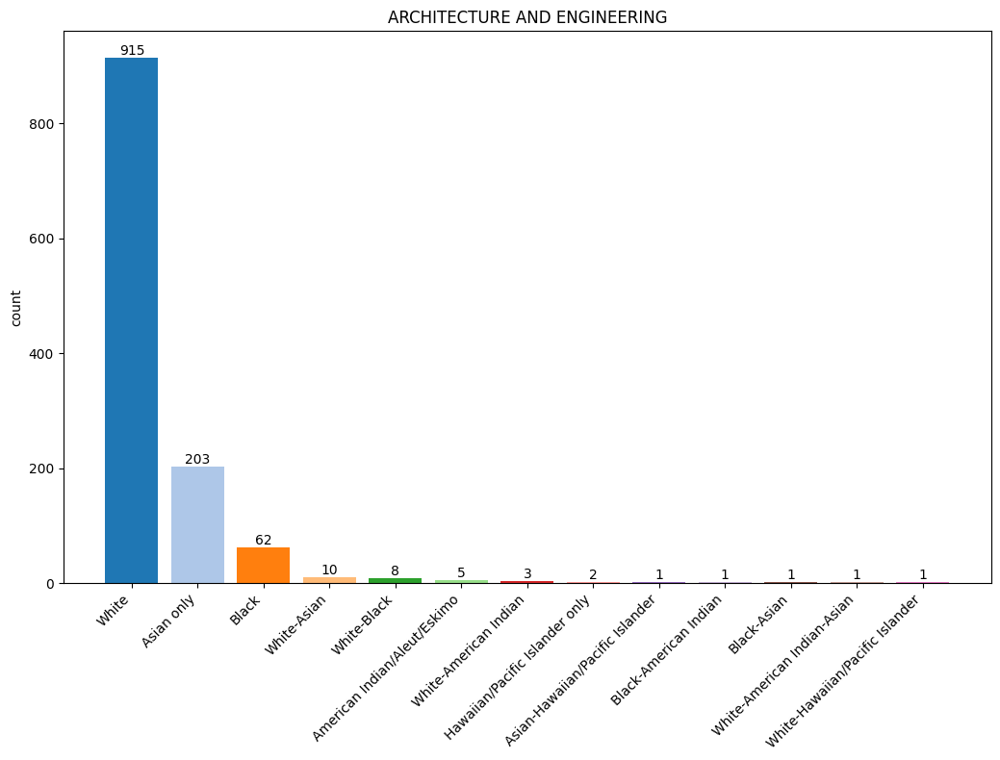

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


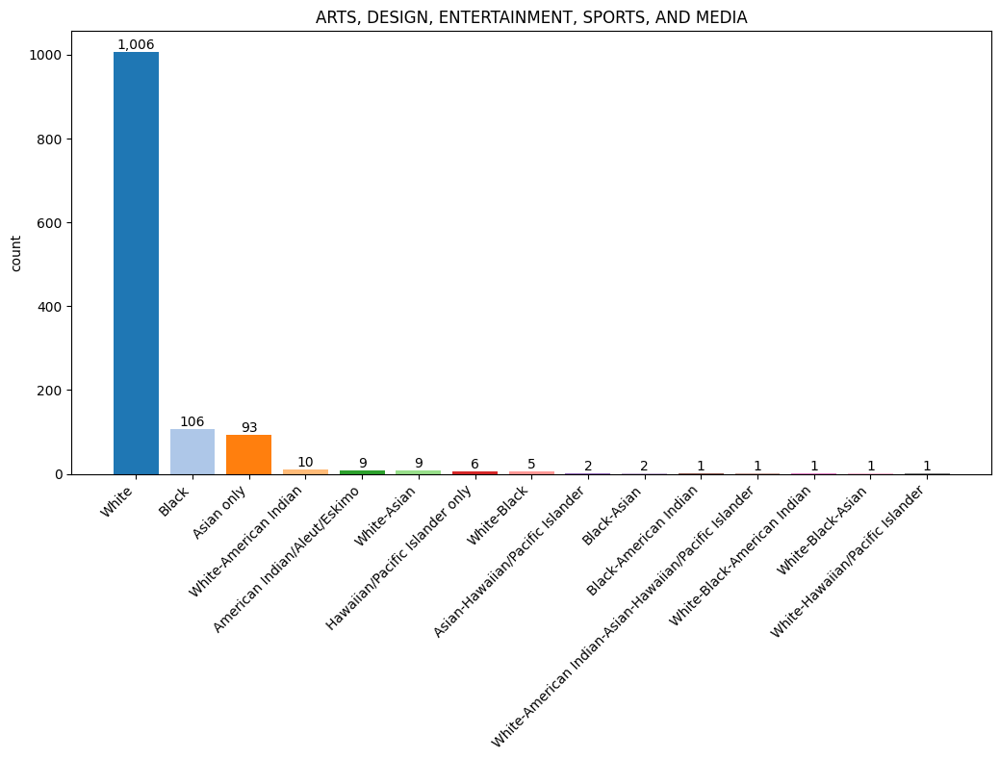

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


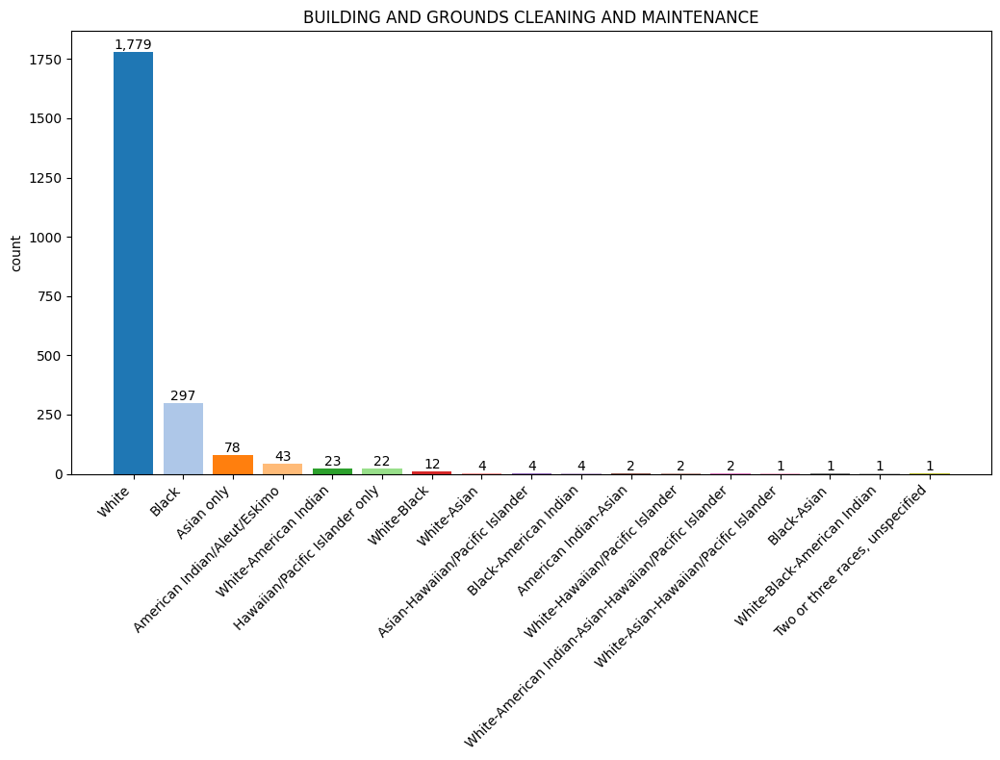

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


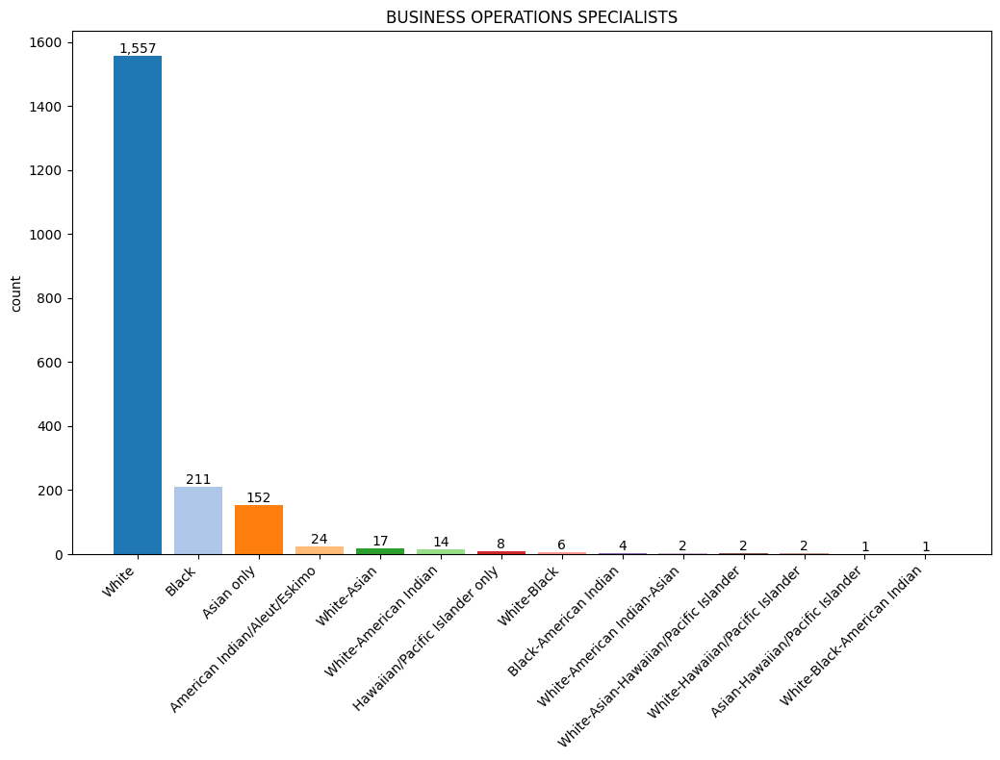

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


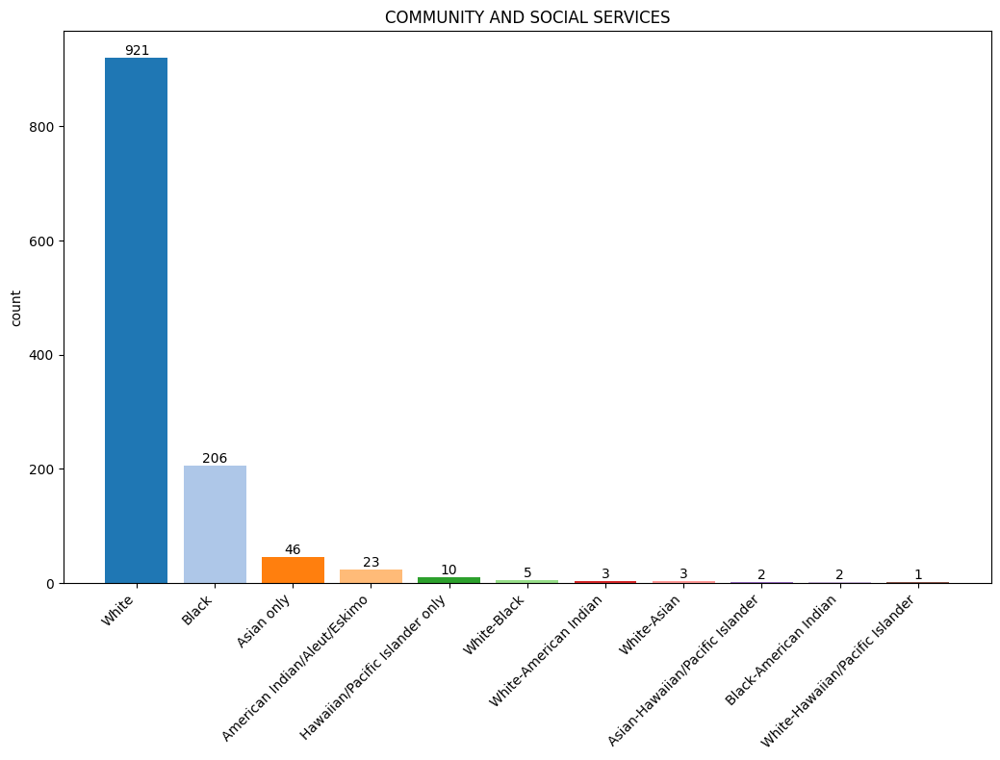

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


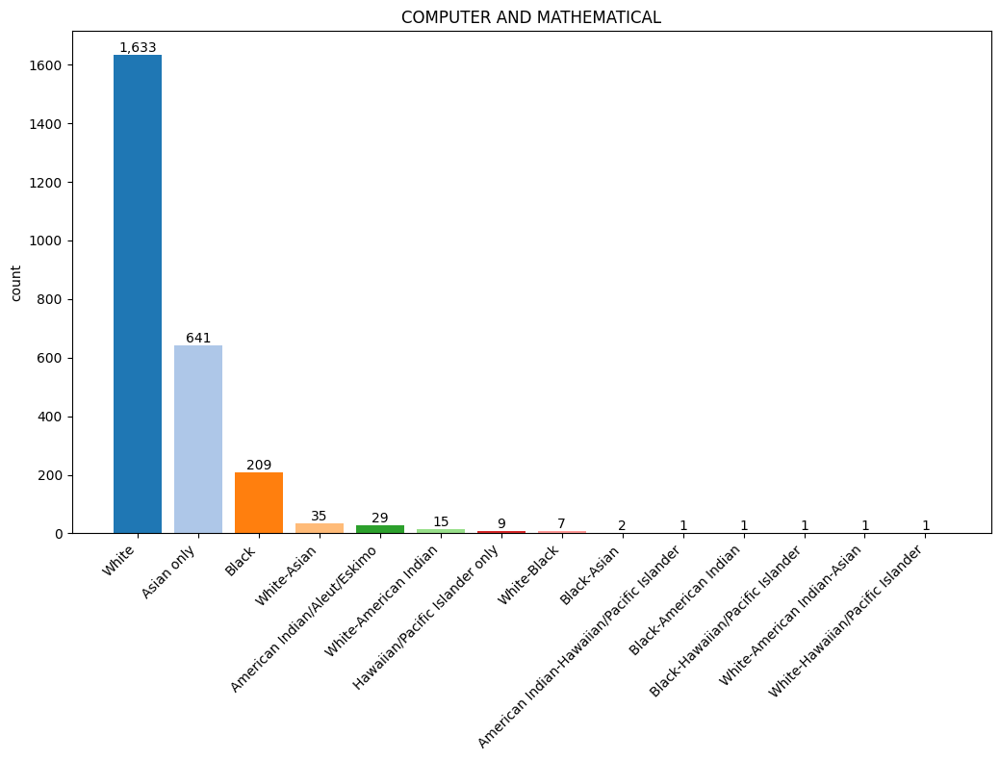

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


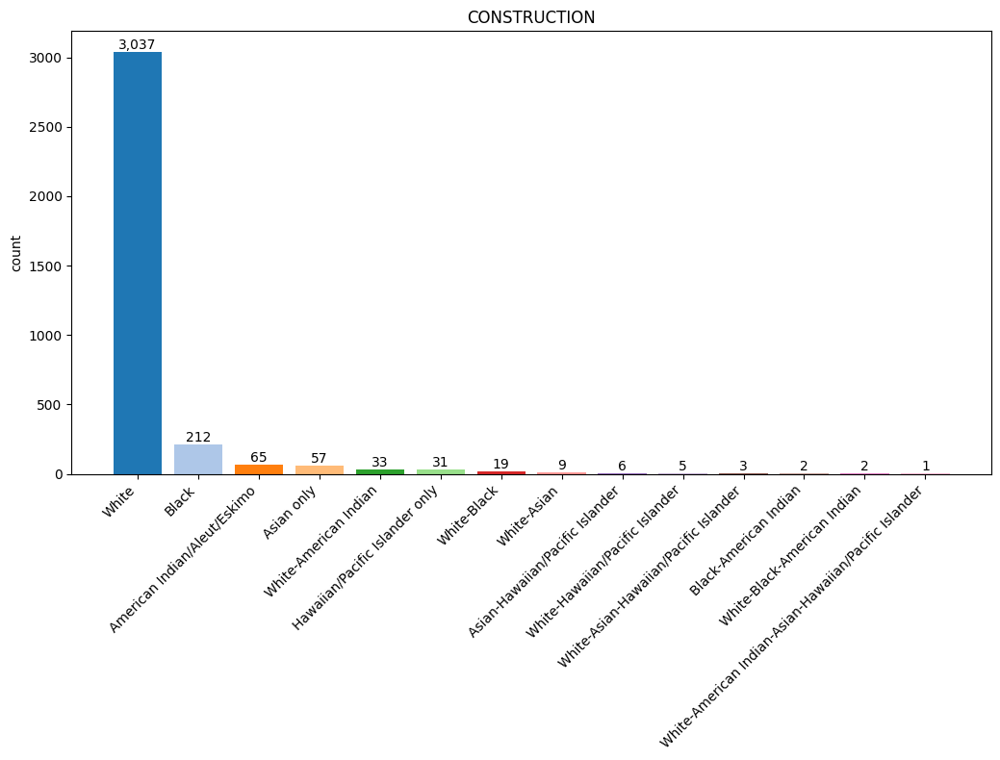

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


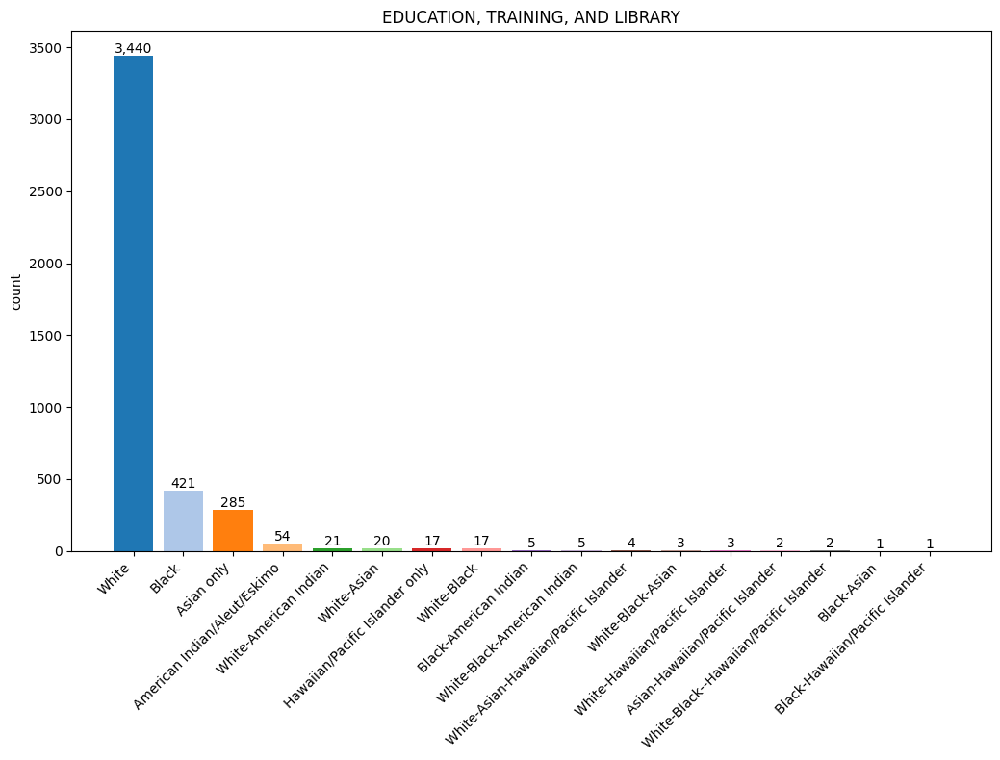

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


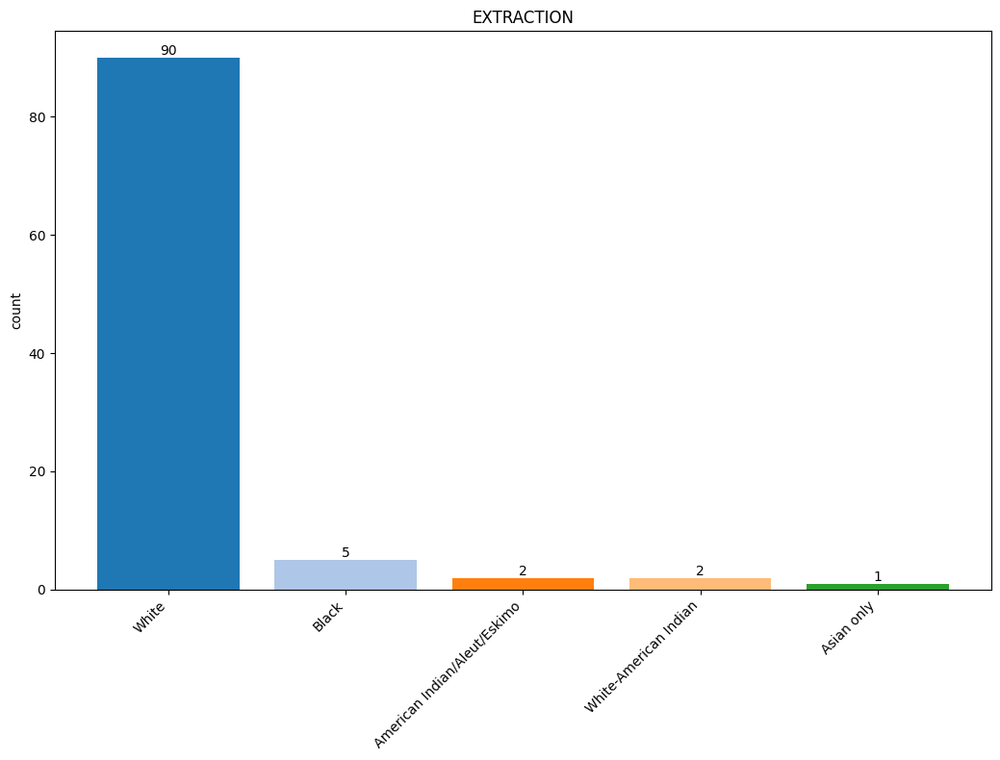

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


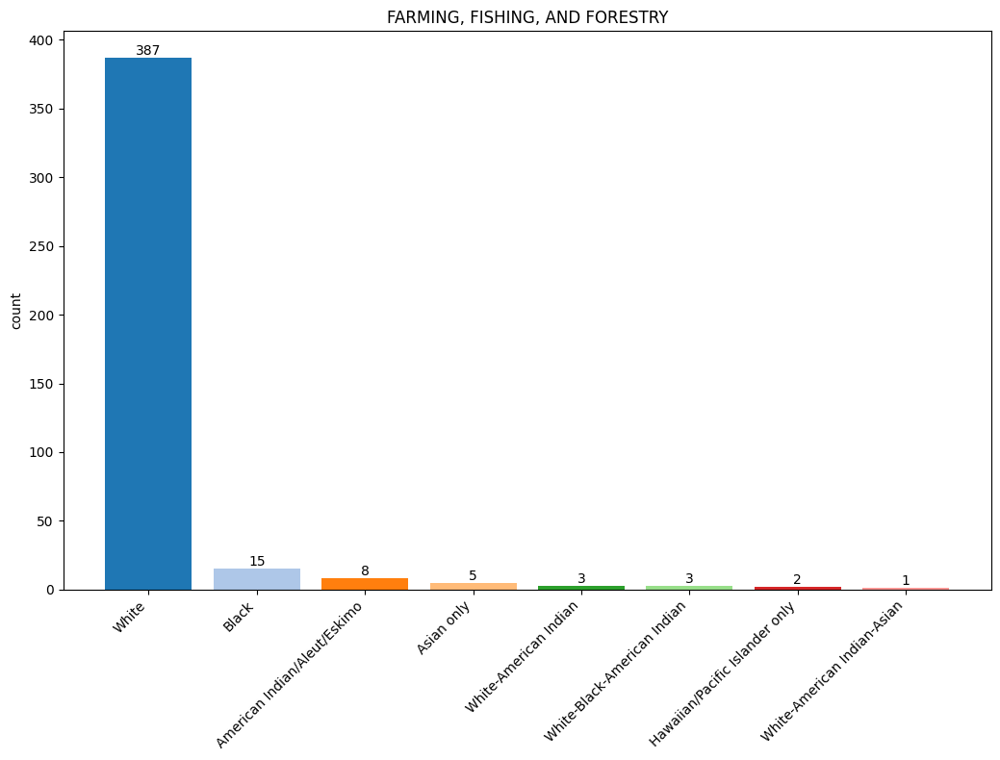

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


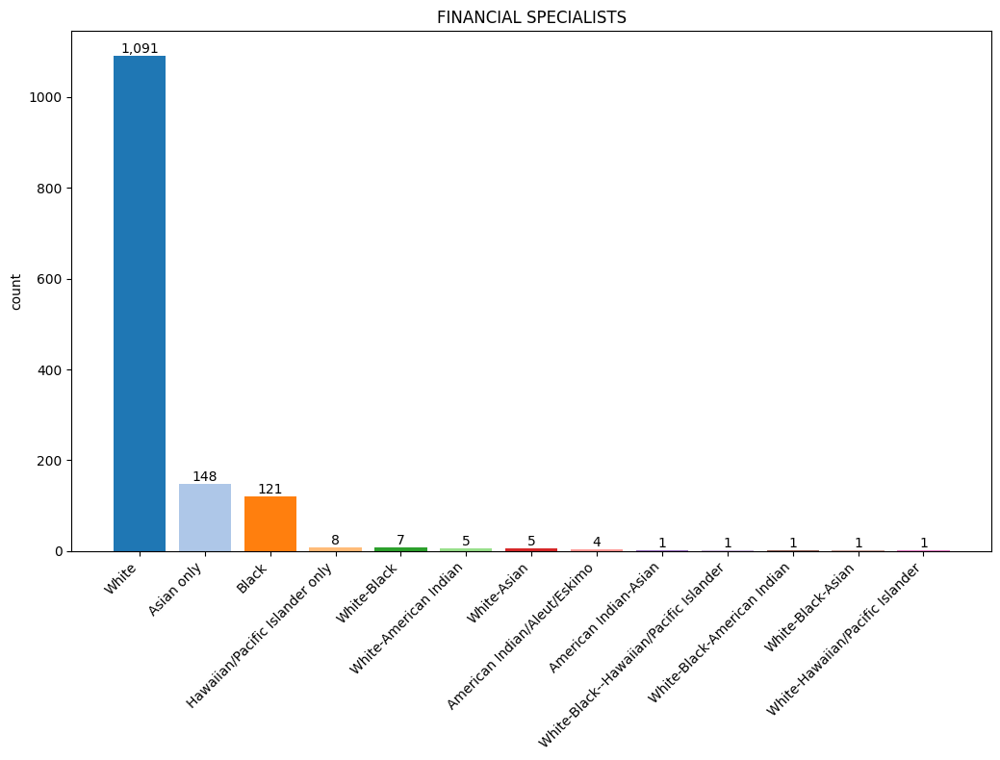

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


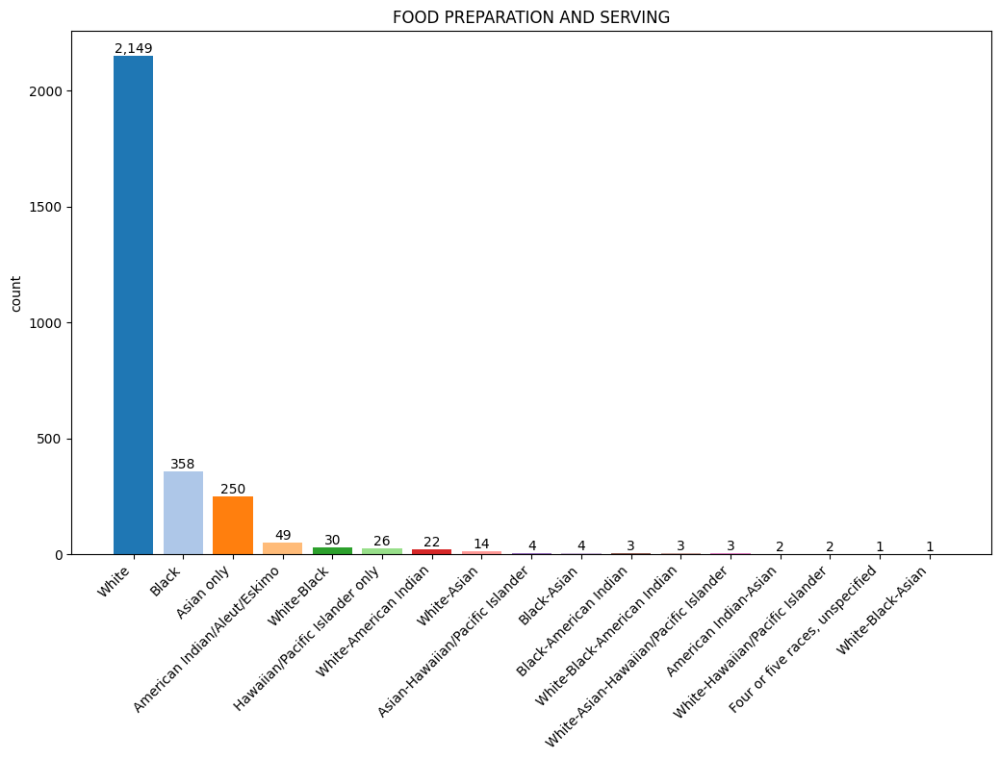

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


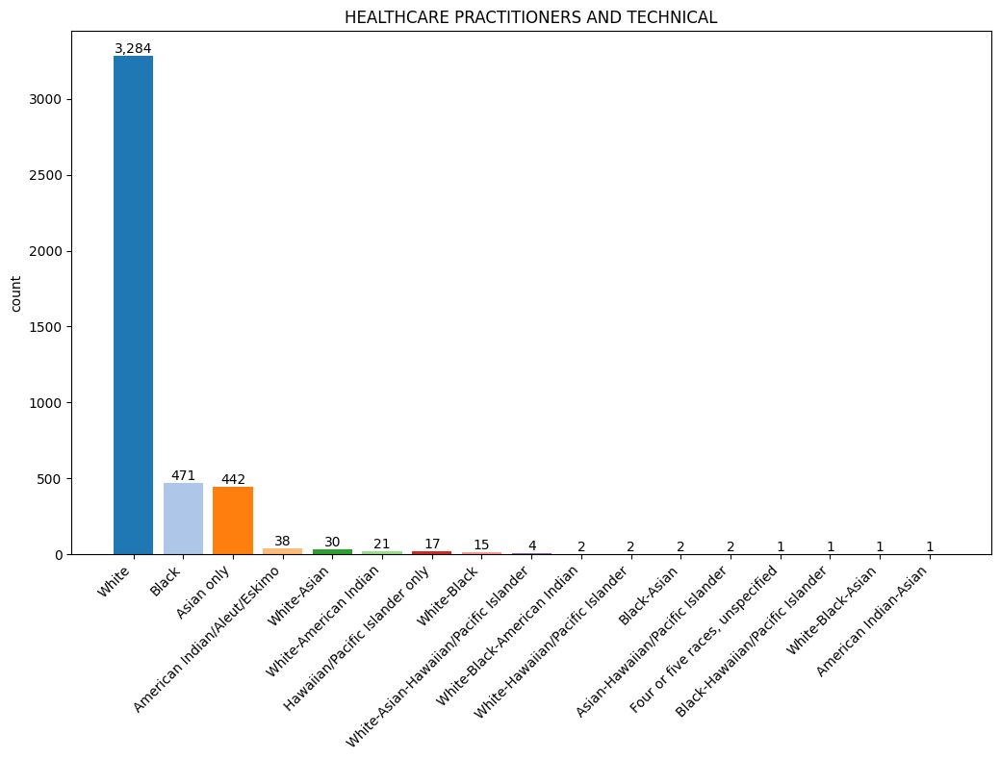

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


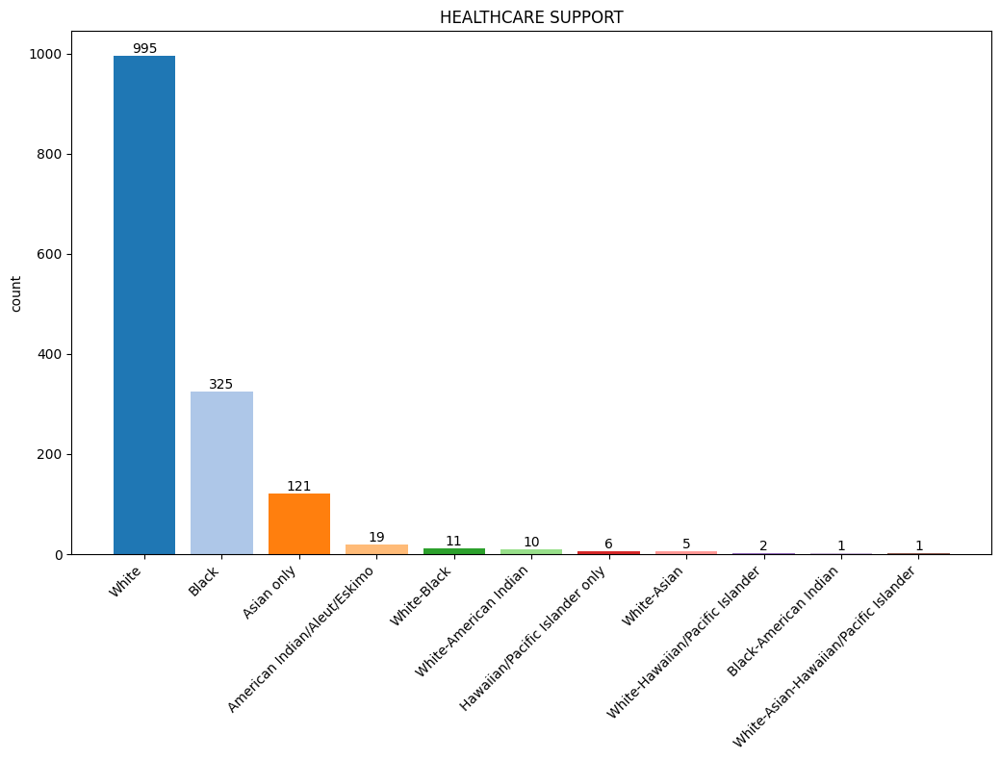

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


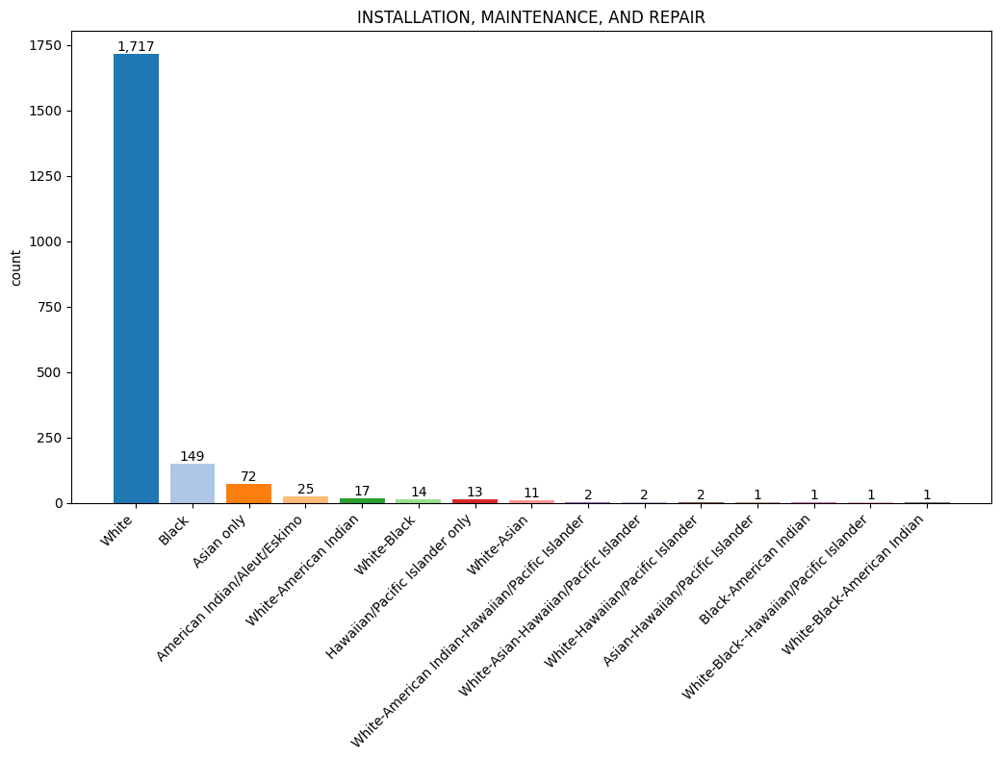

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


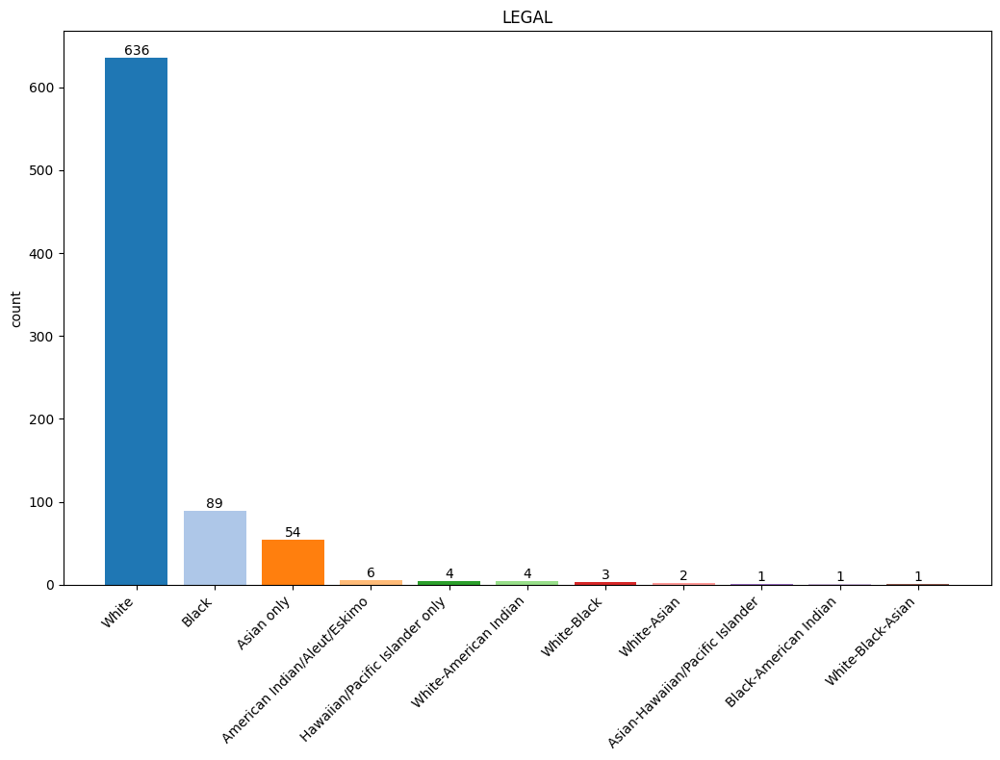

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


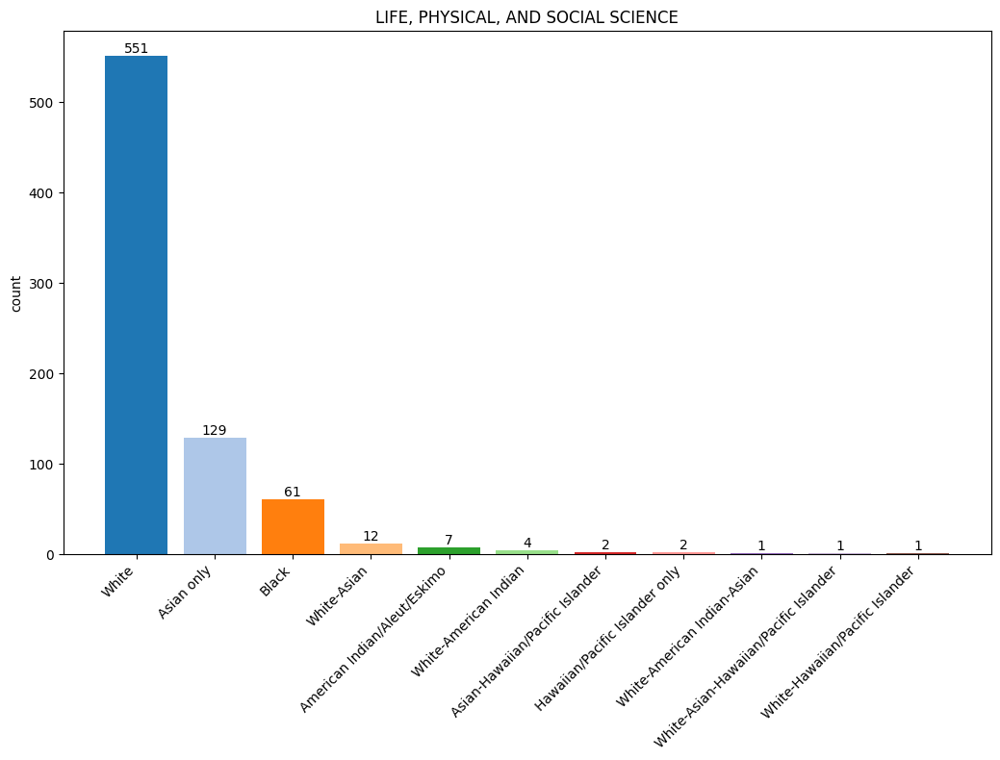

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


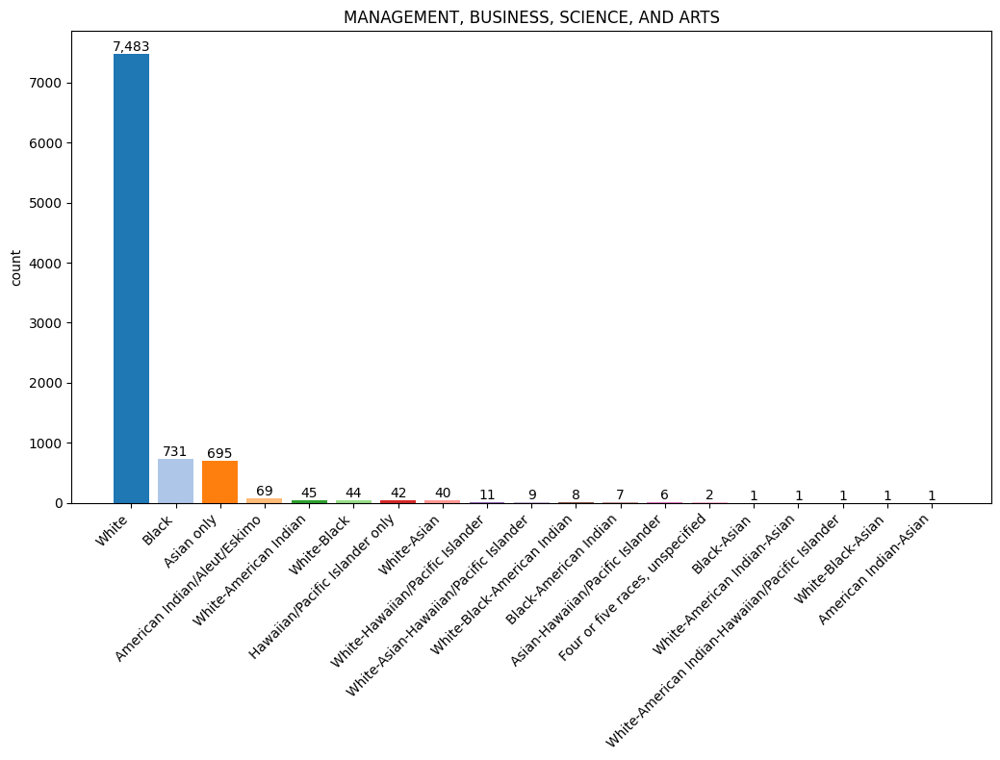

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


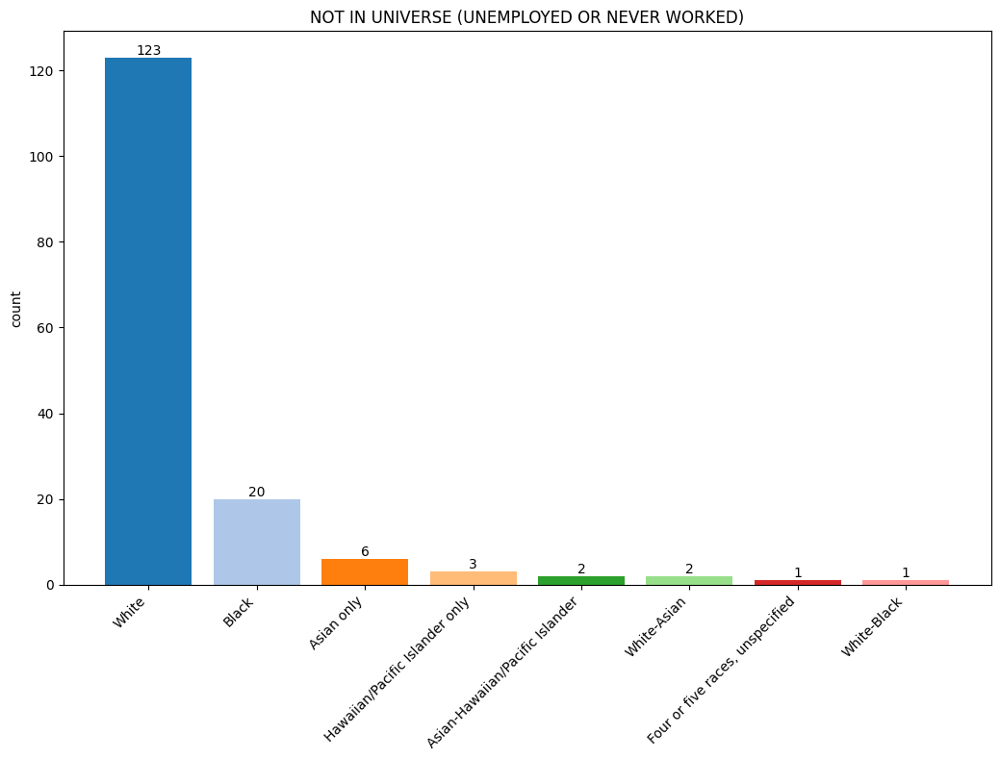

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


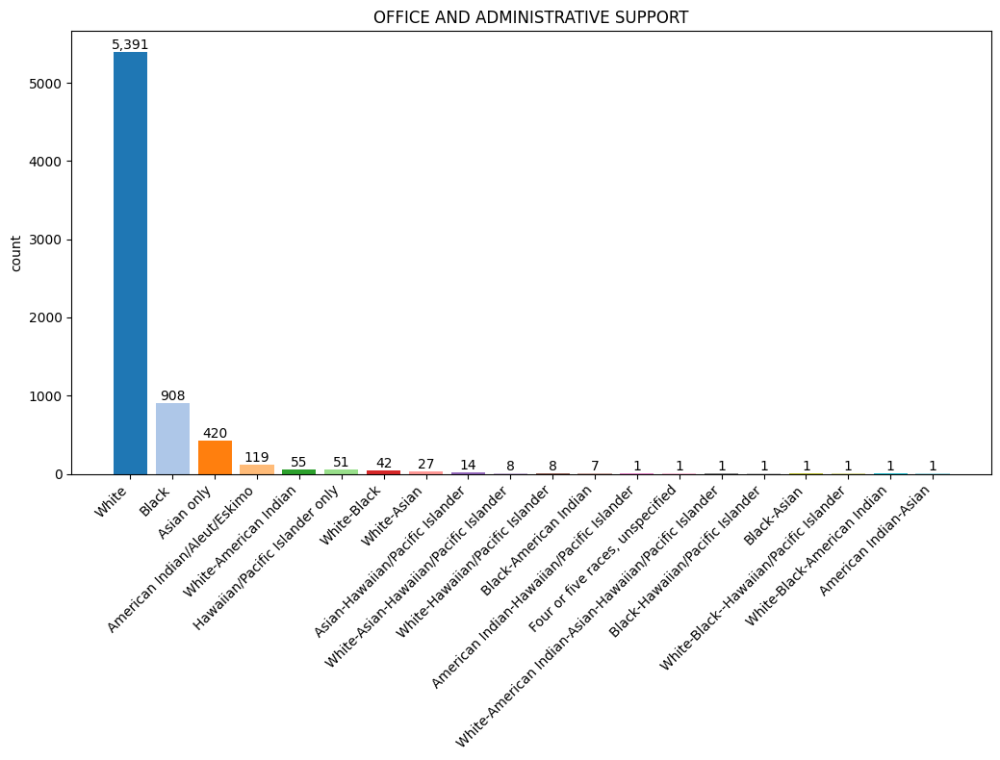

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


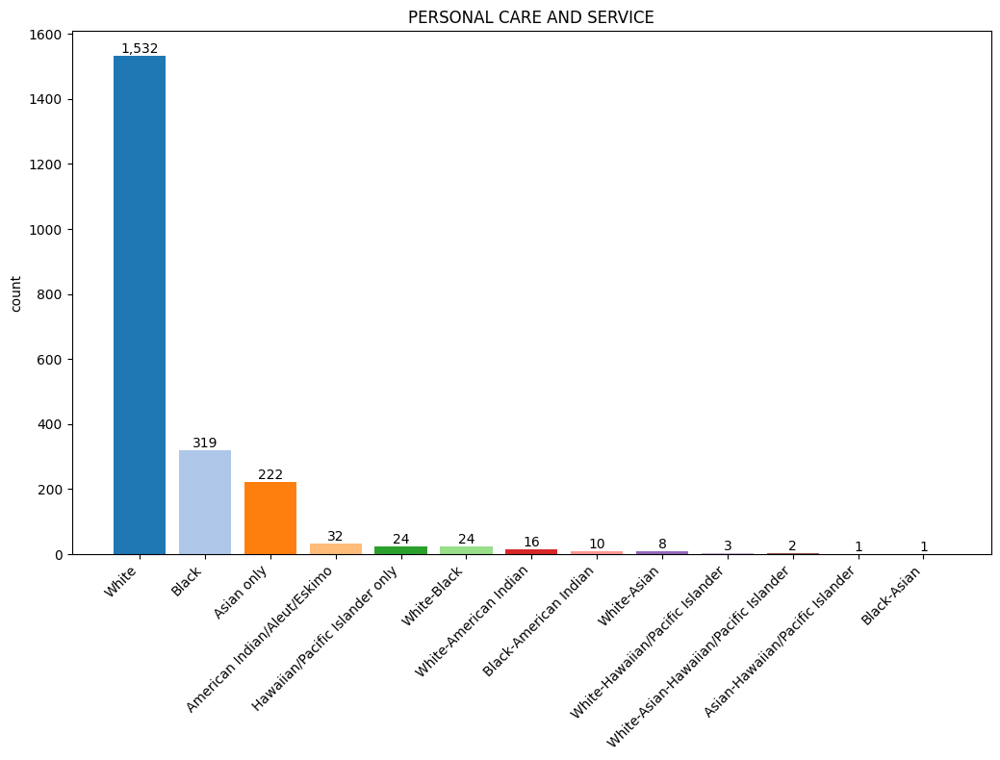

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


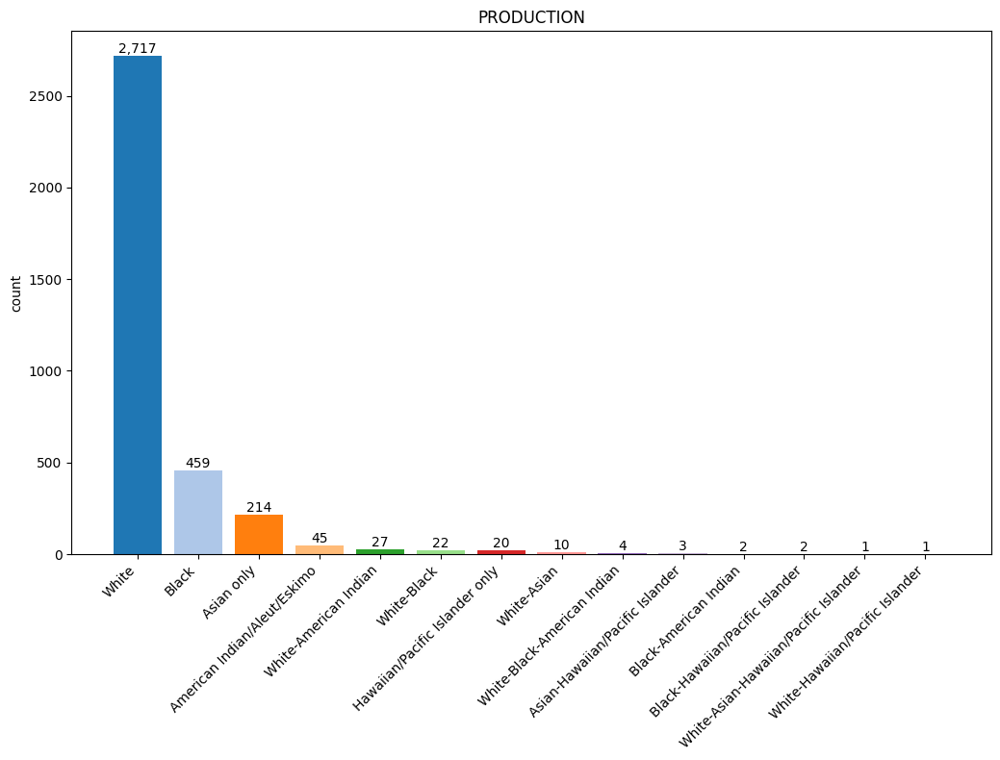

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


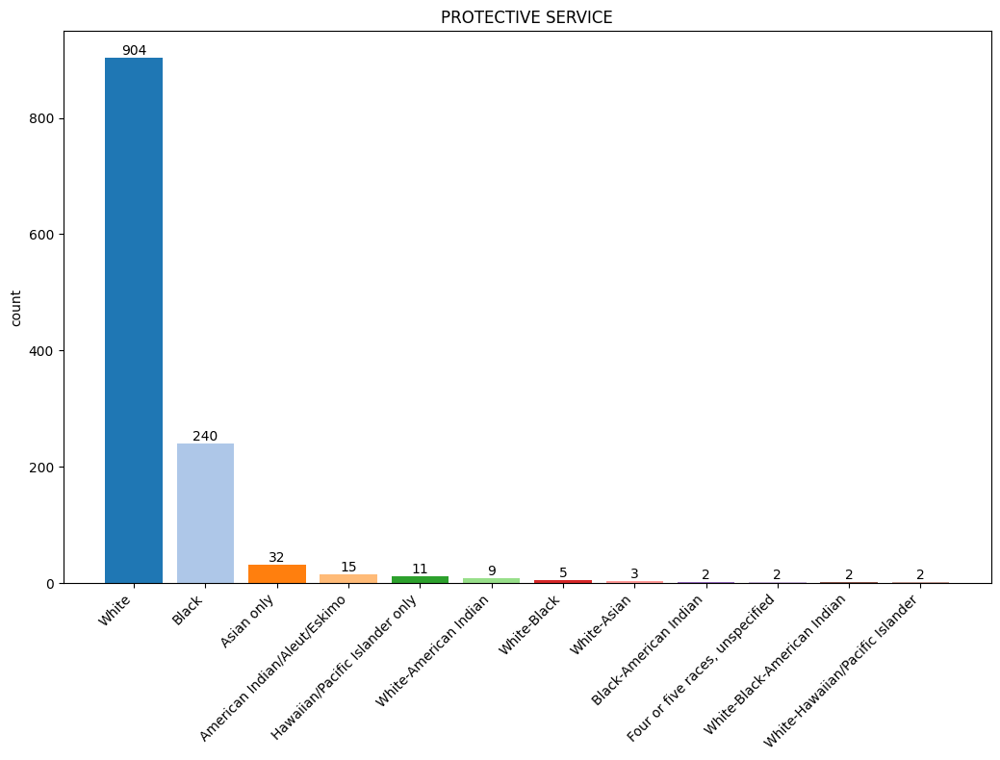

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


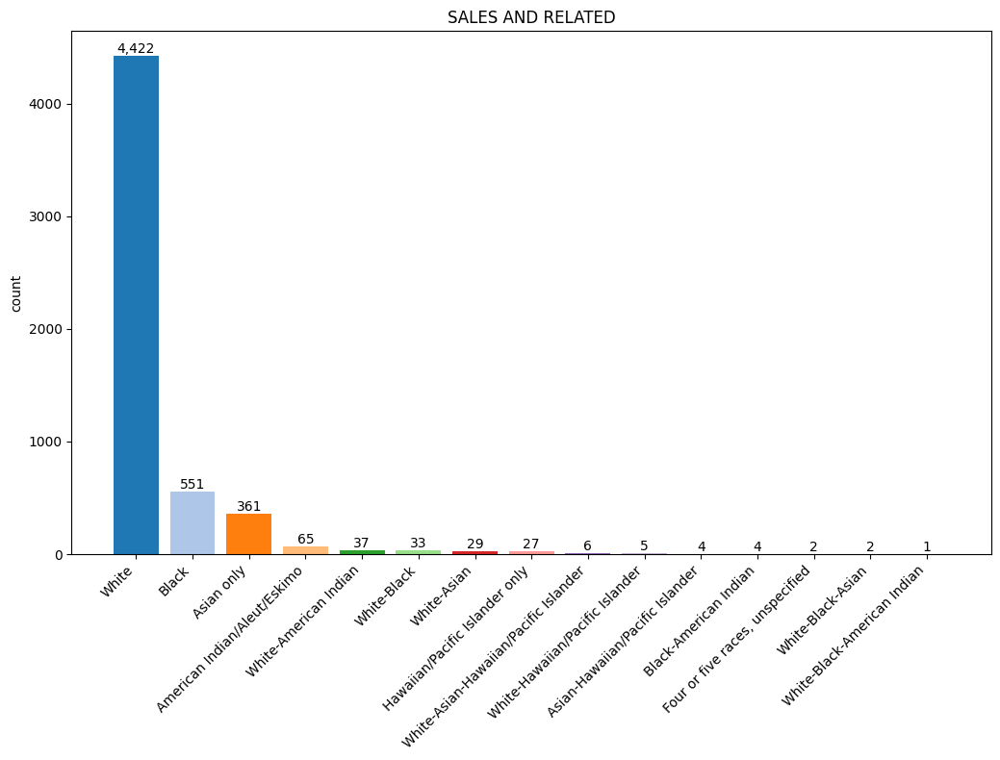

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


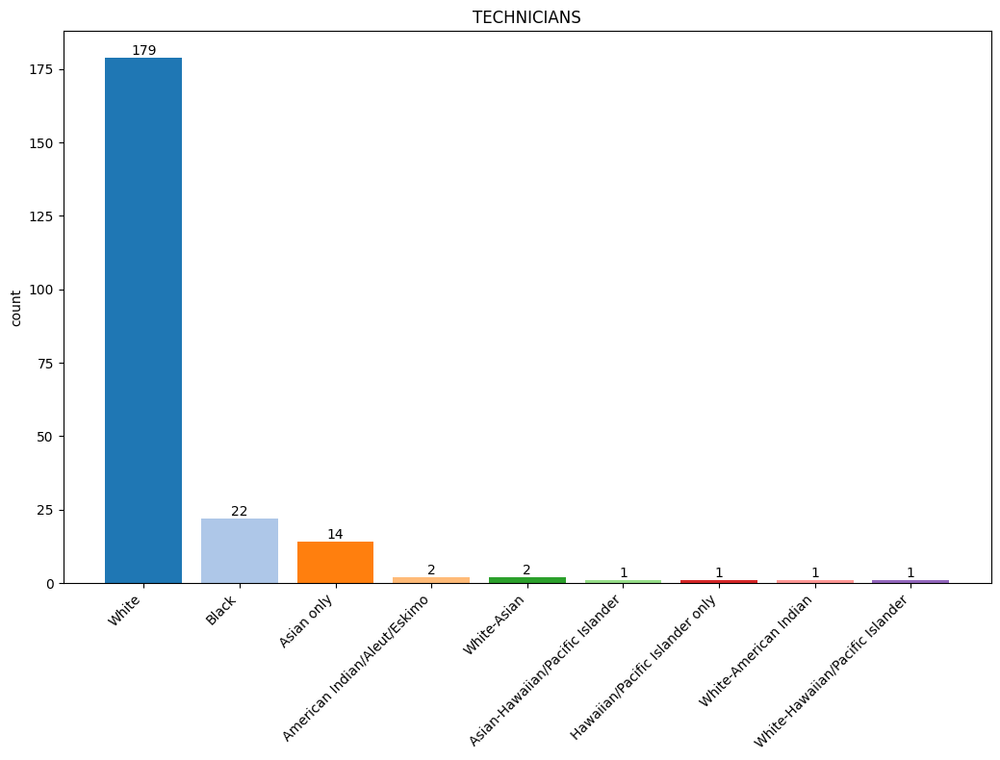

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


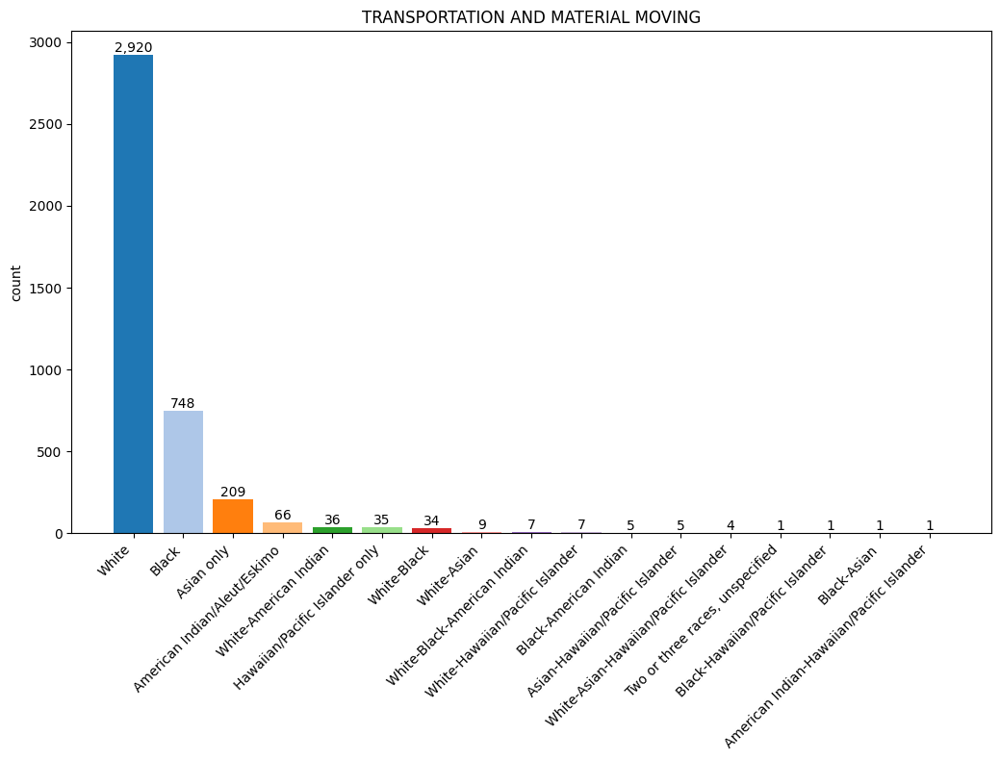

In [26]:
plot_occ_races(race_occ_df, races)

Percentage <br>
Percentage of people belonging to race xy that work in occupation category z.

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title'])['ASECWT'].sum().reset_index()
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for occupation_category, group_df in grouped_df.groupby('occ_category'):
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles,

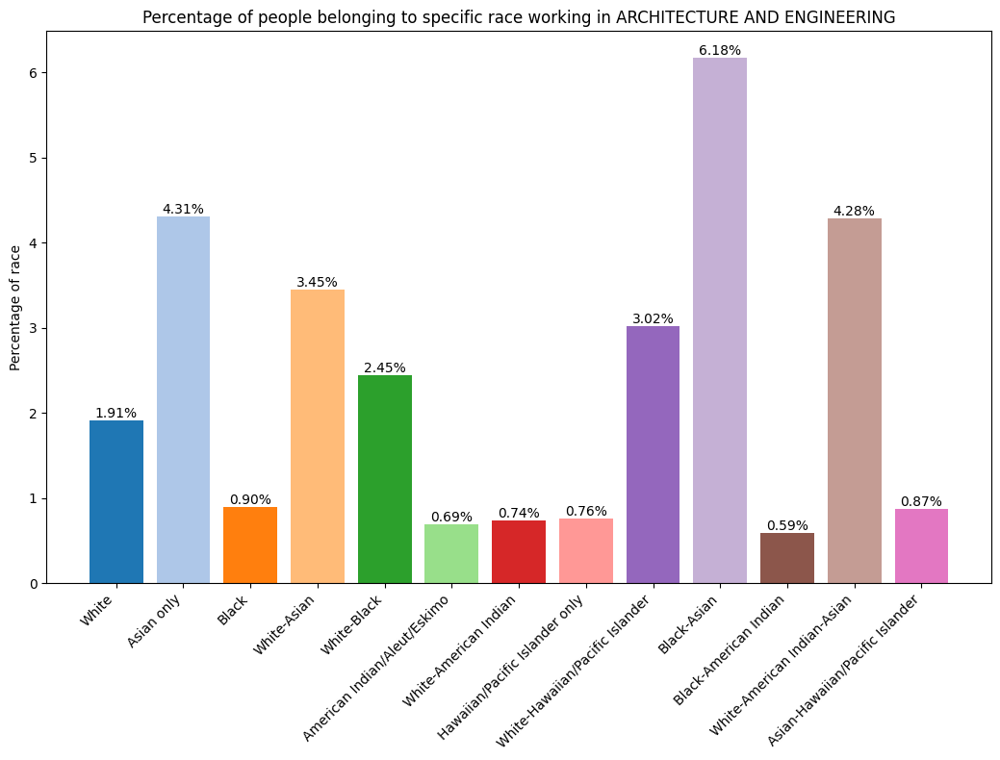

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


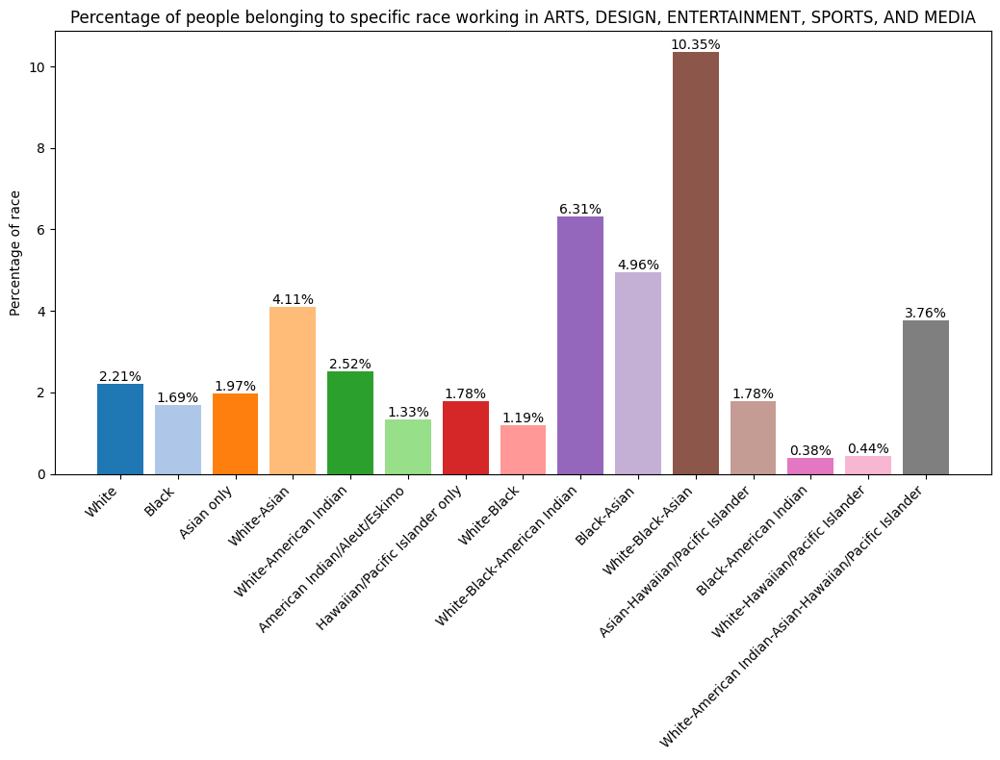

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


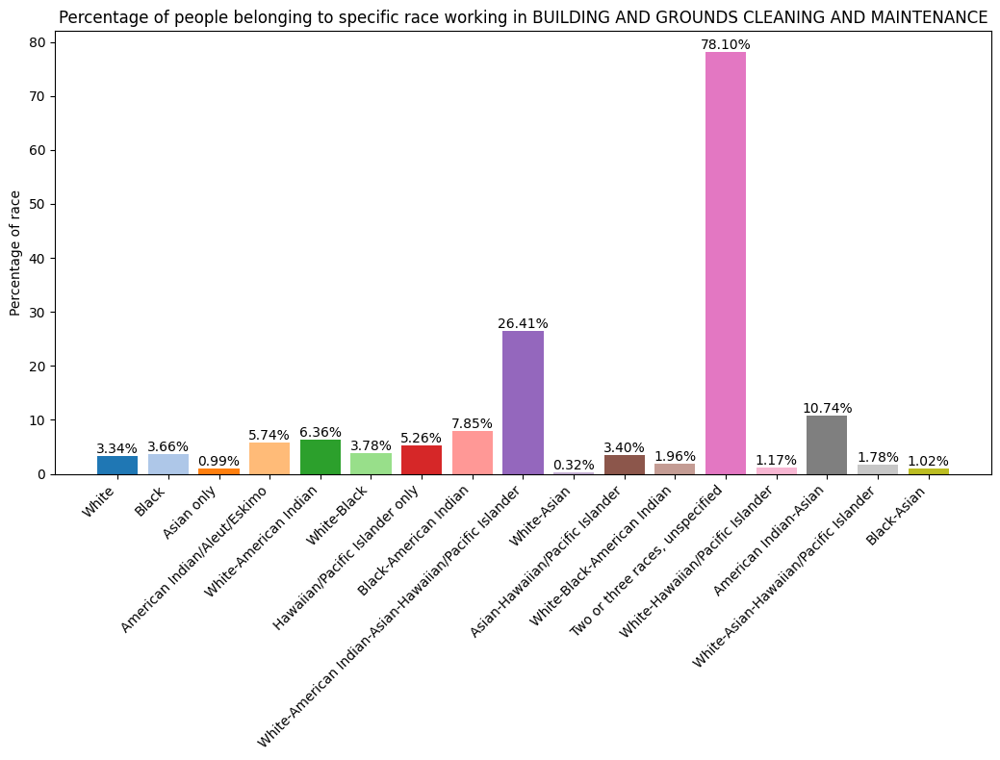

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


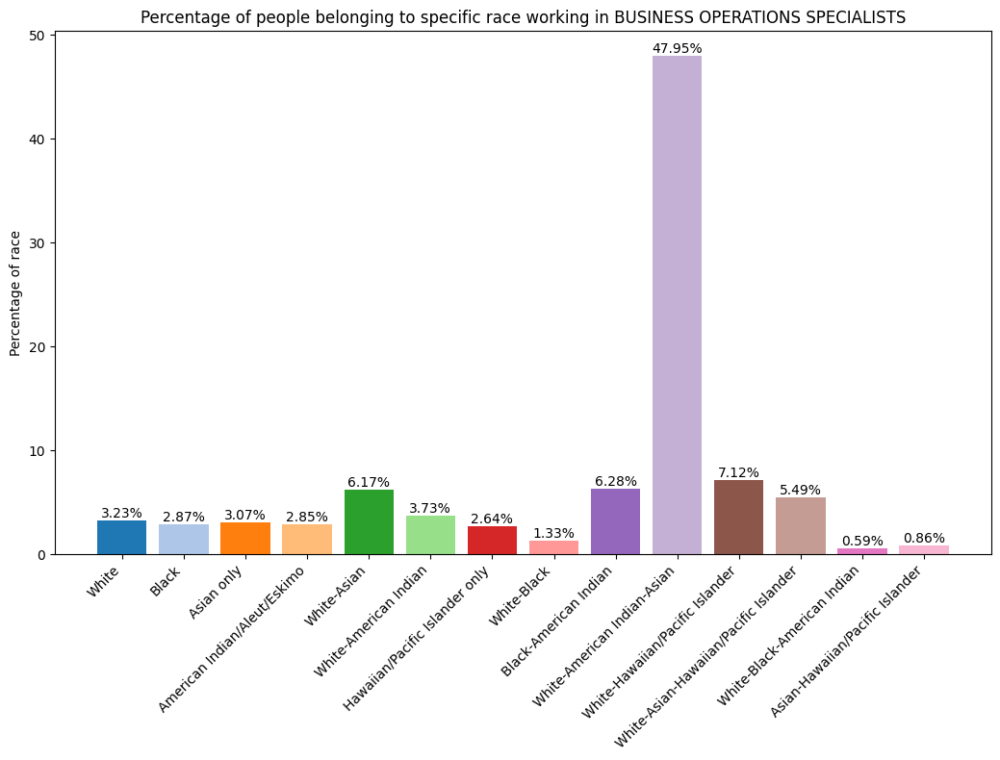

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


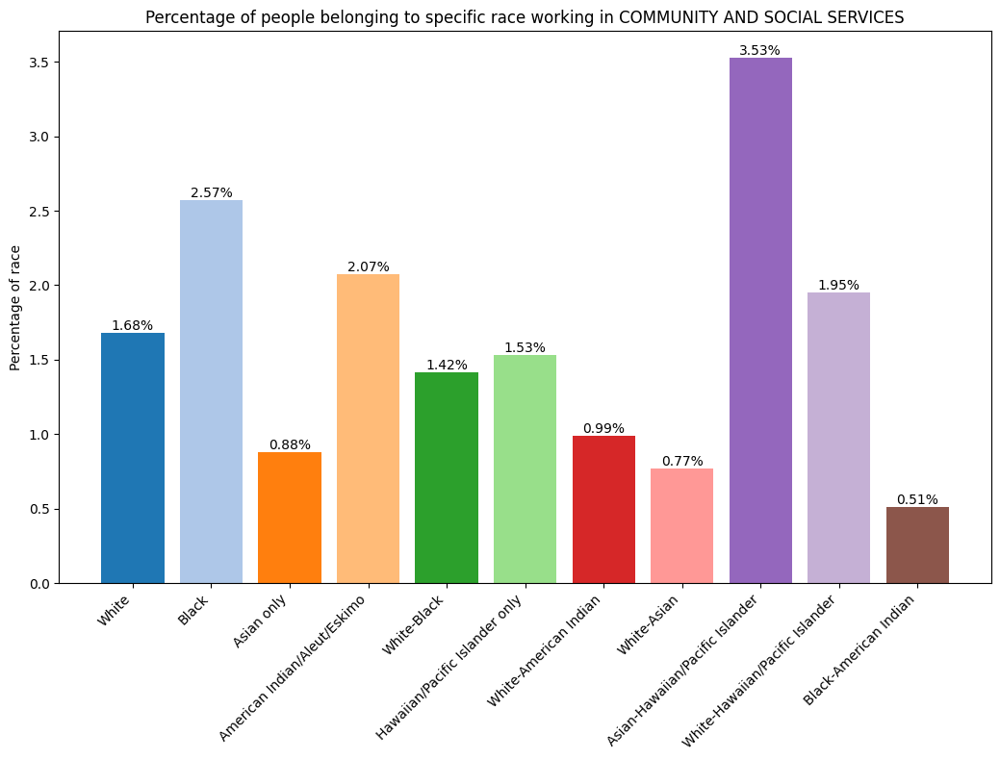

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


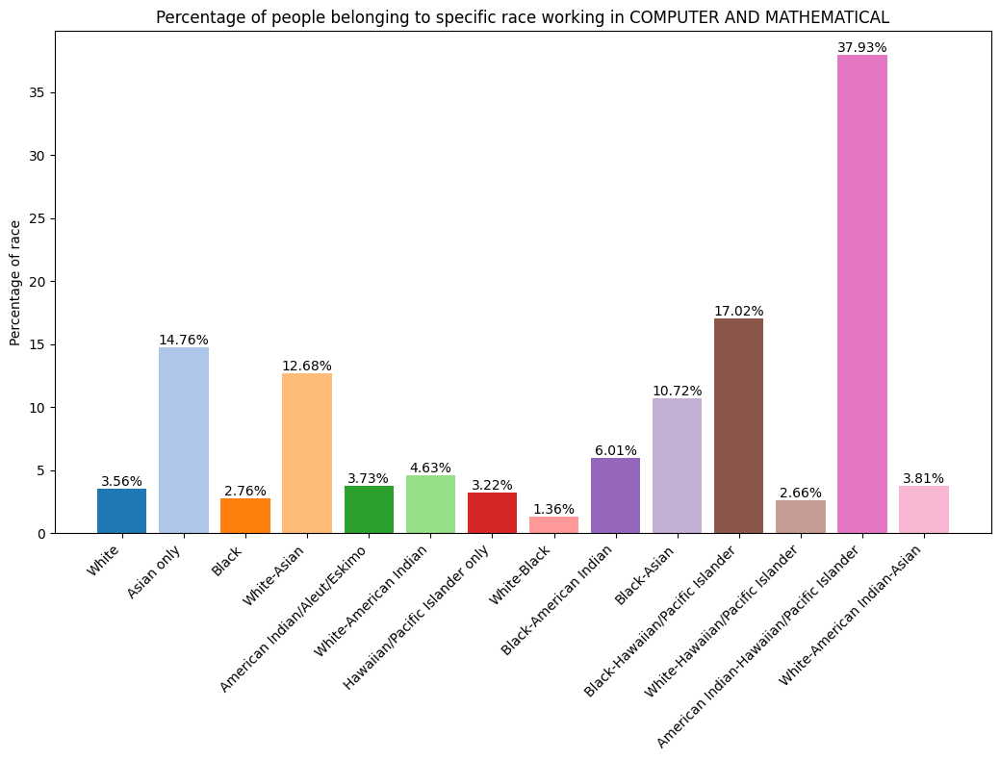

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


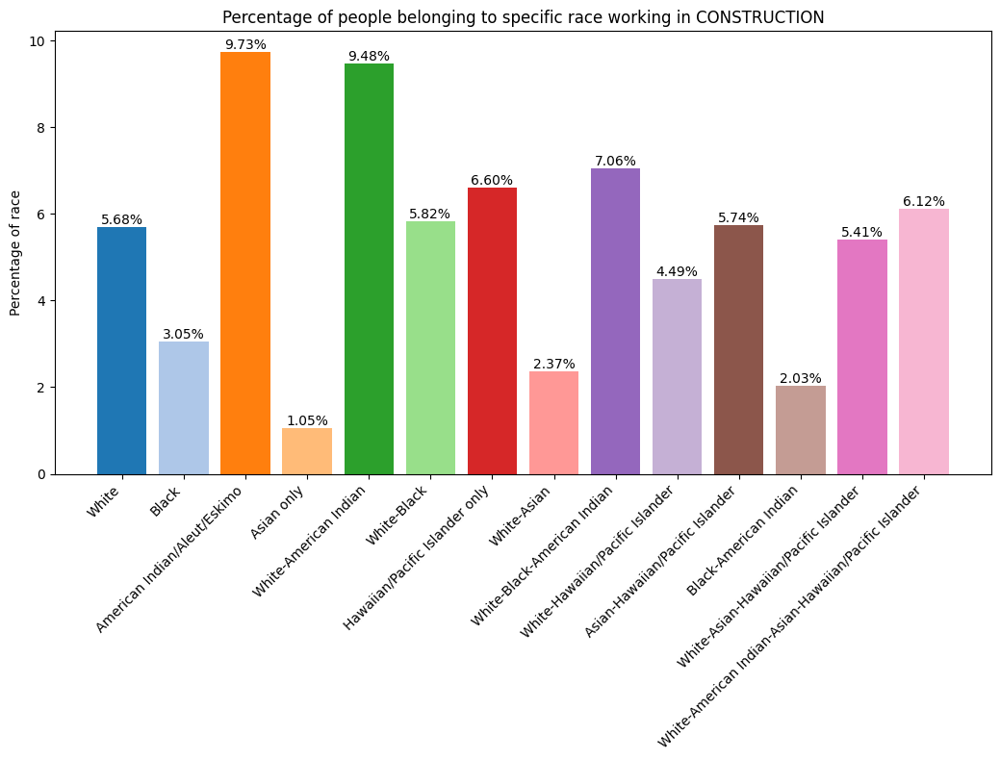

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


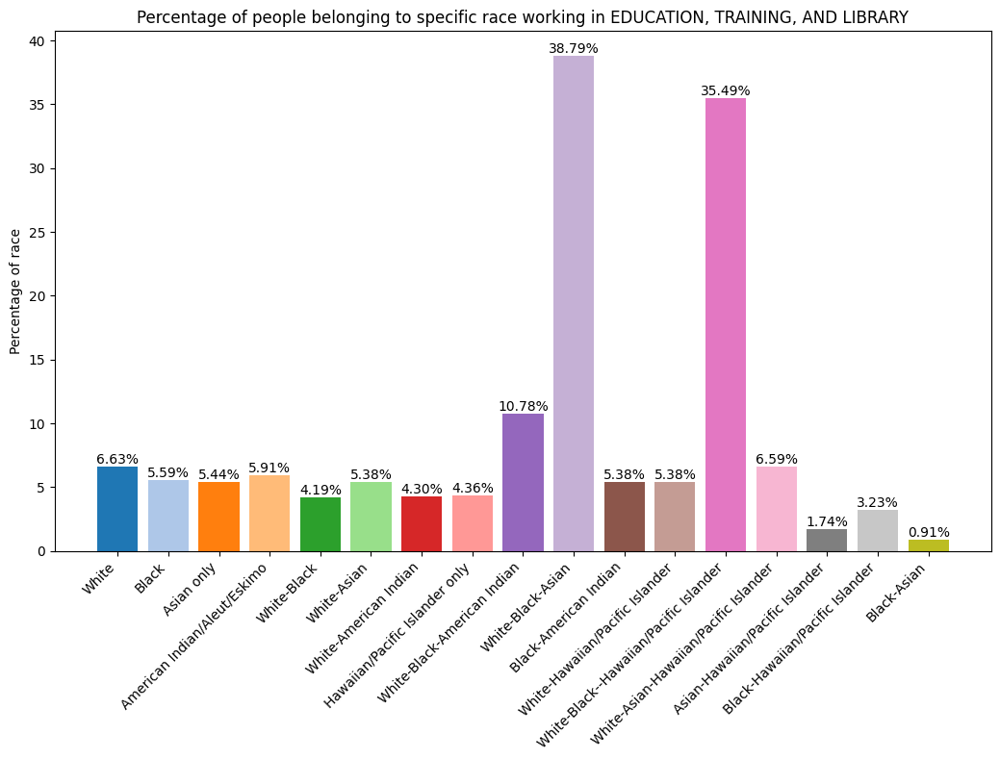

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


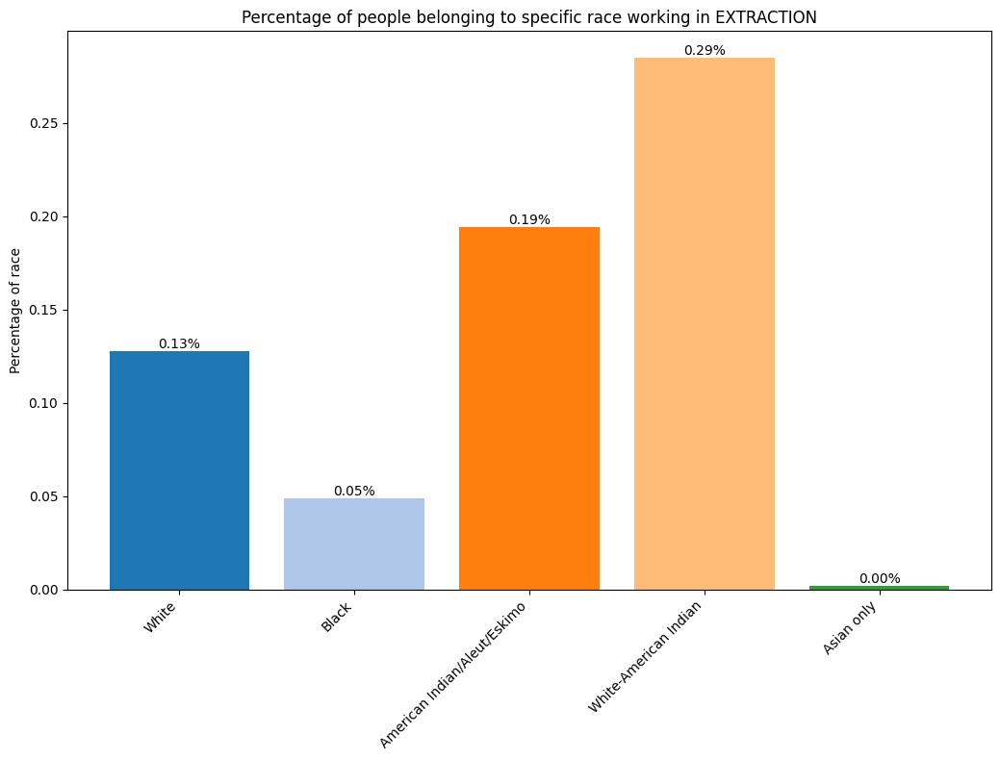

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


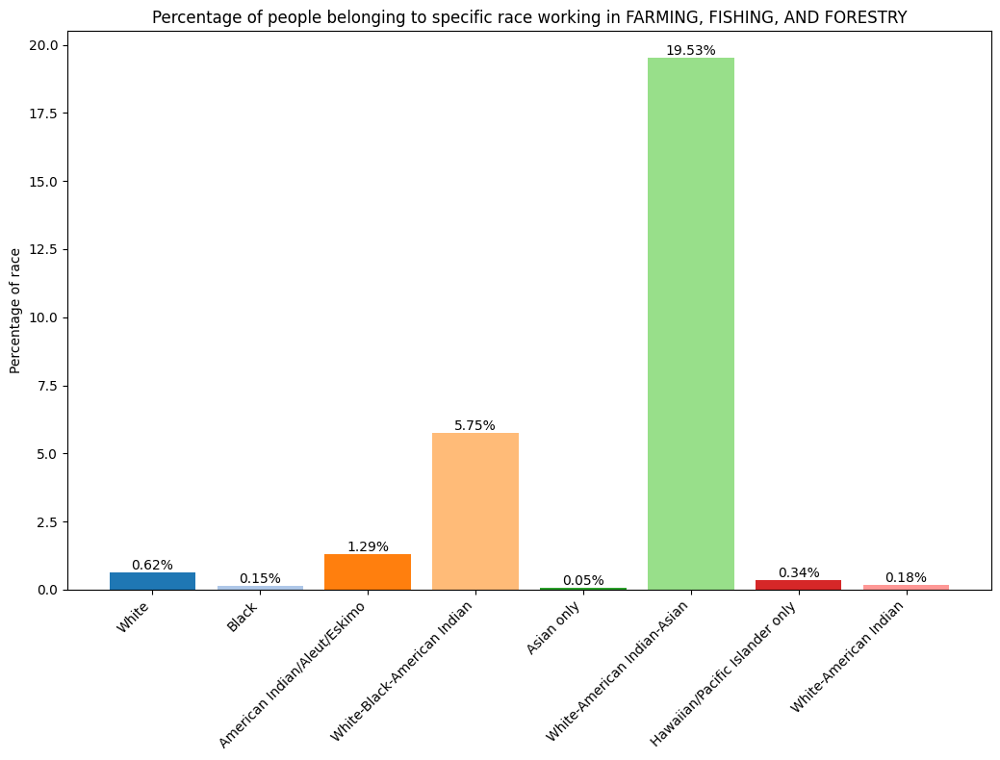

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


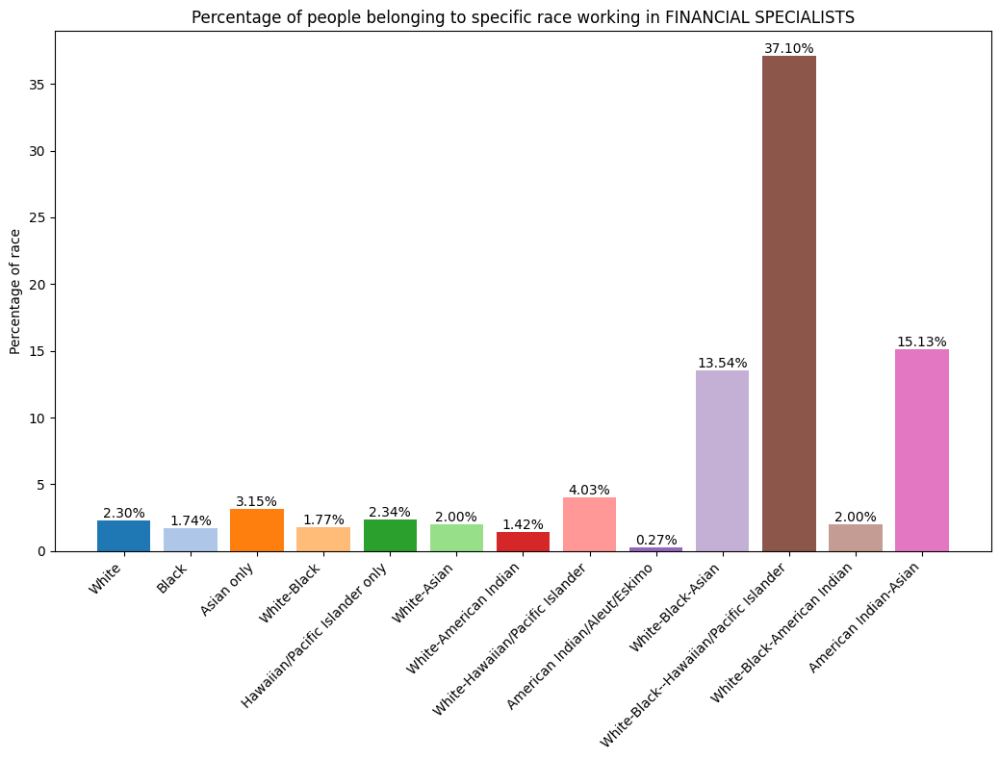

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


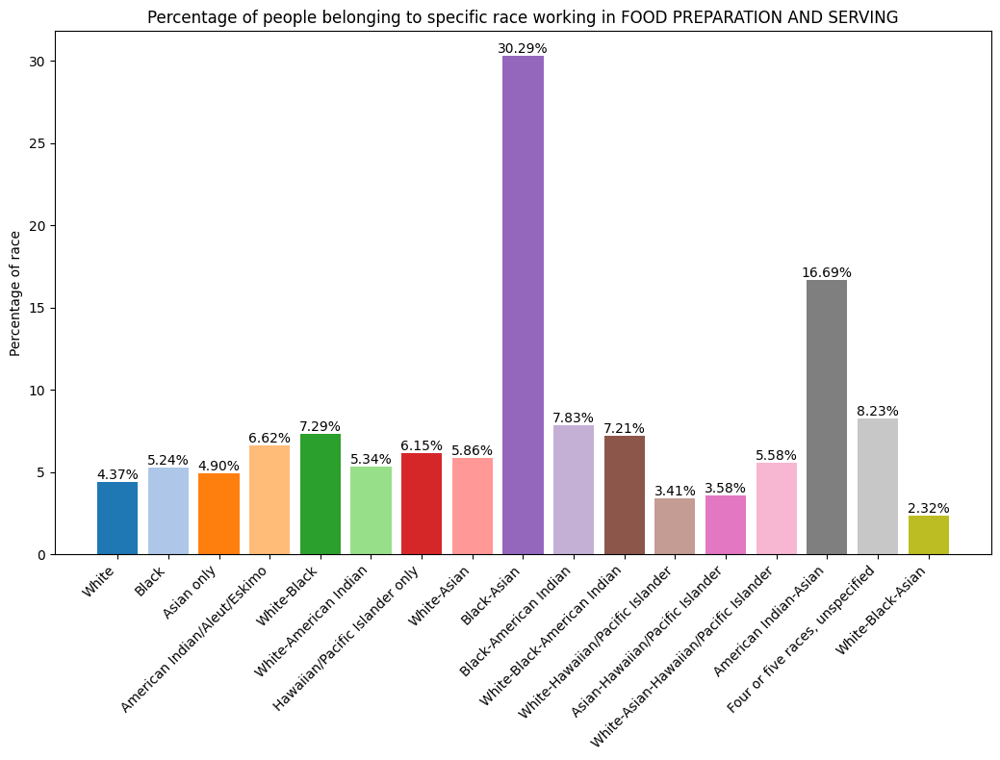

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


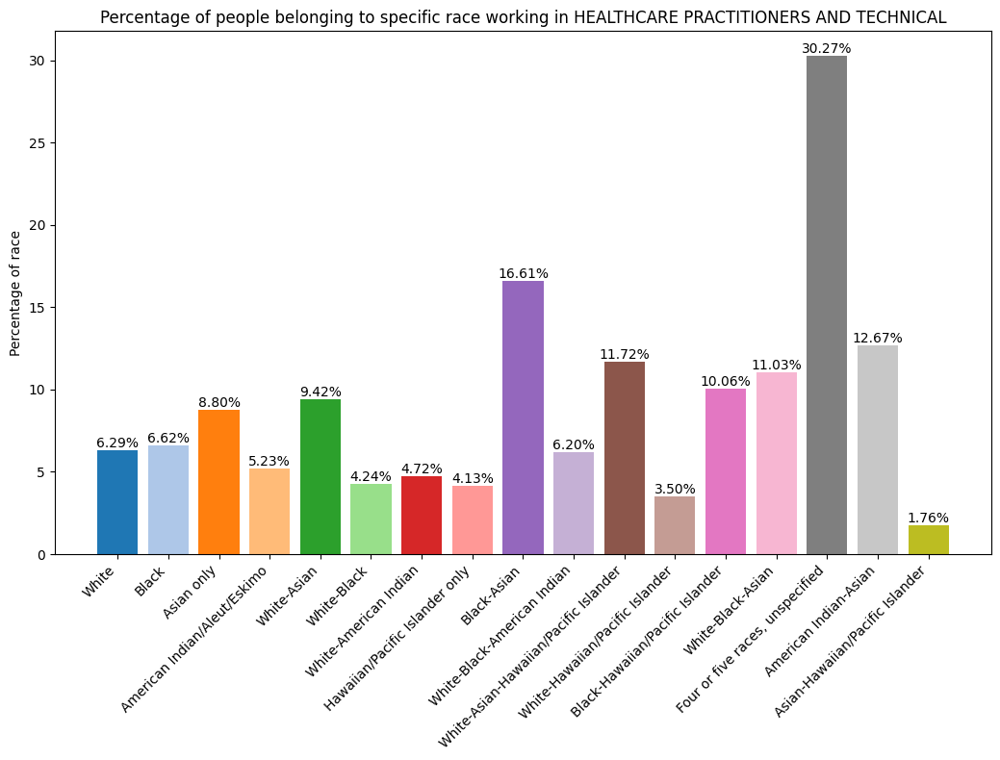

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


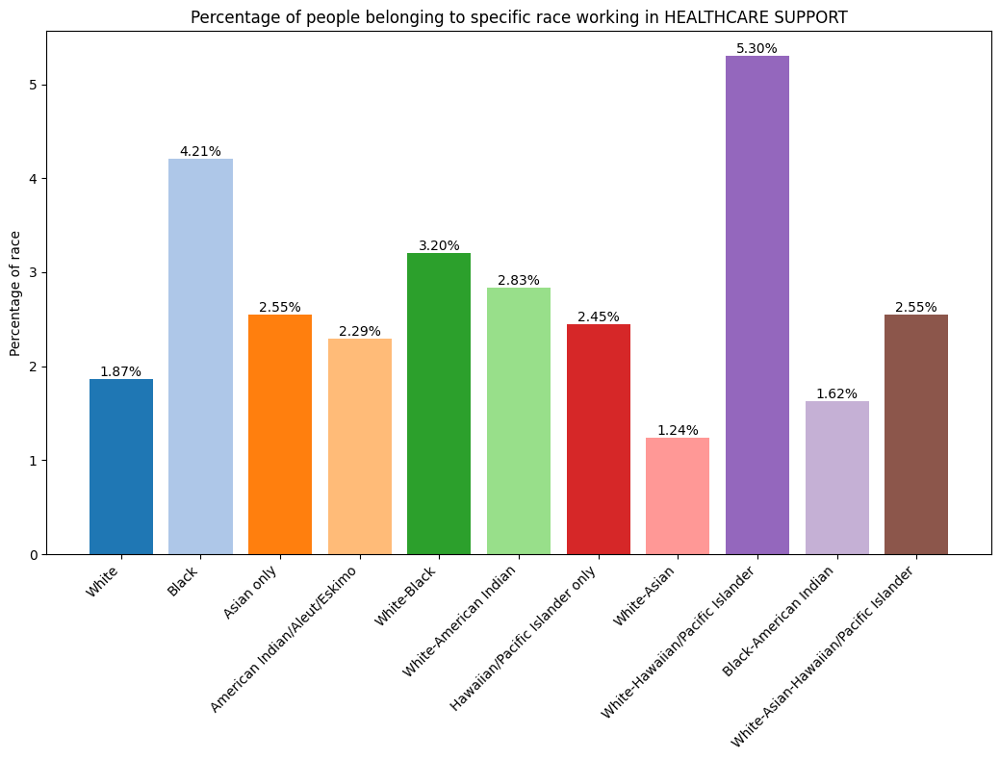

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


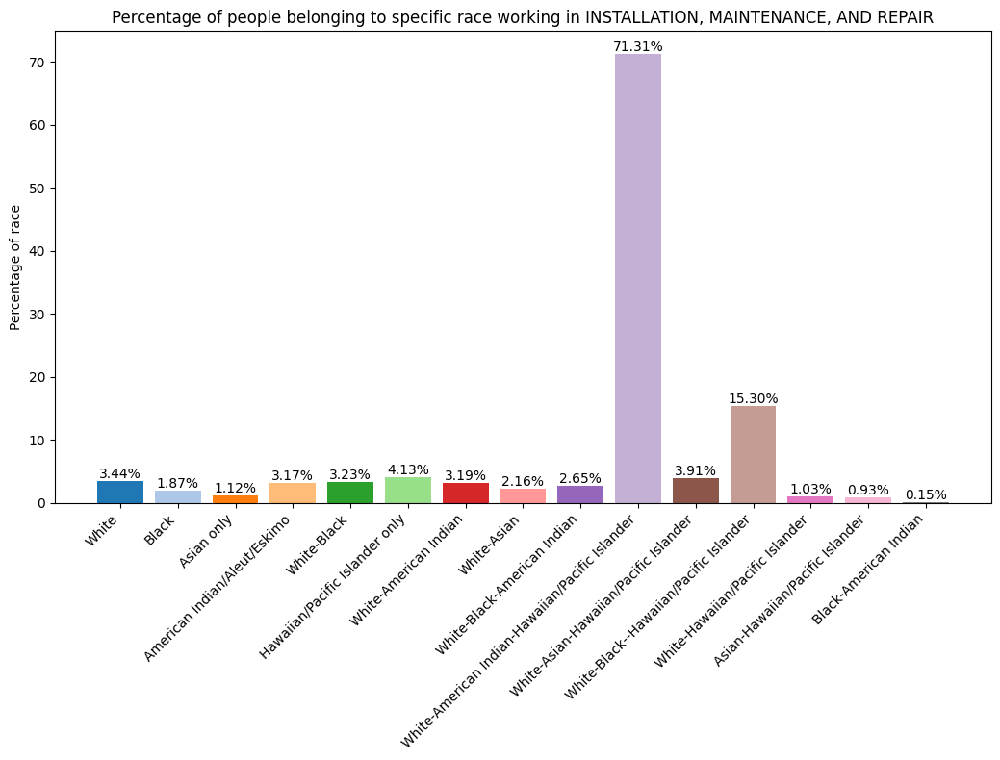

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


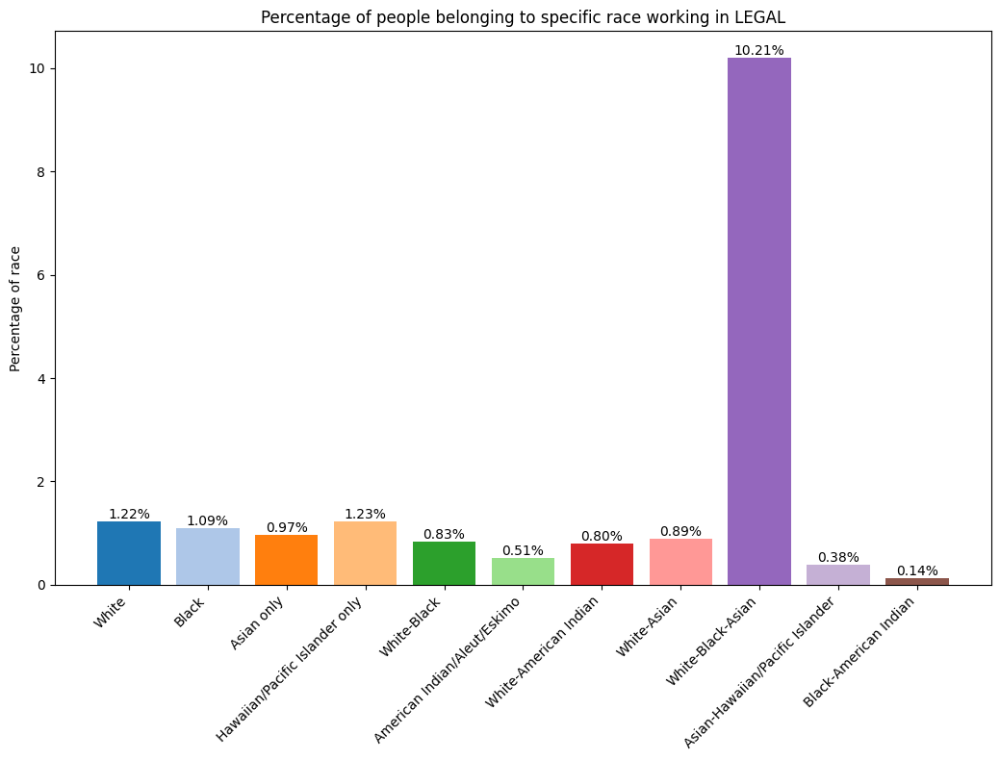

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


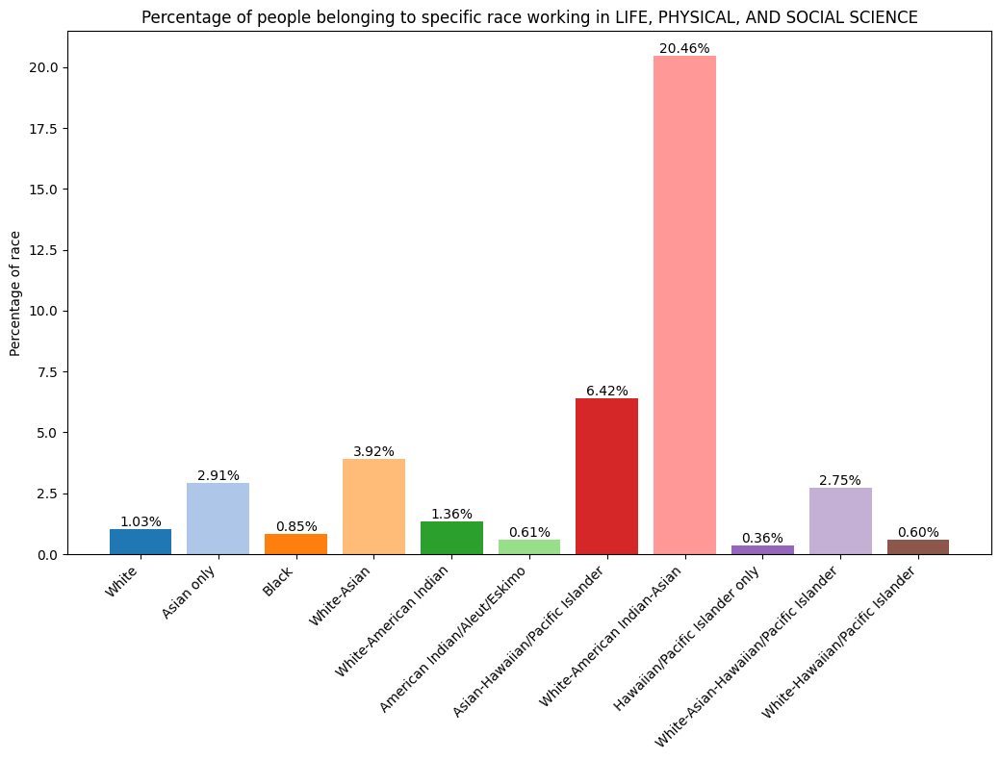

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


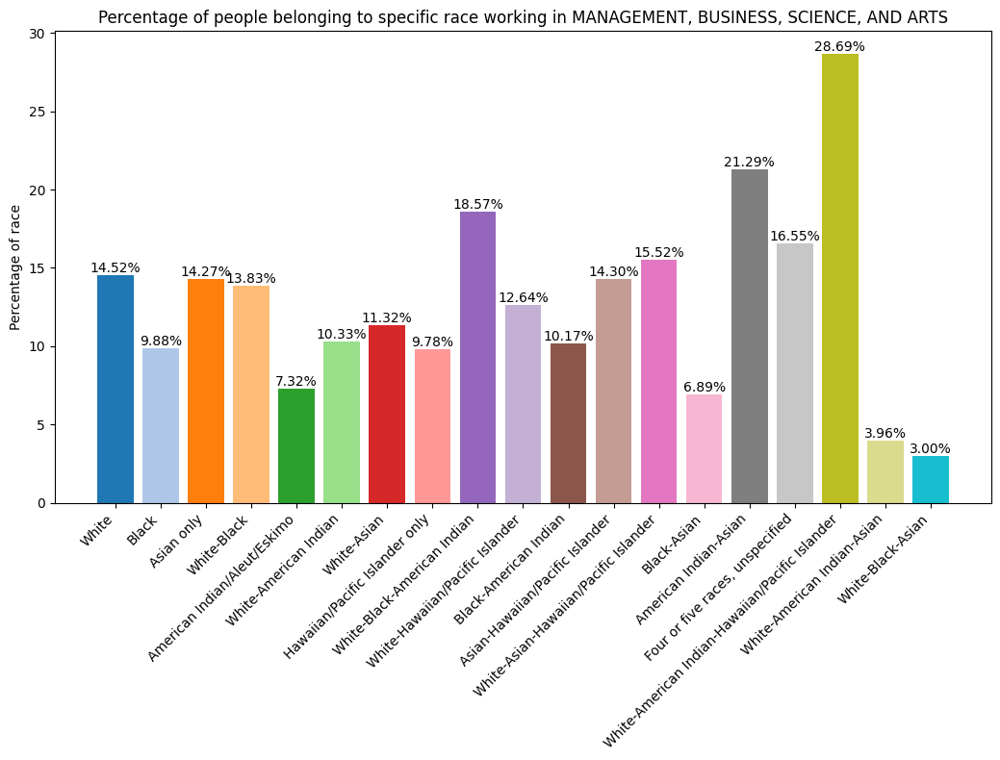

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


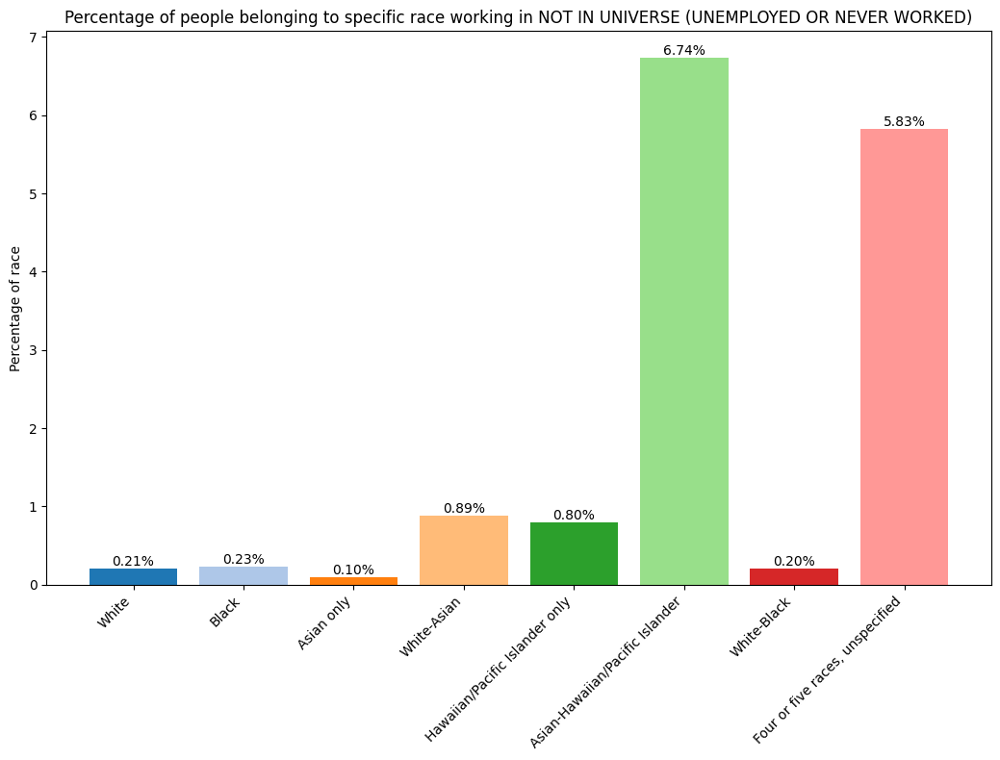

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


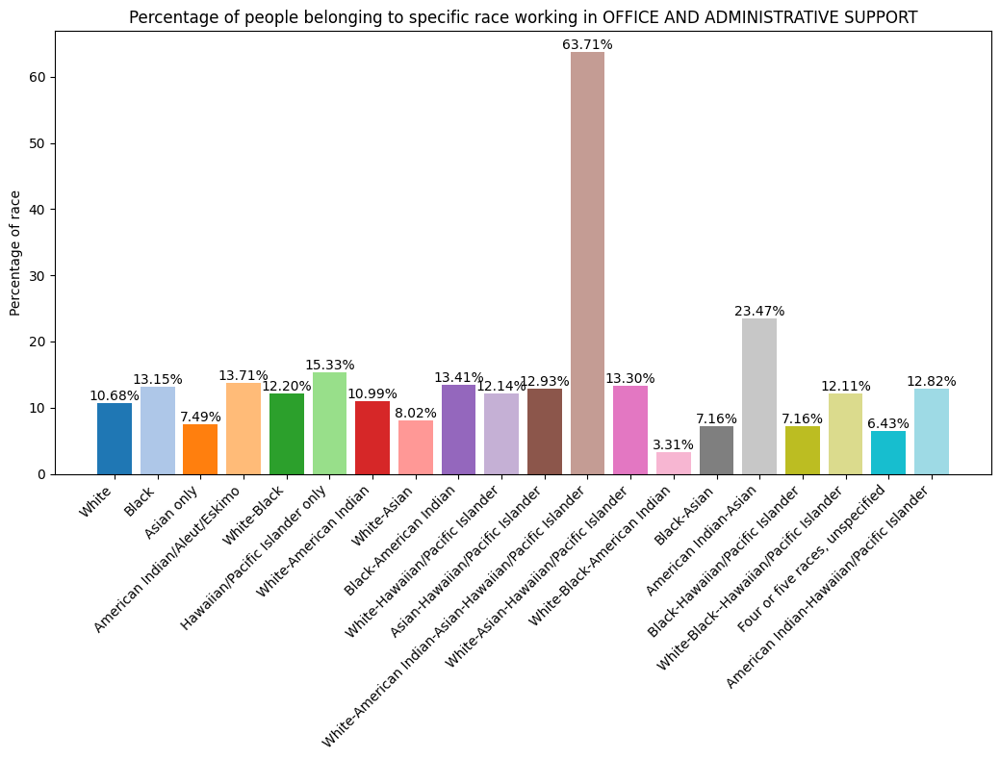

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


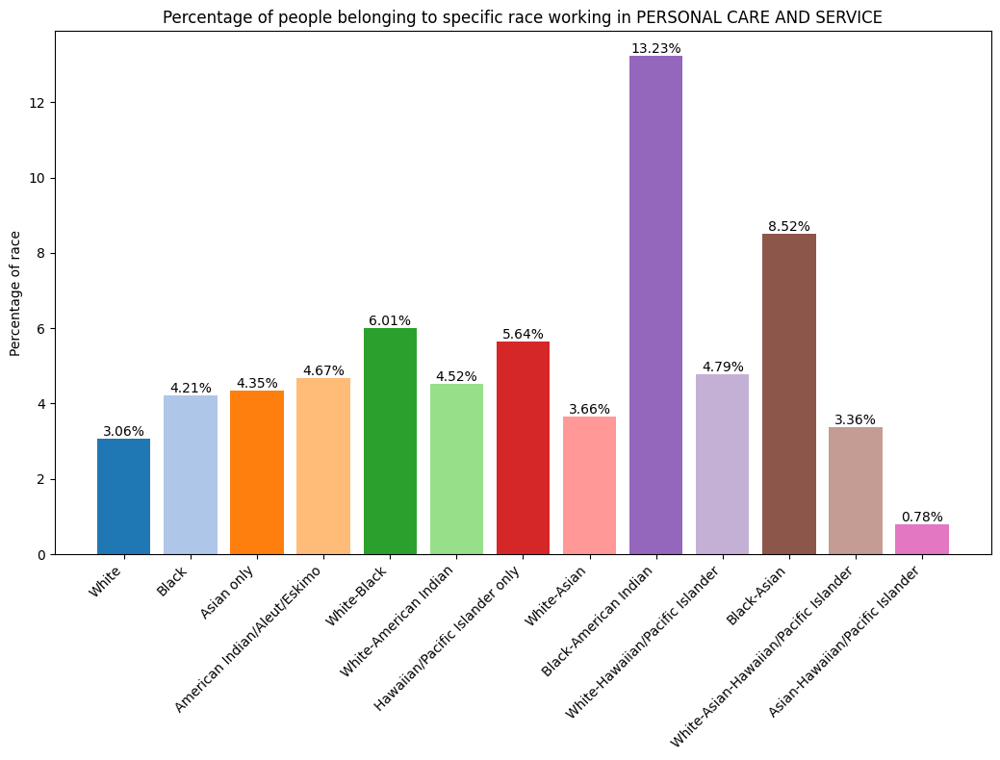

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


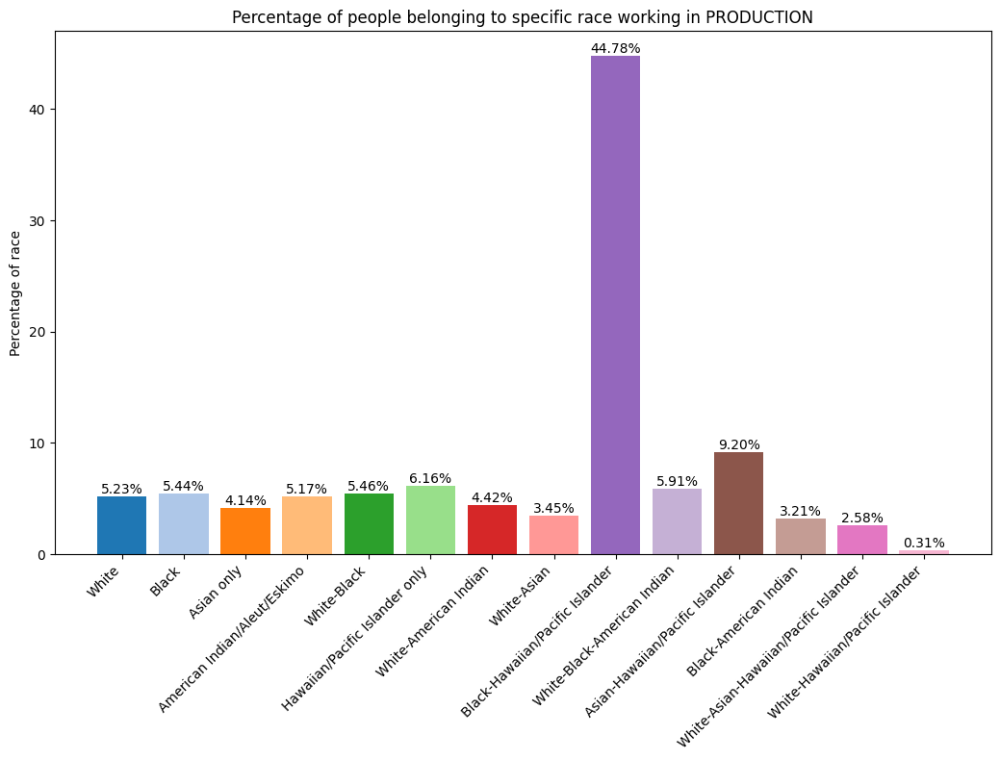

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


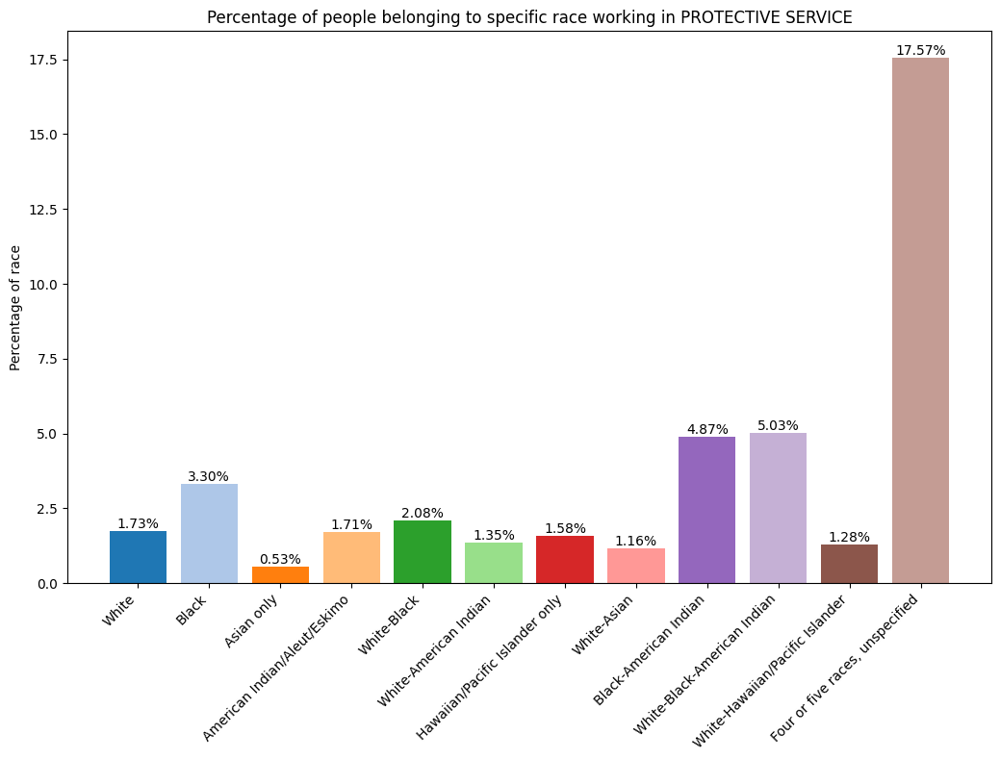

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


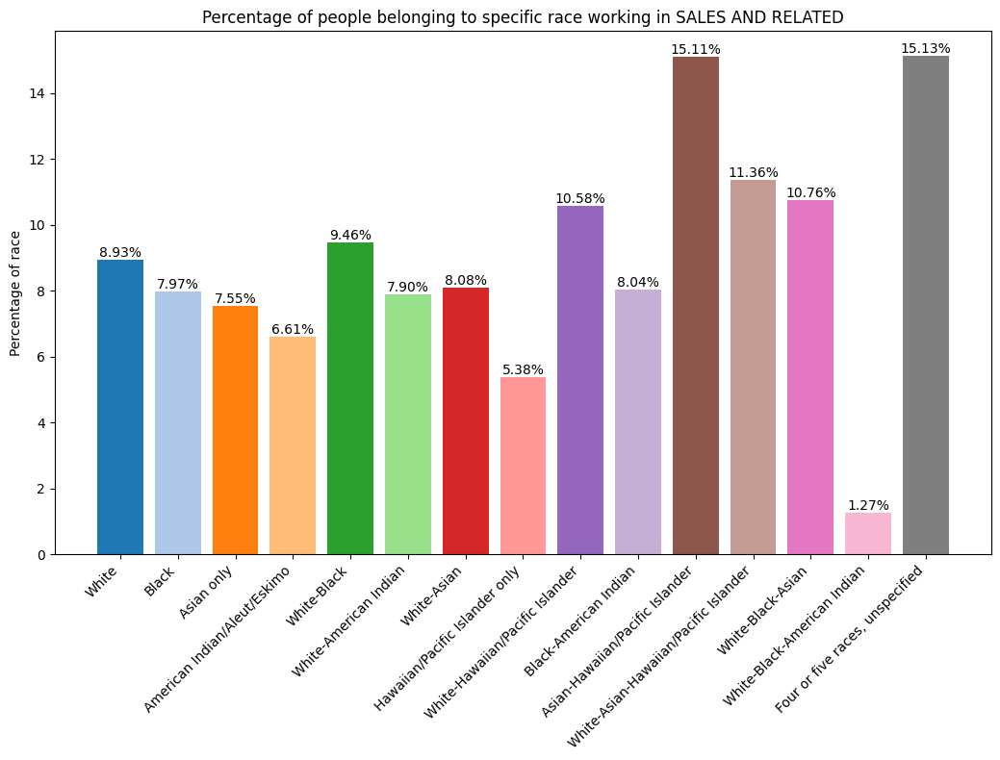

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


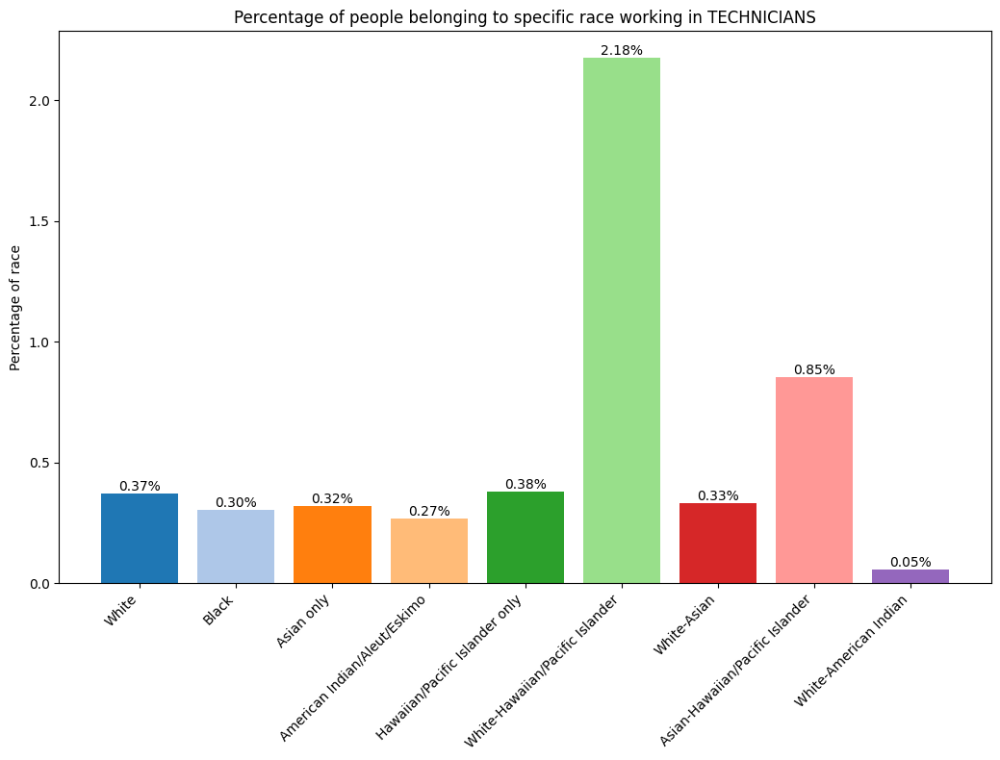

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


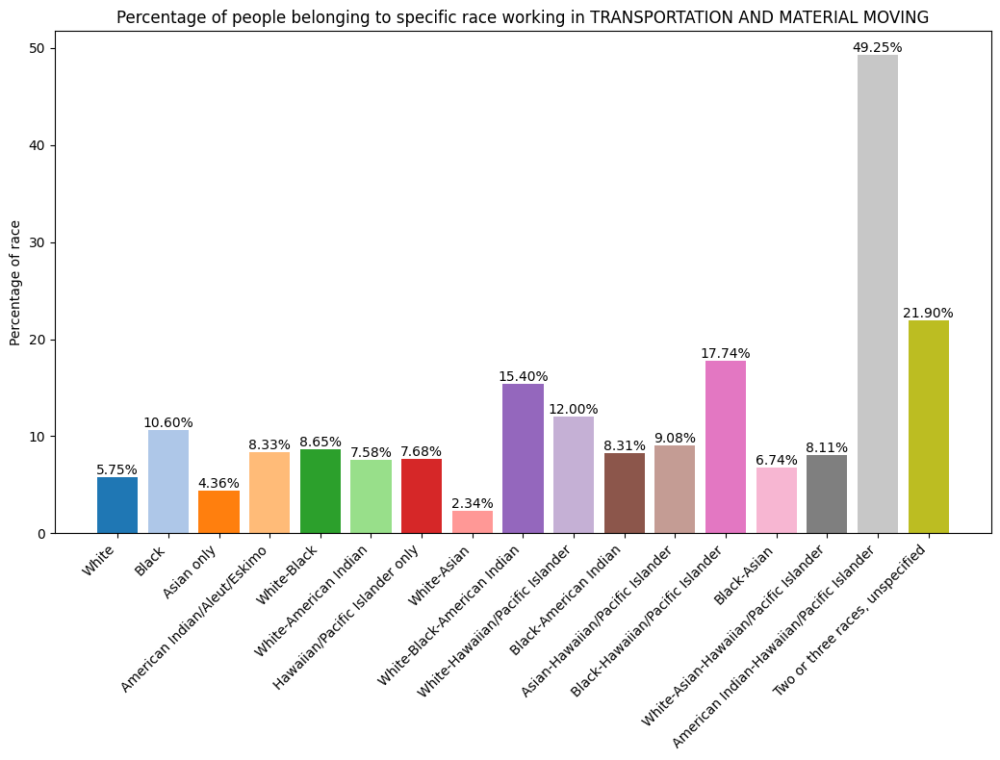

In [27]:
plot_occ_races(race_occ_df, races, True, True)

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title']).size().reset_index(name='count')
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for occupation_category, group_df in grouped_df.groupby('occ_category'):
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titl

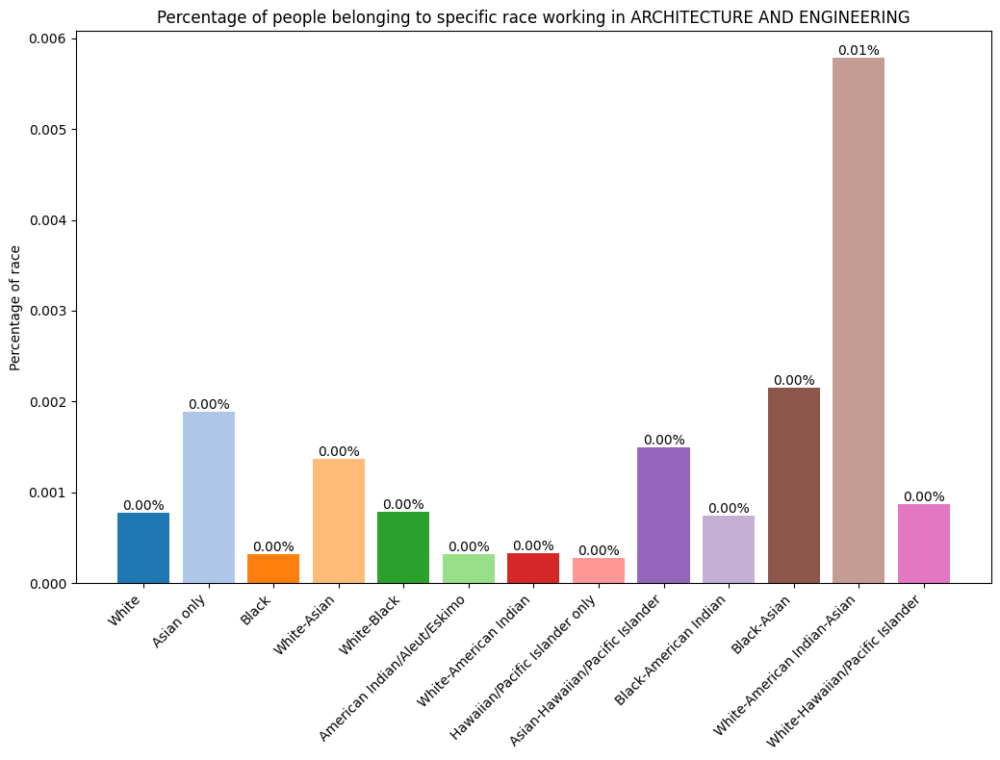

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


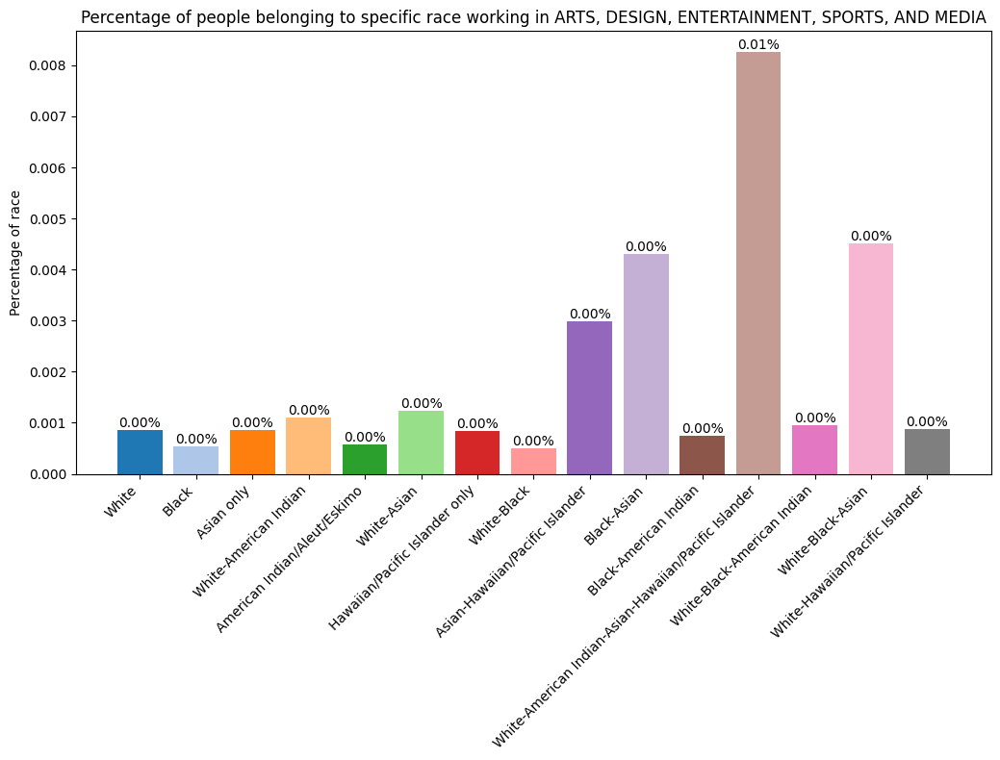

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


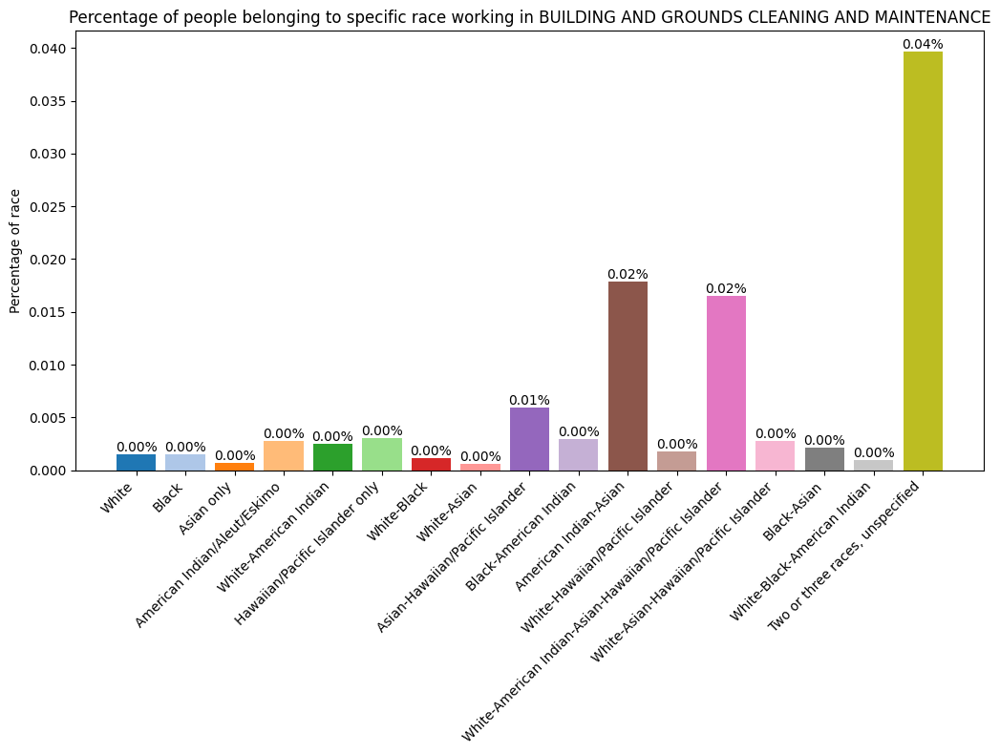

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


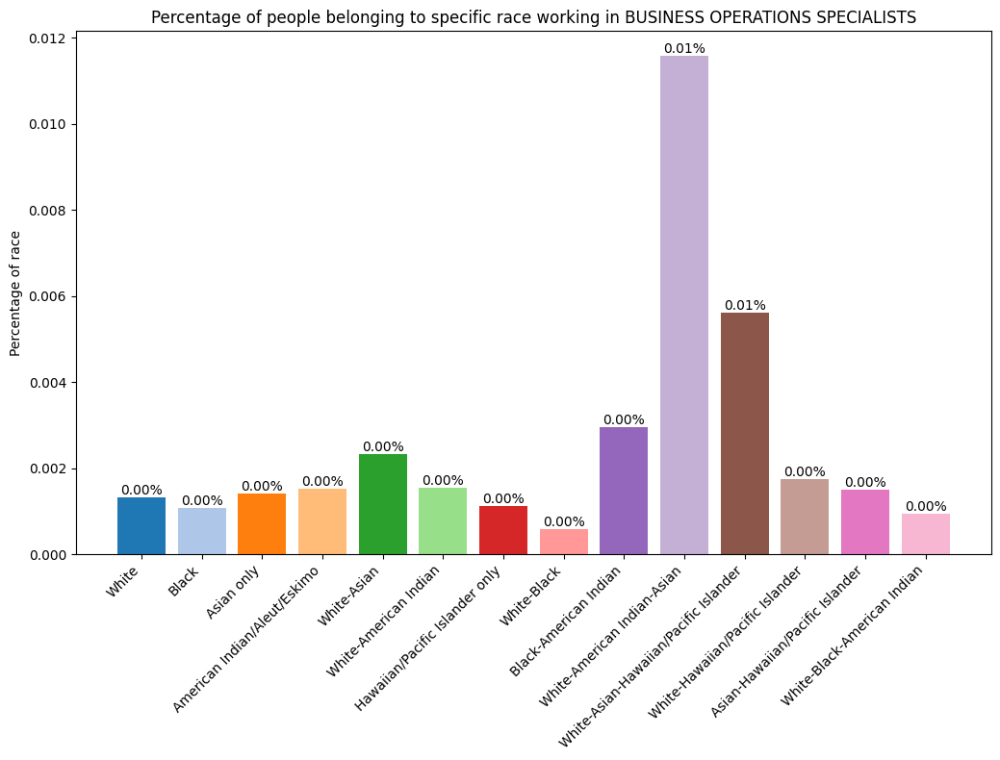

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


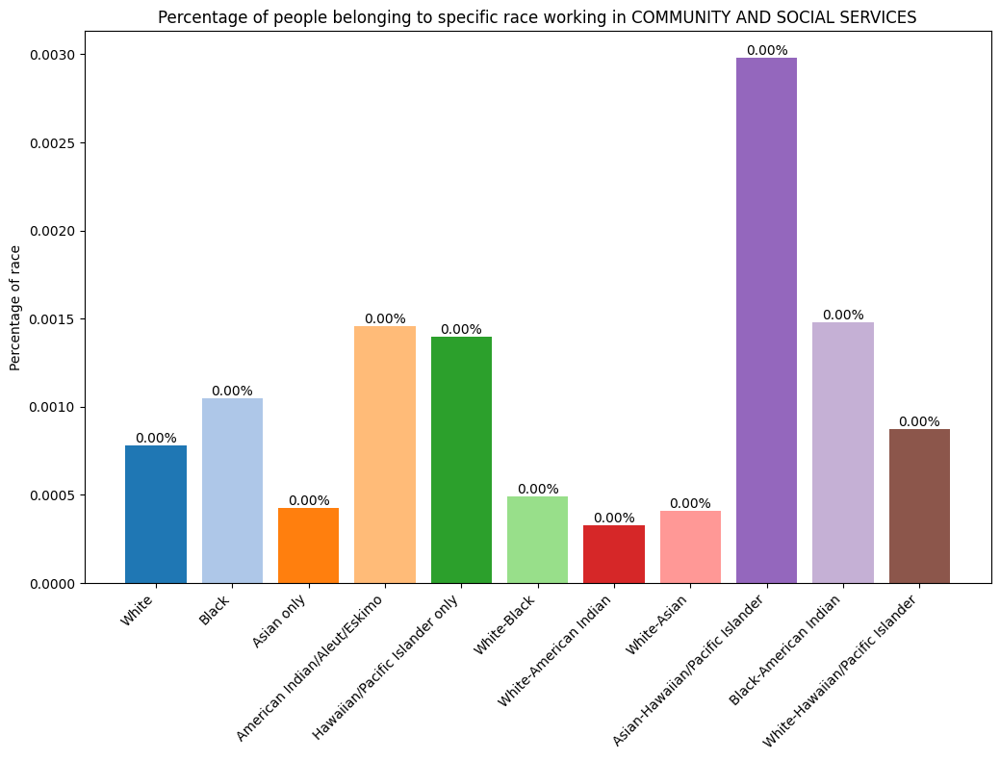

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


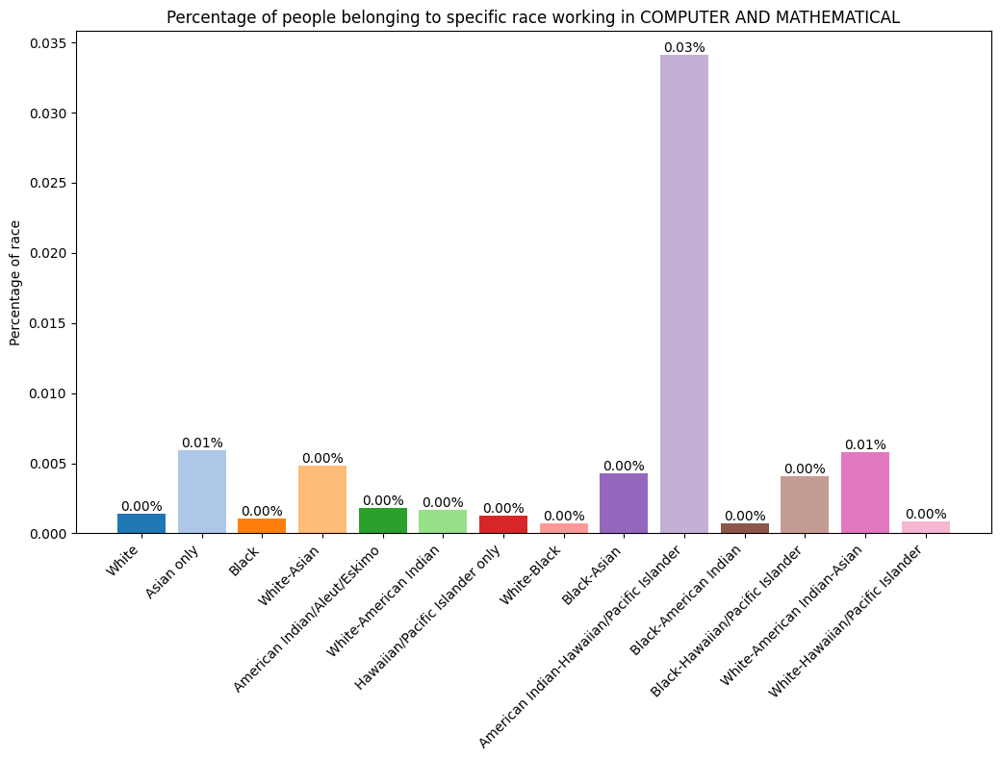

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


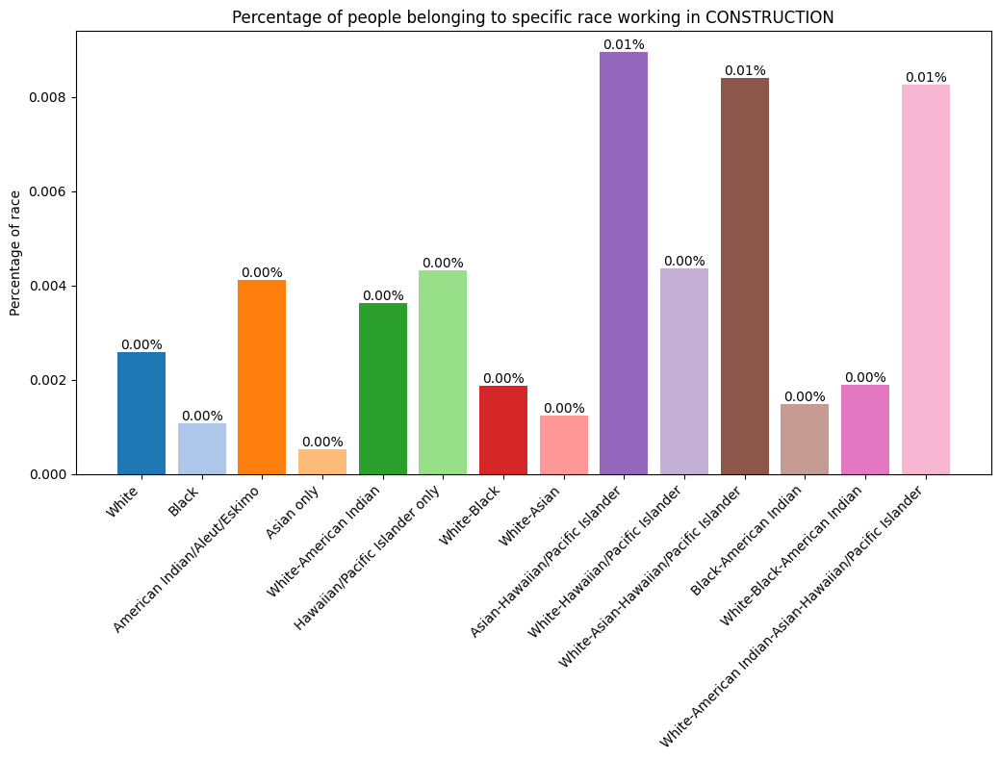

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


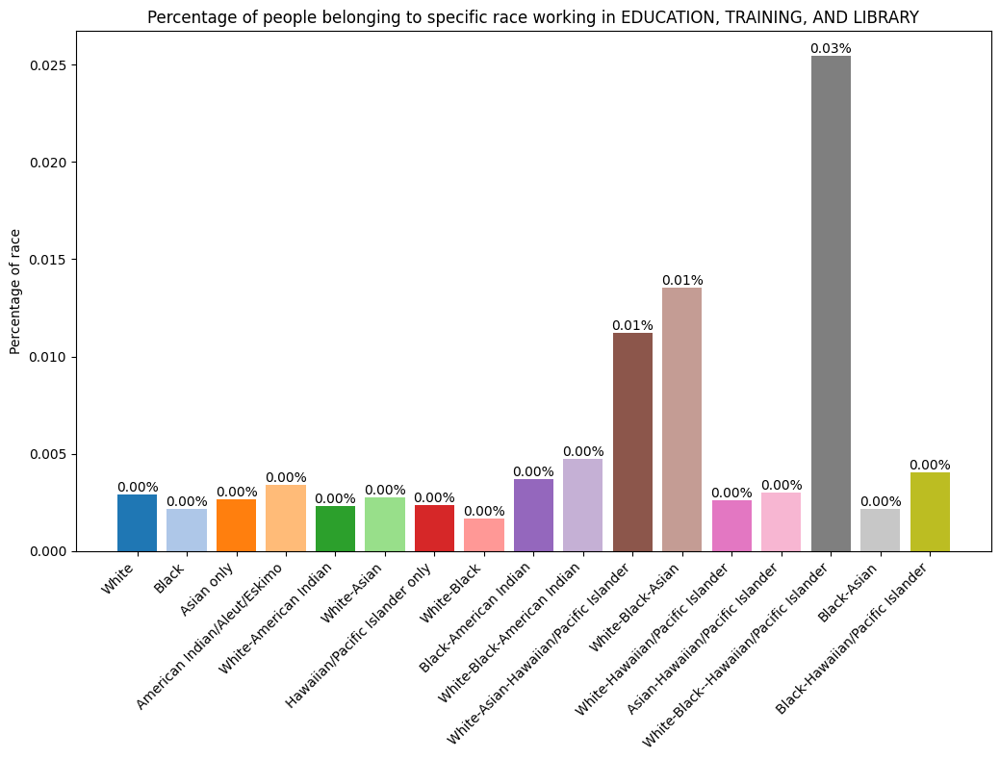

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


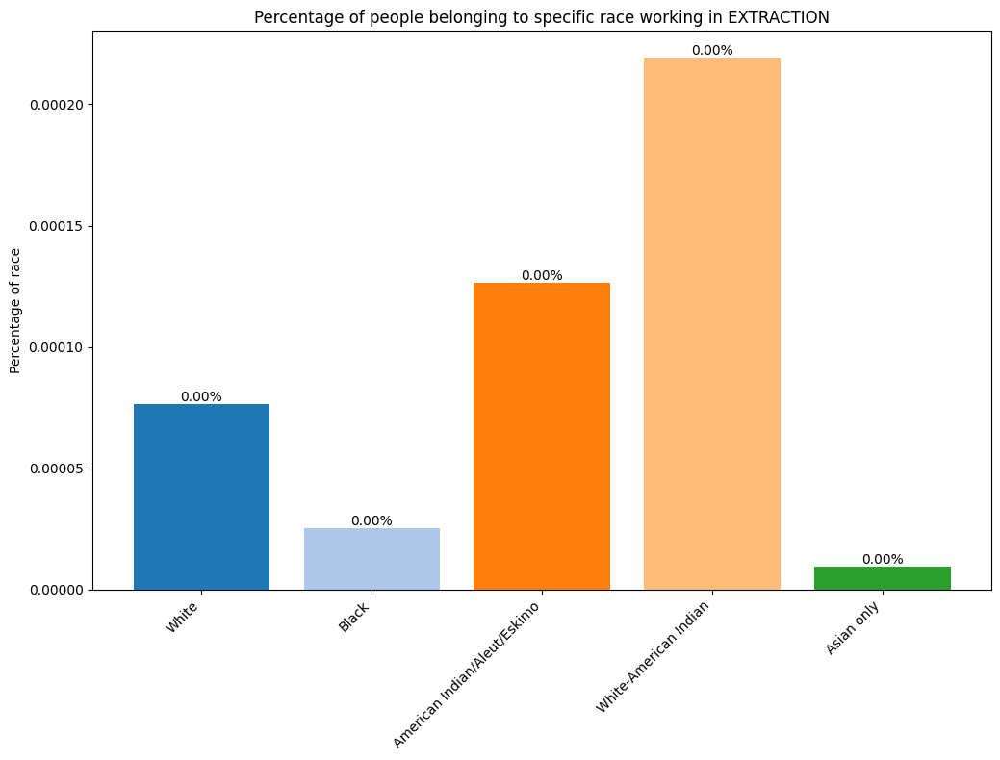

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


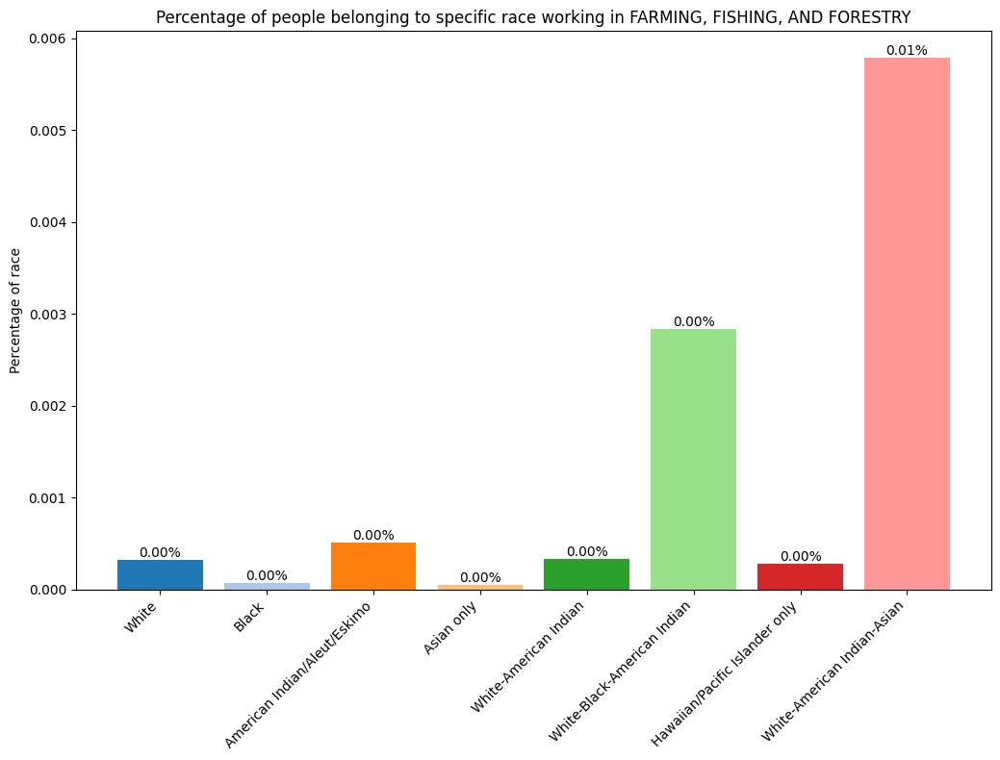

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


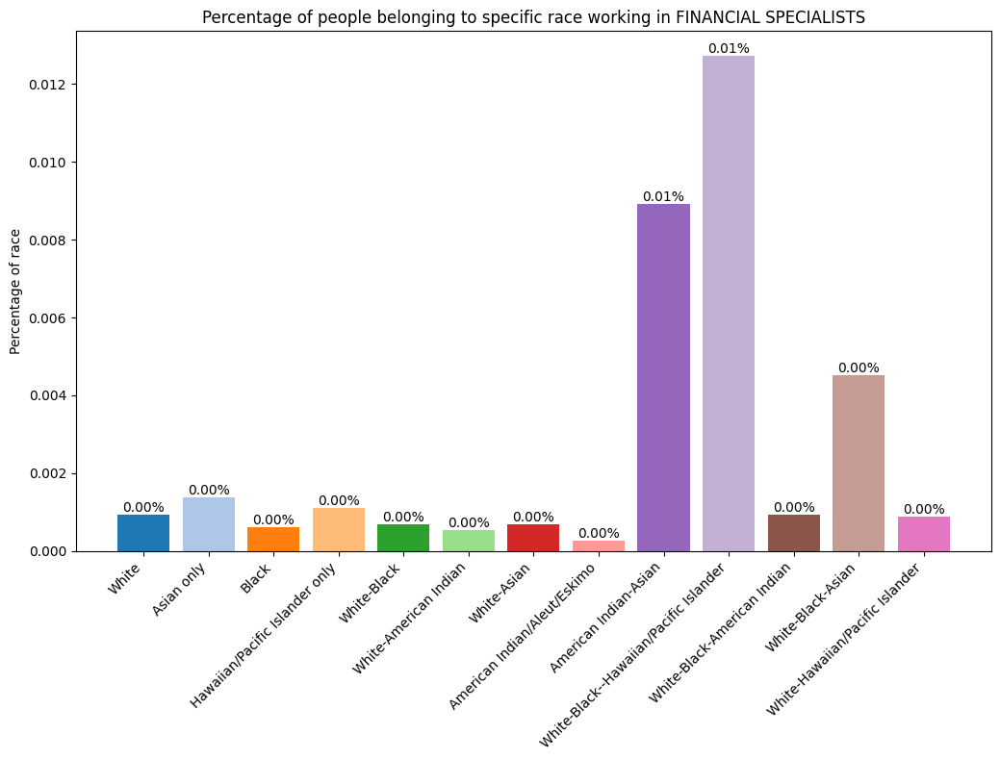

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


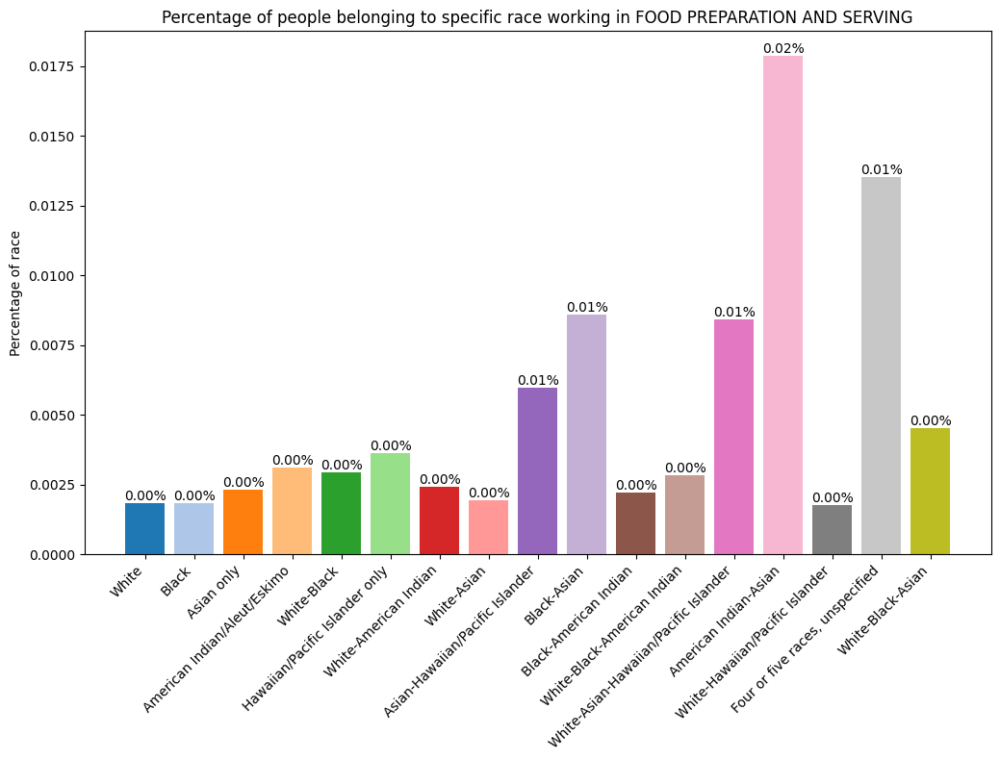

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


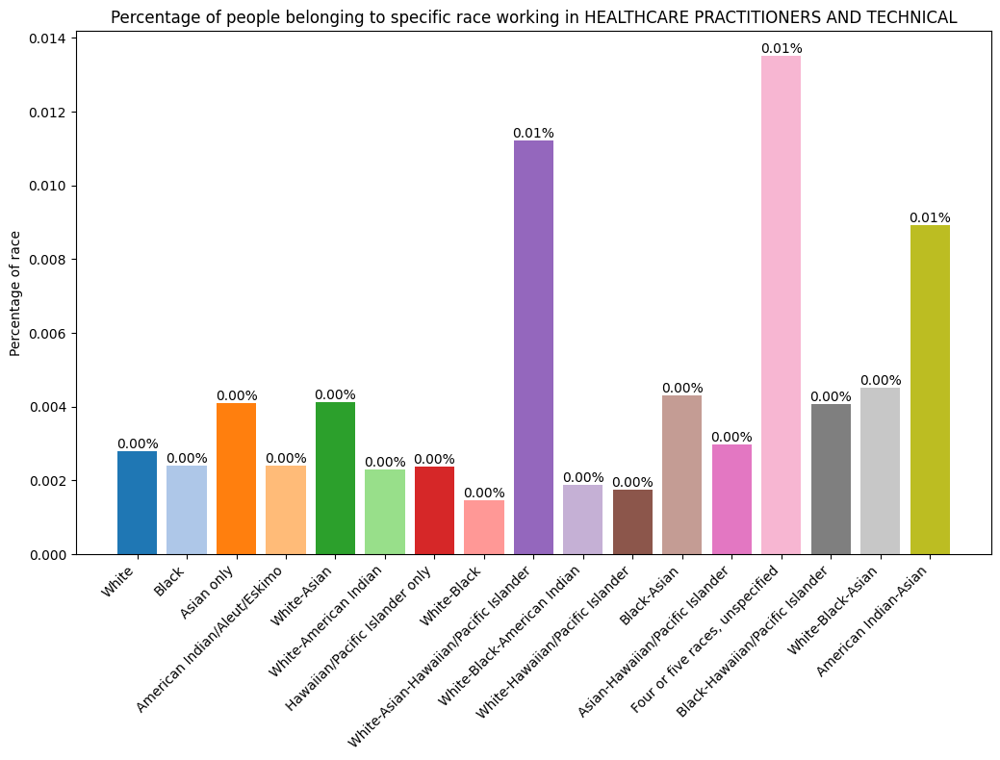

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


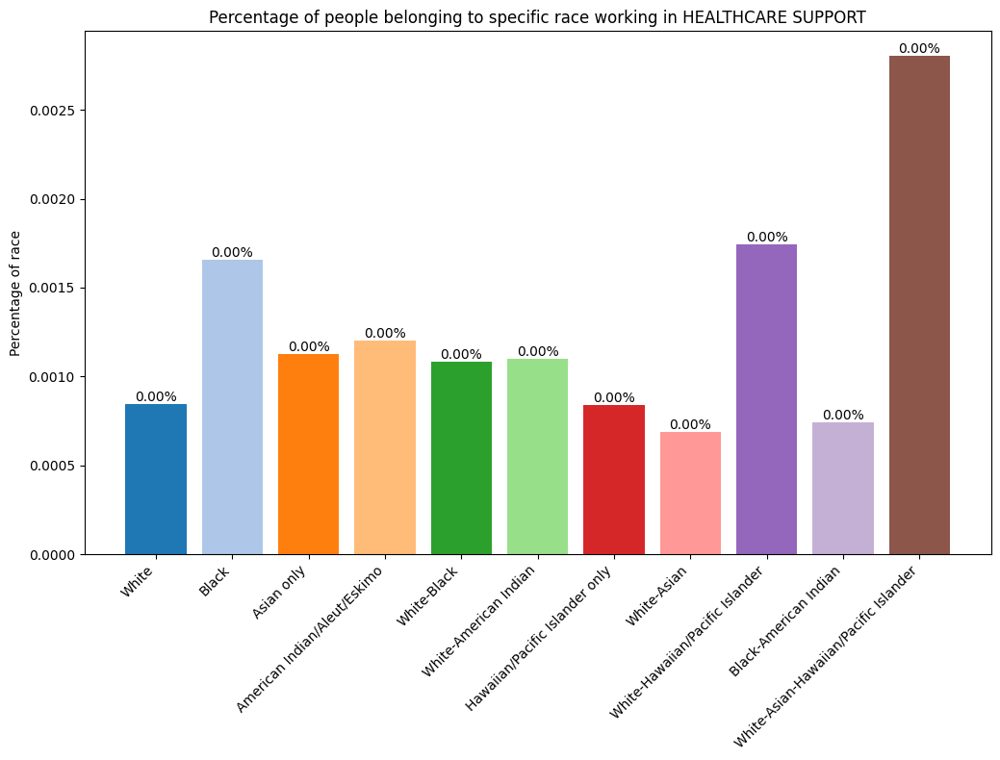

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


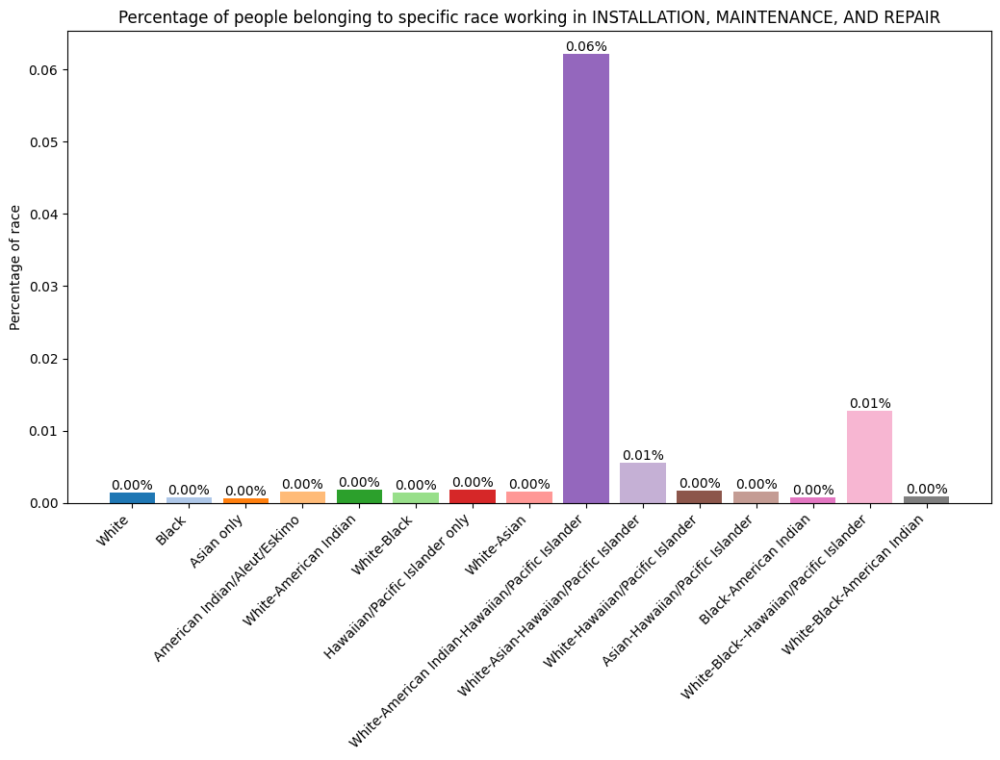

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


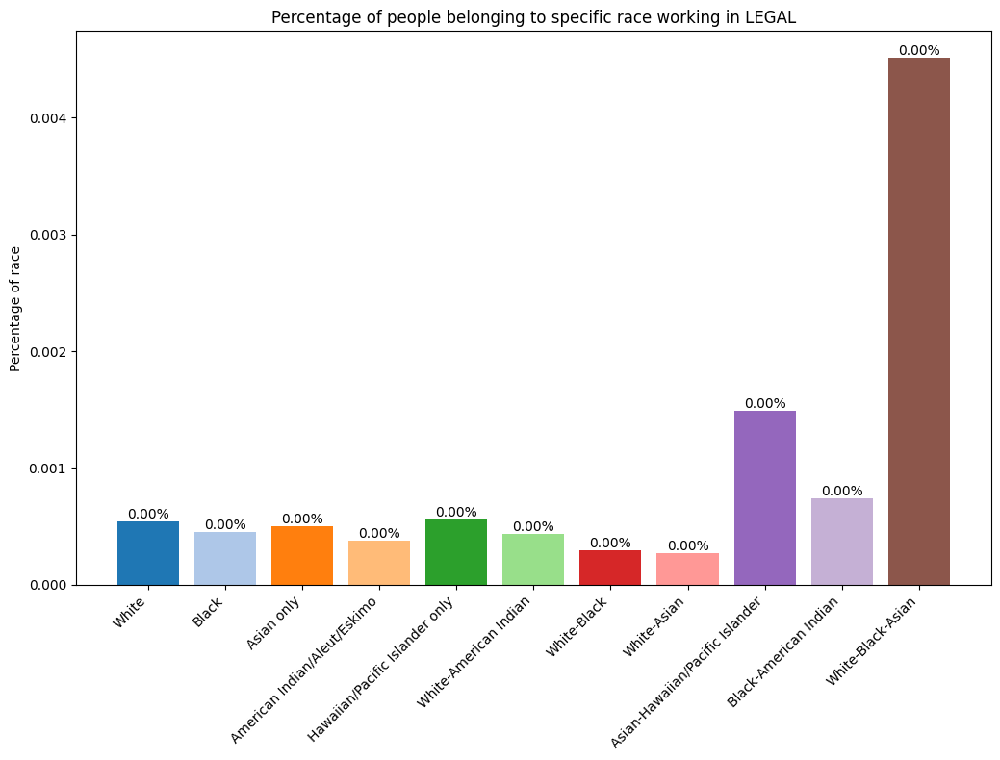

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


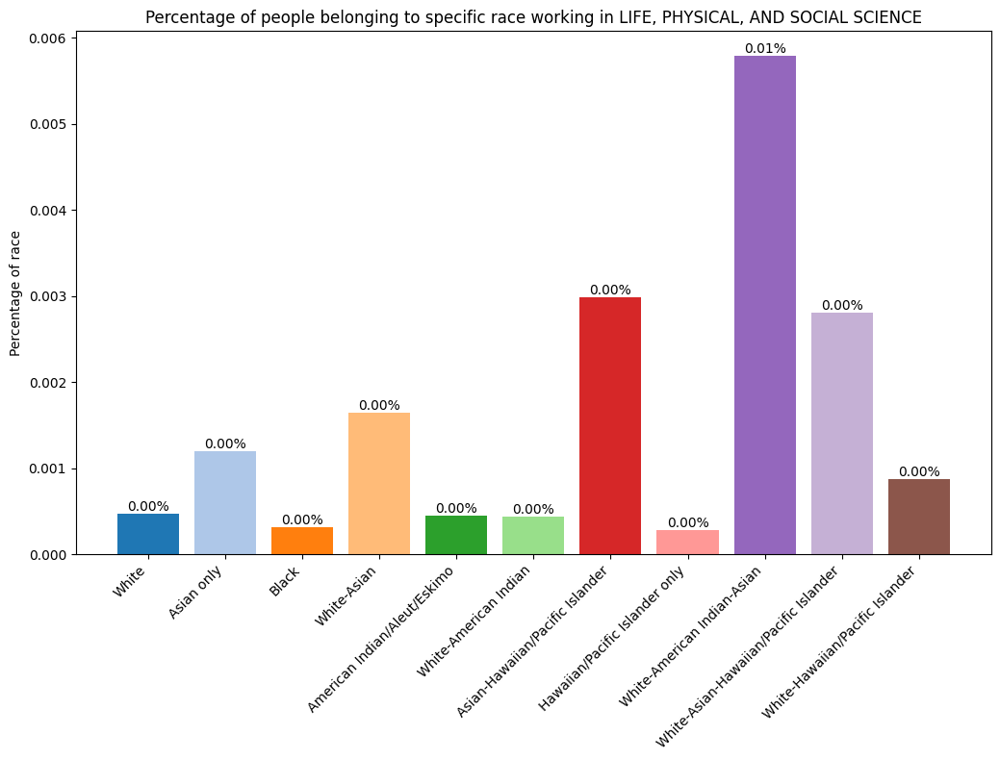

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


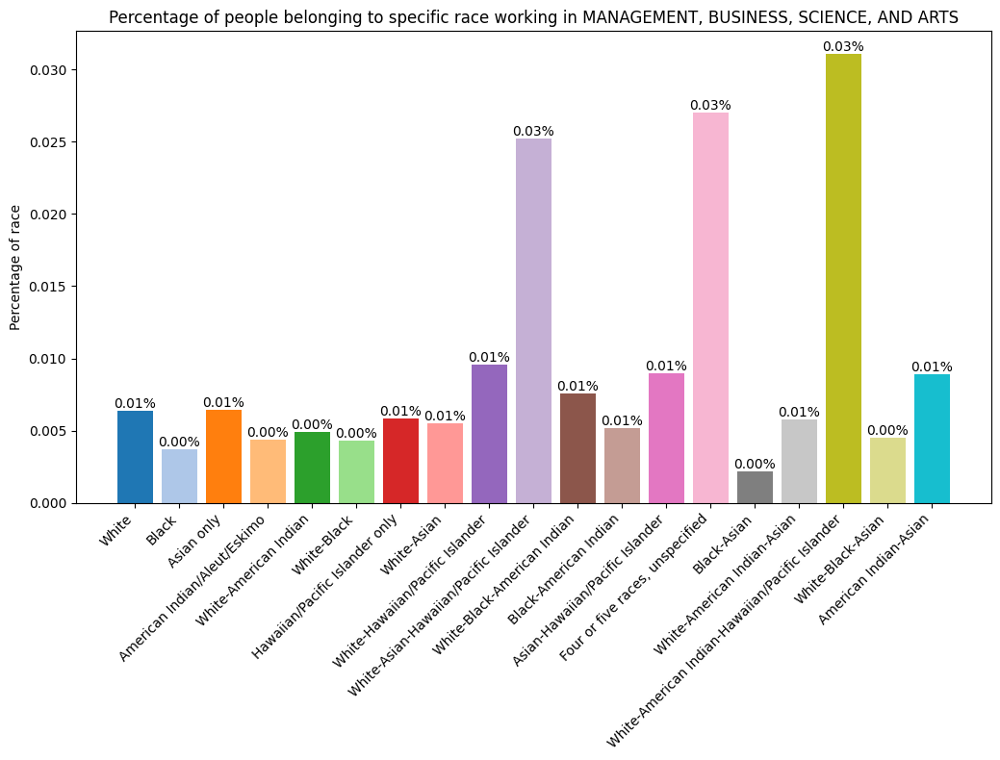

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


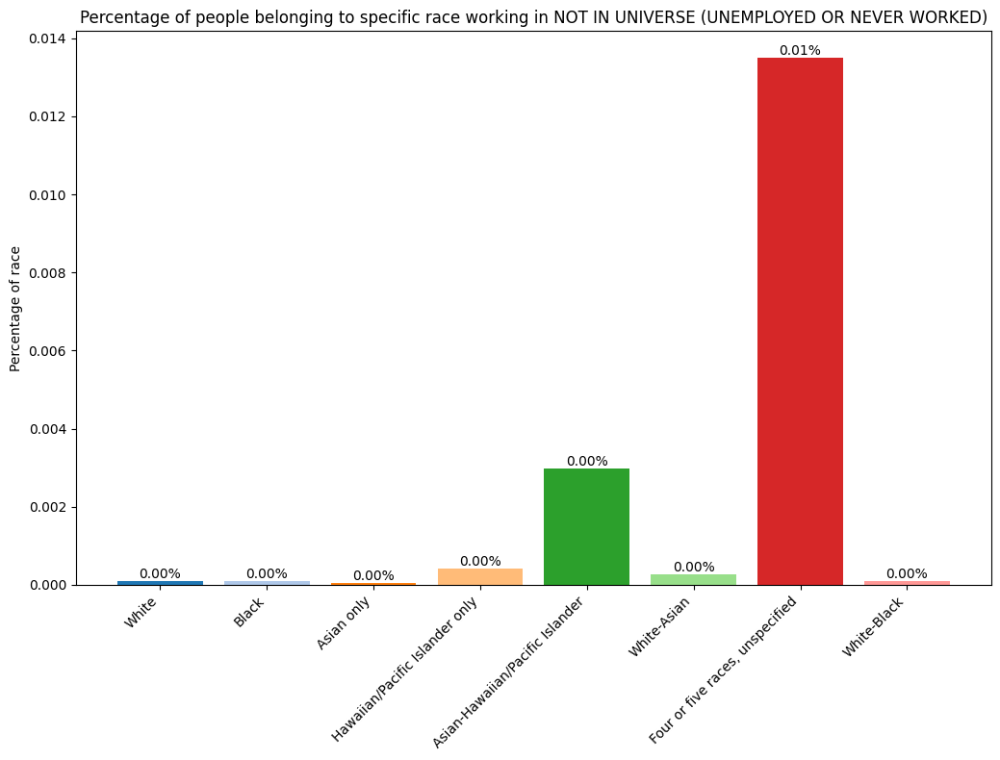

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


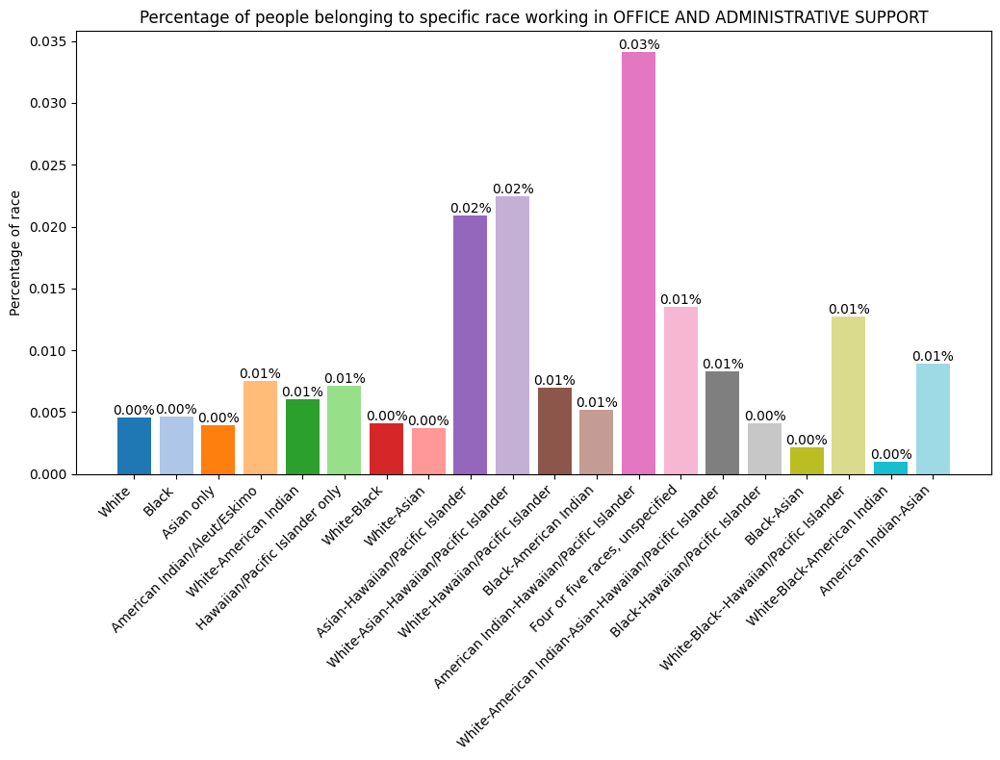

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


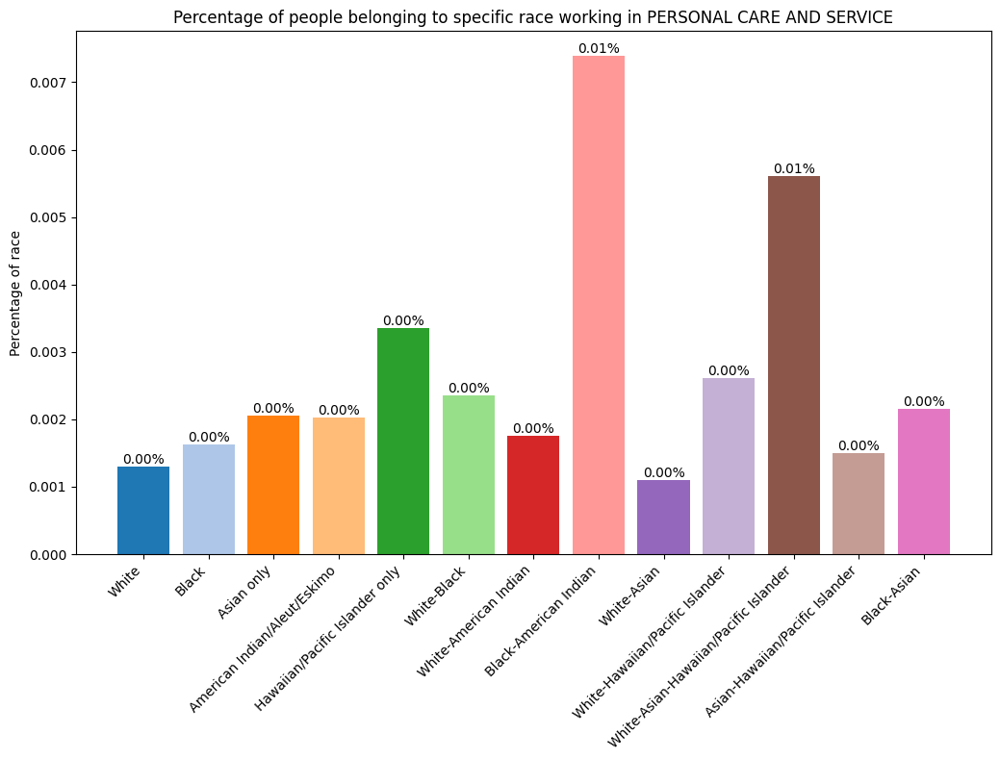

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


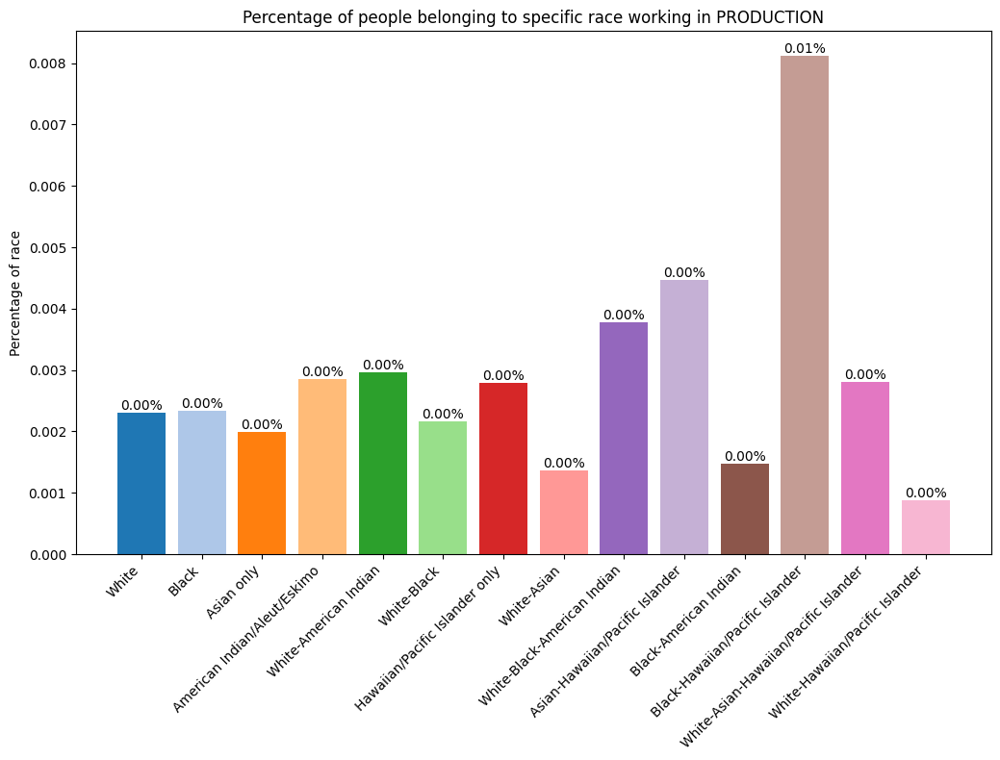

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


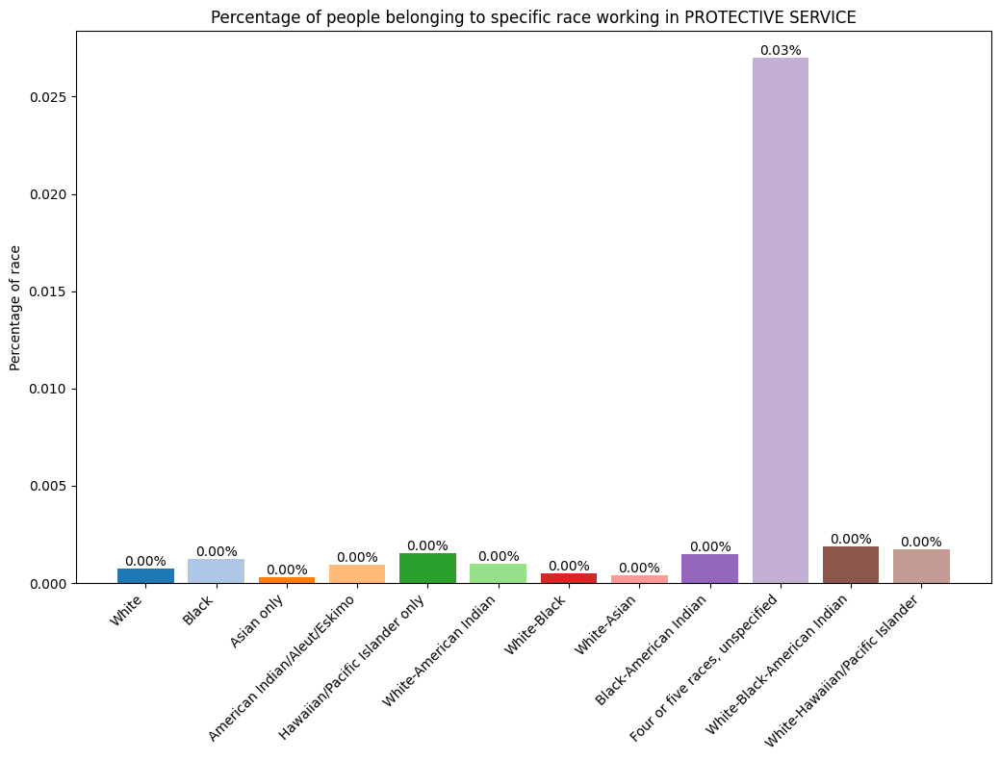

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


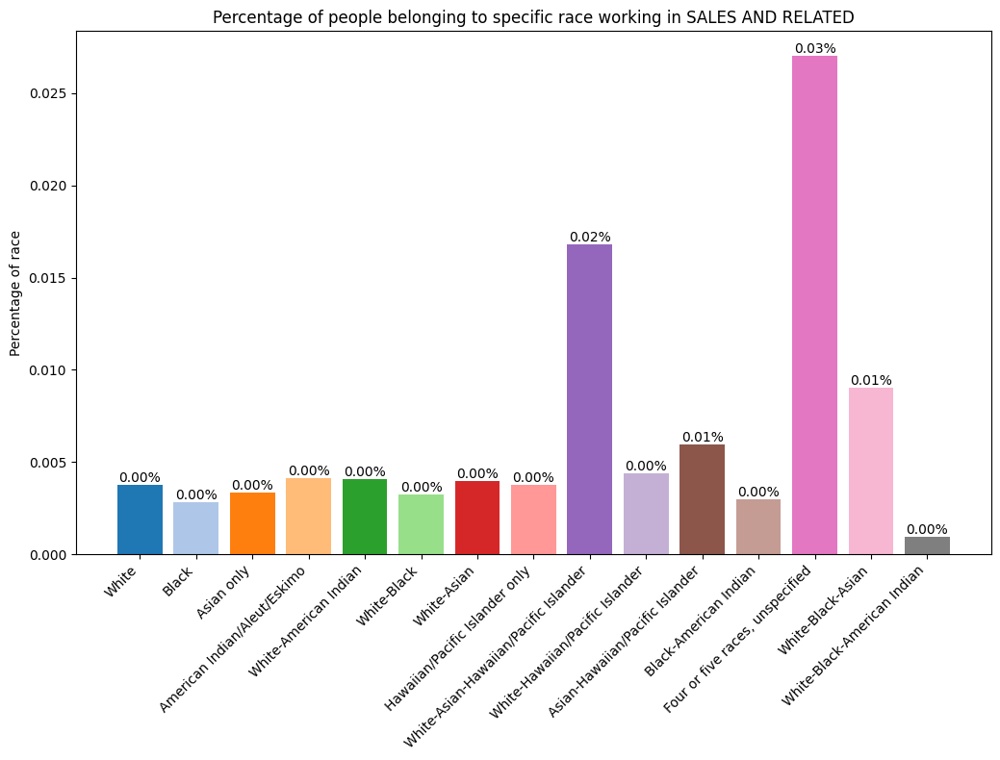

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


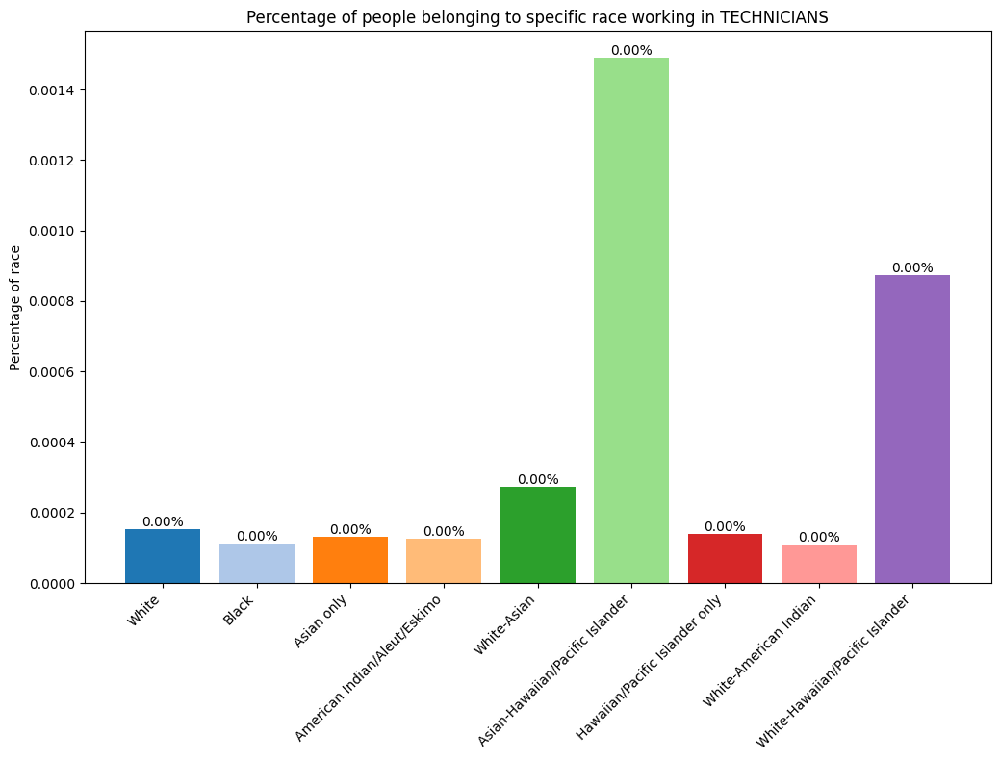

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


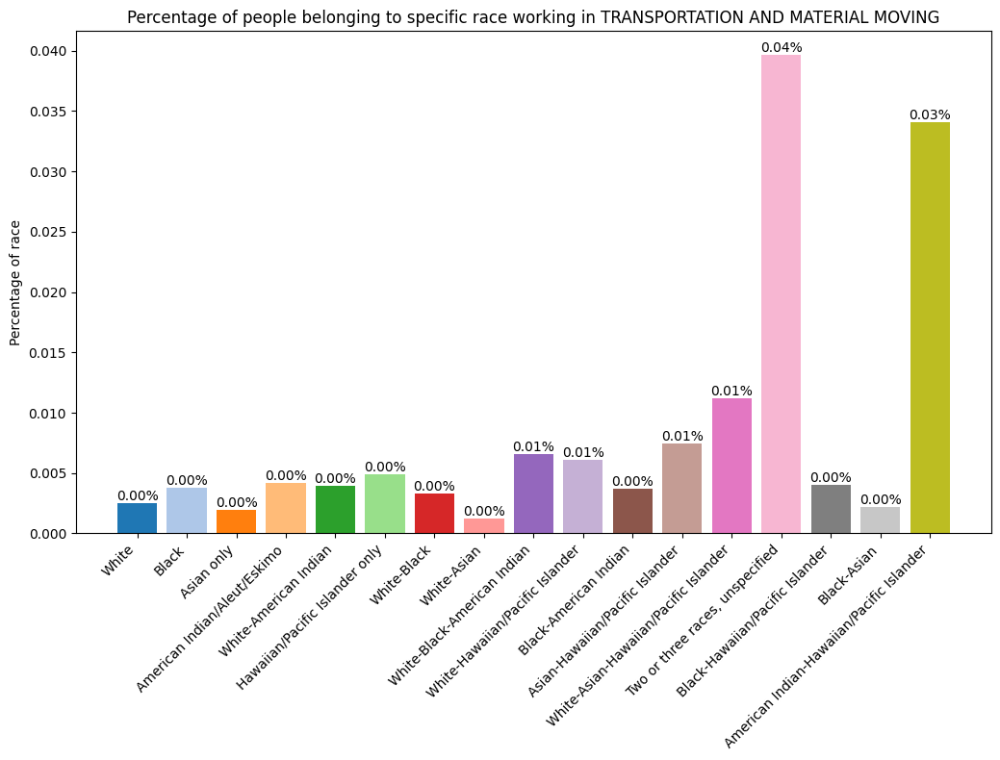

In [28]:
plot_occ_races(race_occ_df, races, True)

Weight (ASECWT)

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title'])['ASECWT'].sum().reset_index()
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for occupation_category, group_df in grouped_df.groupby('occ_category'):
C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles,

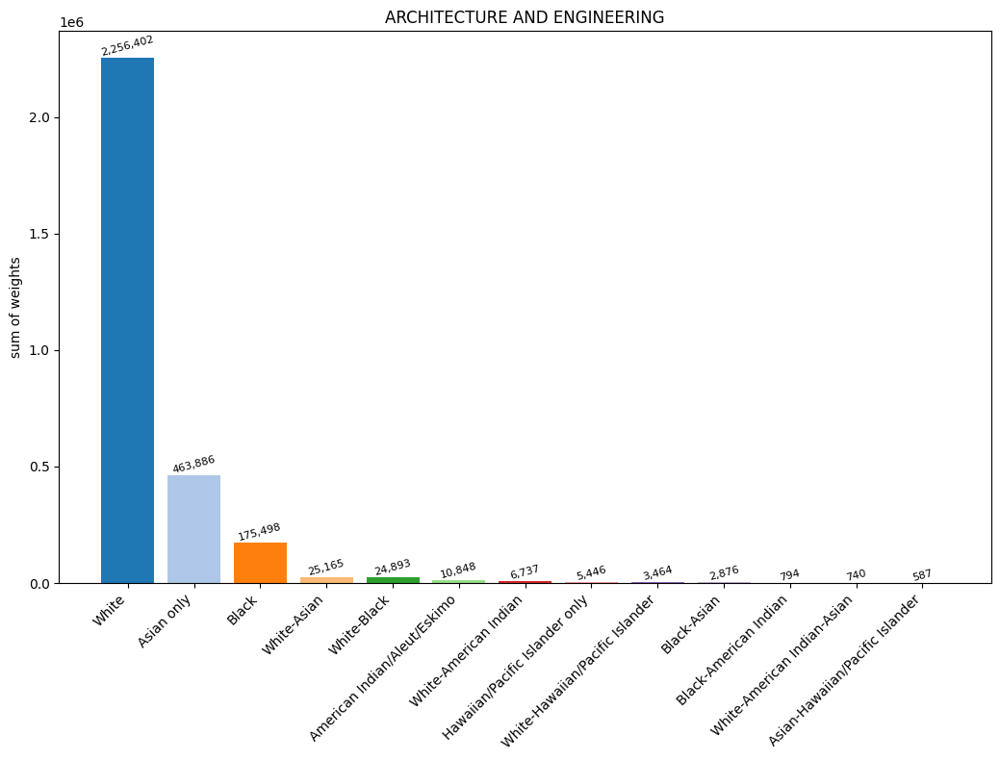

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


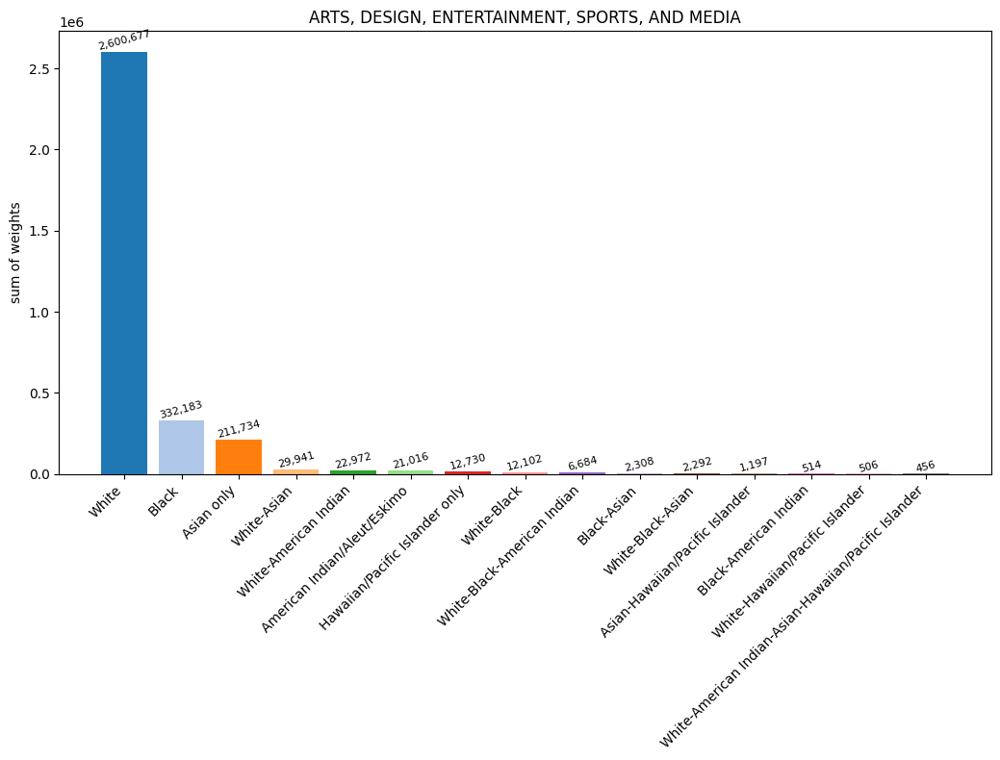

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


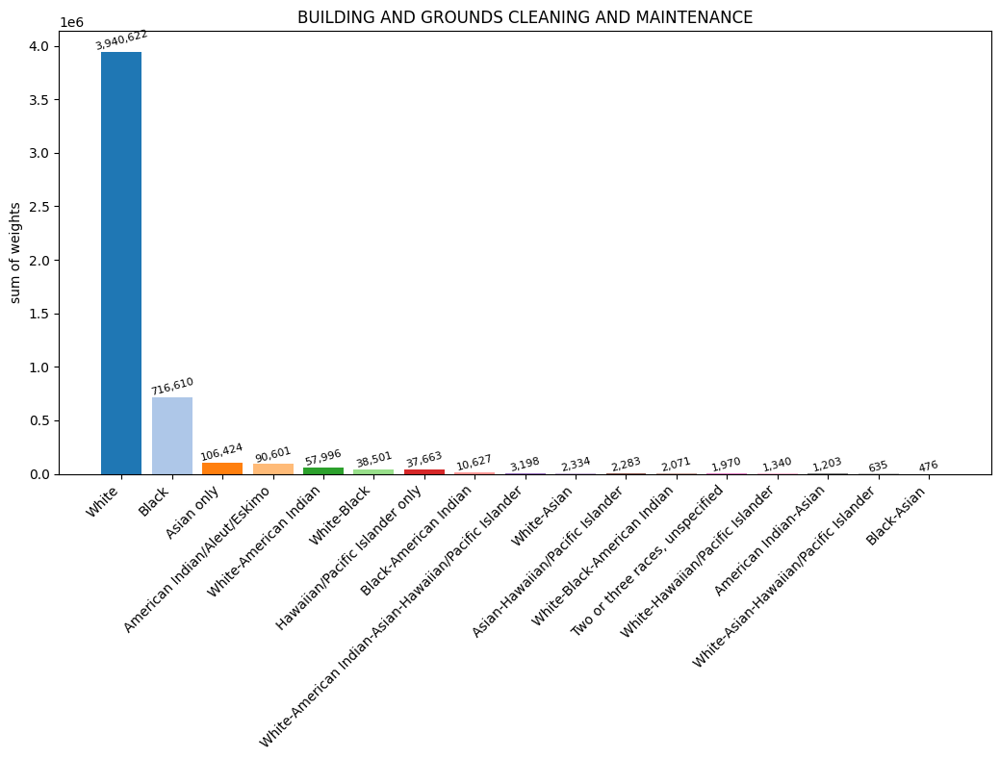

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


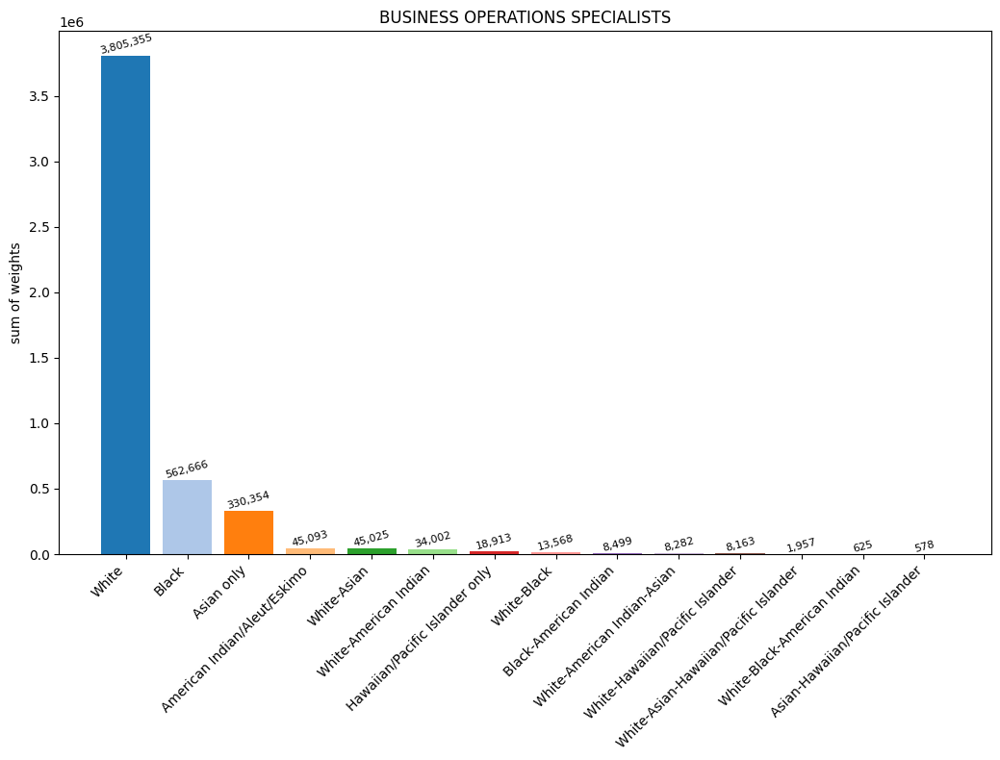

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


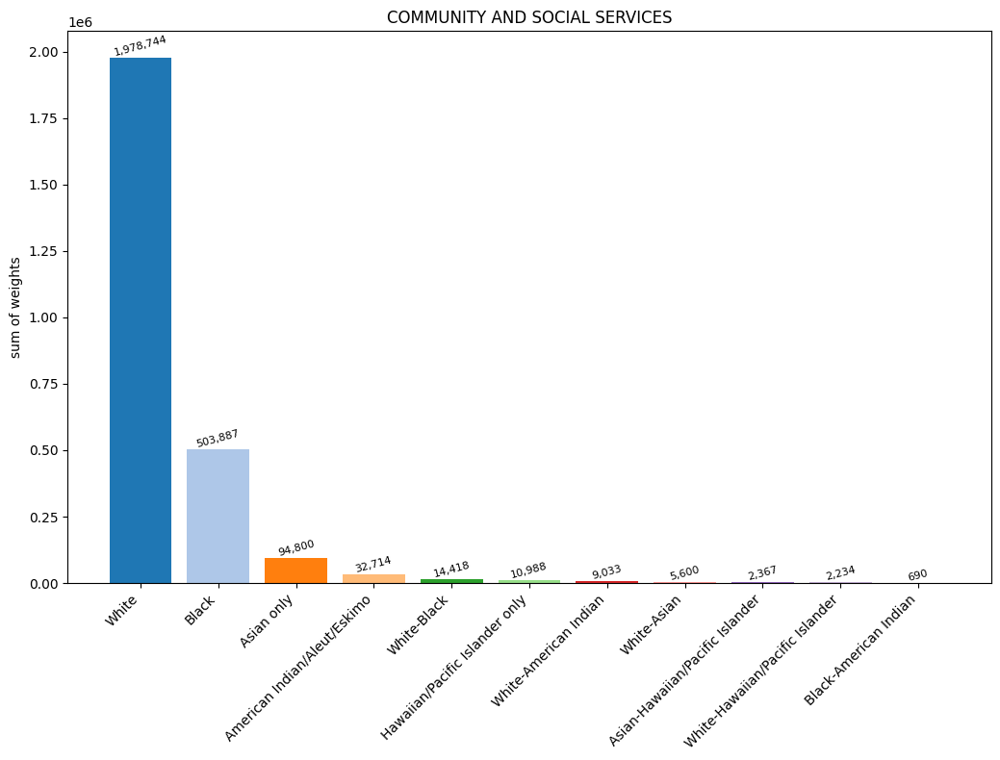

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


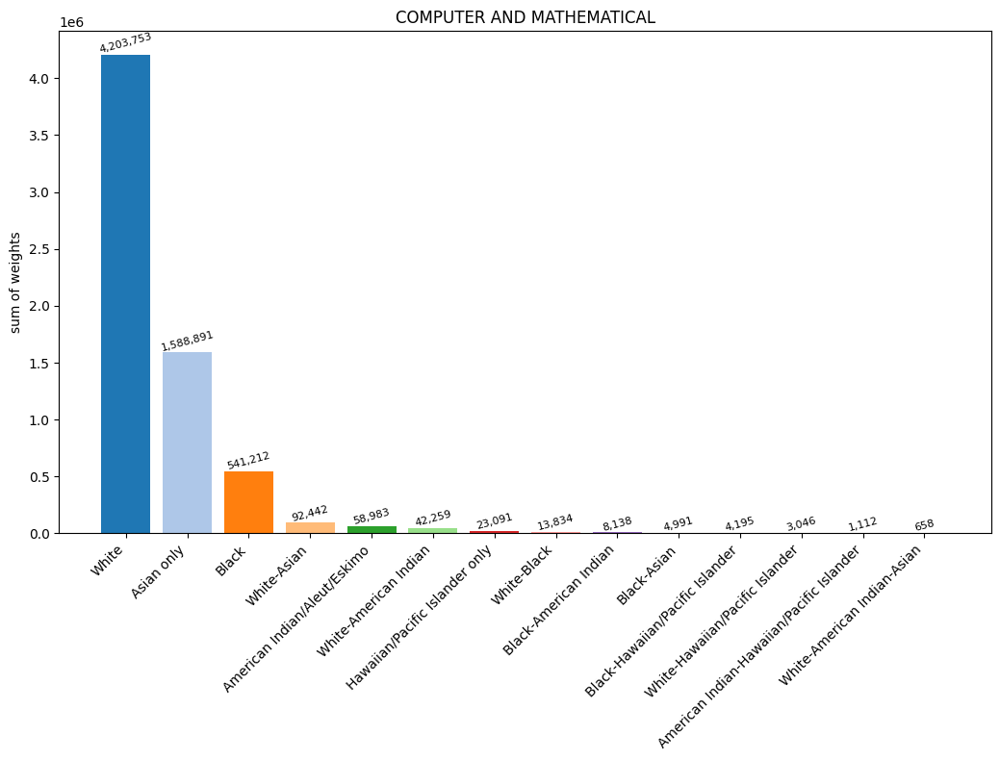

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


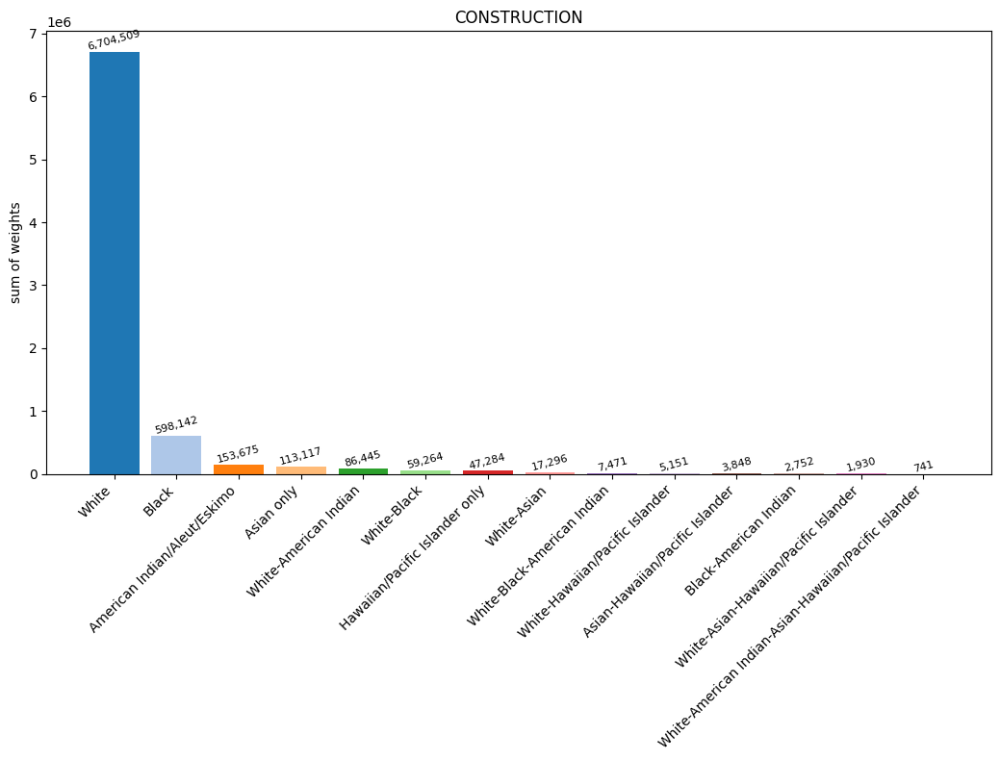

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


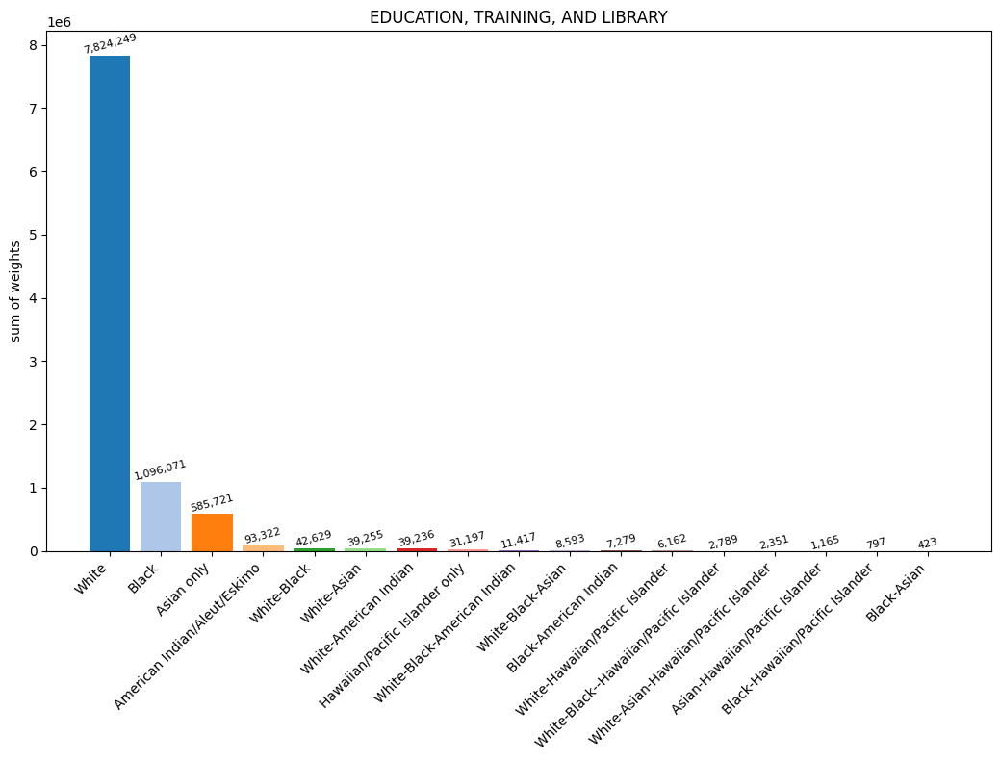

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


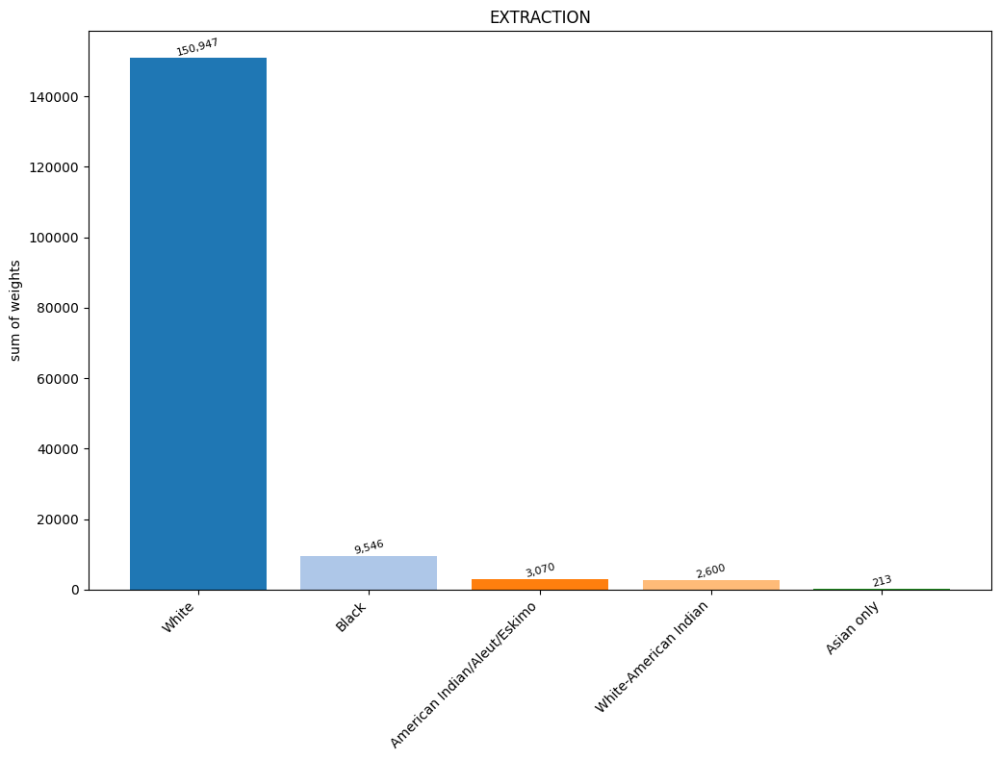

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


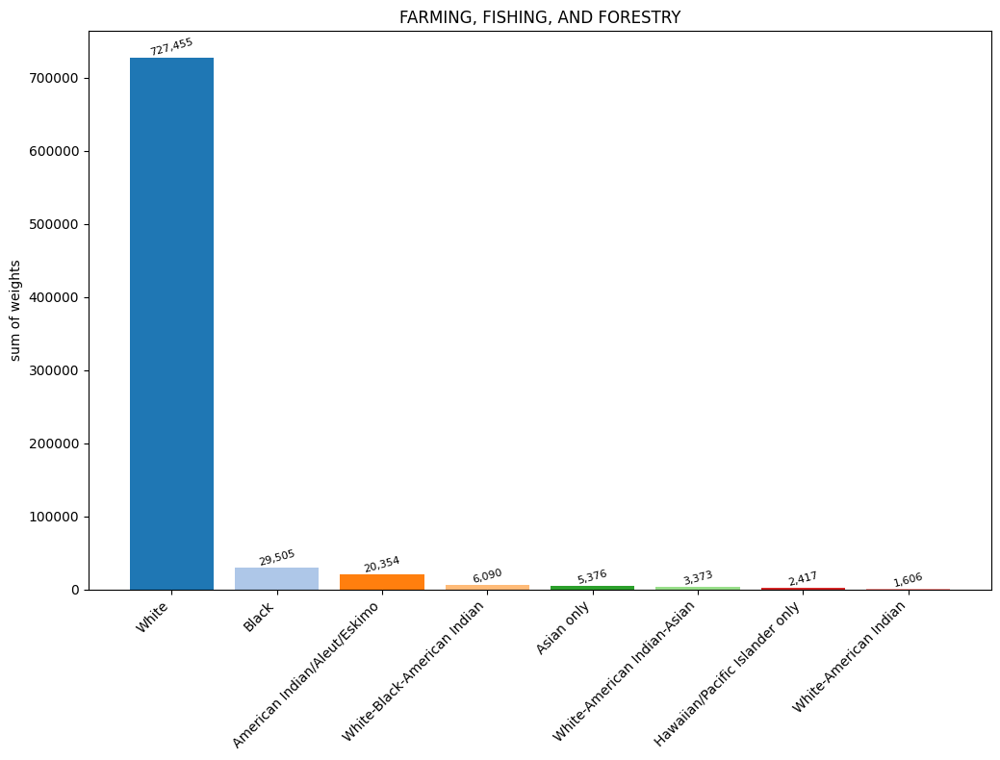

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


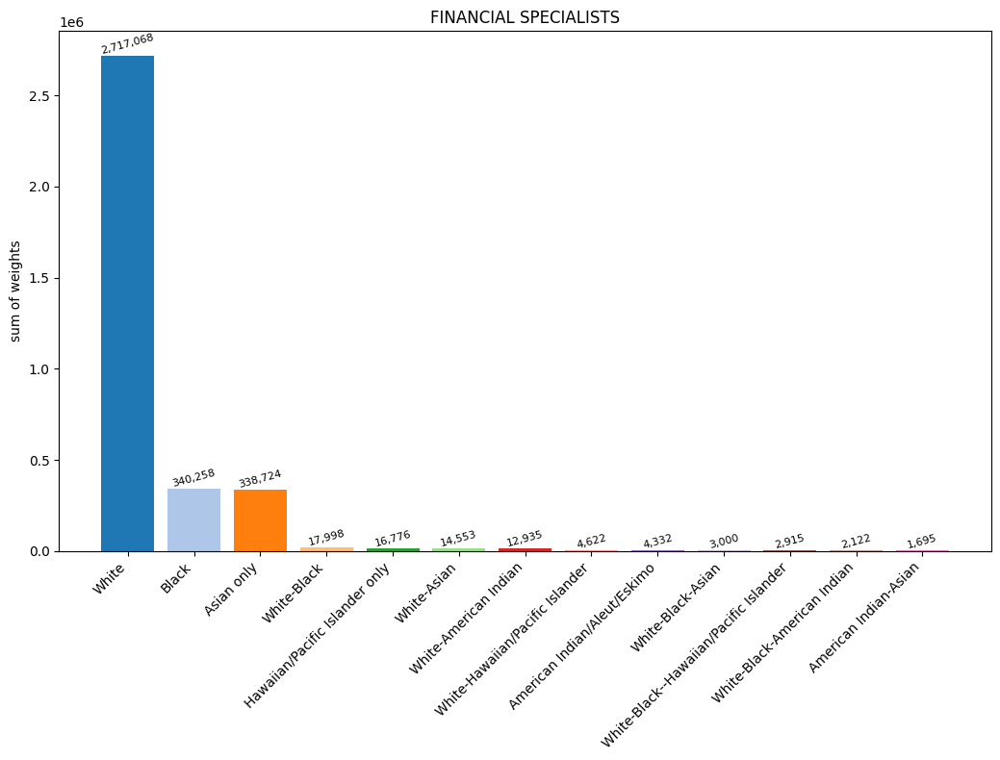

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


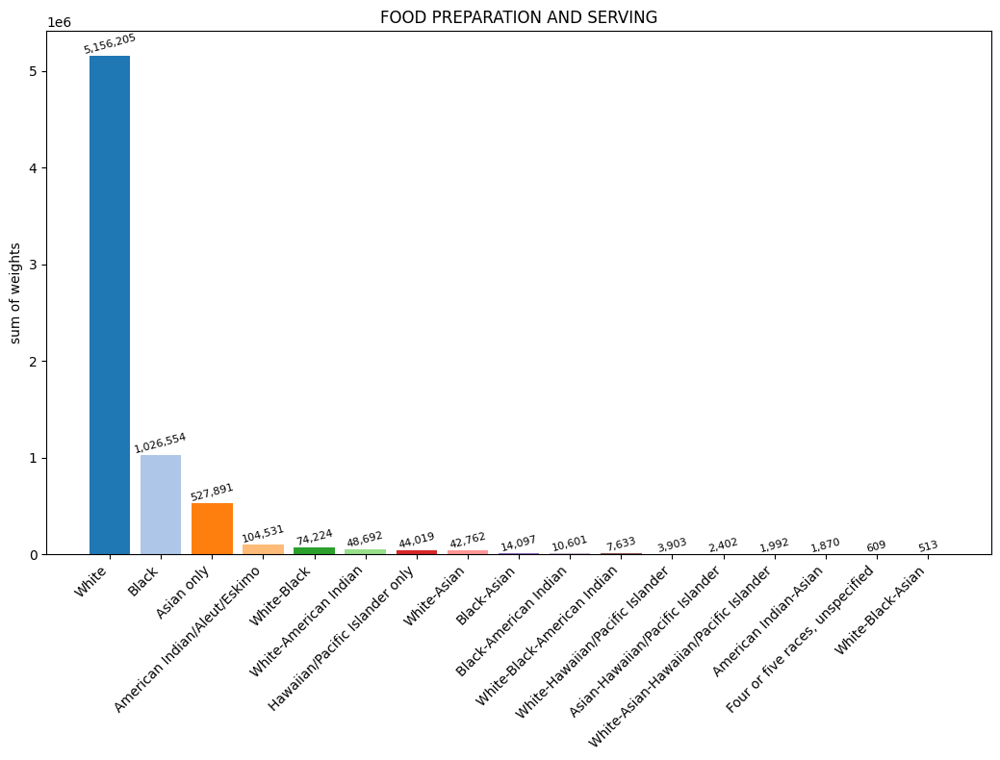

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


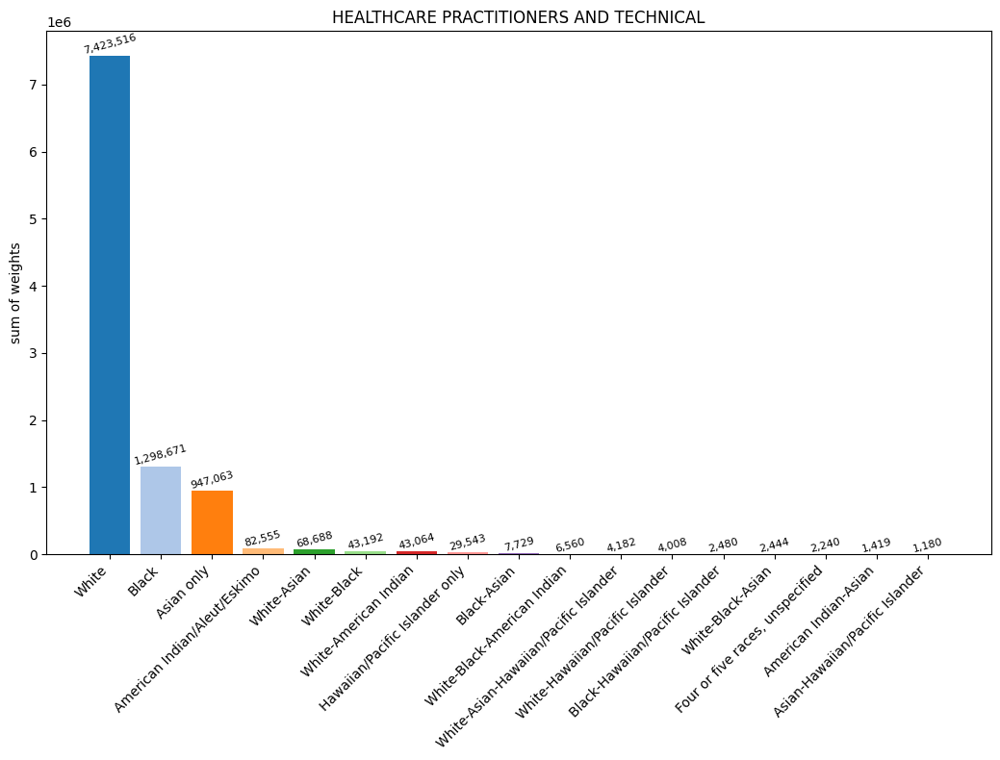

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


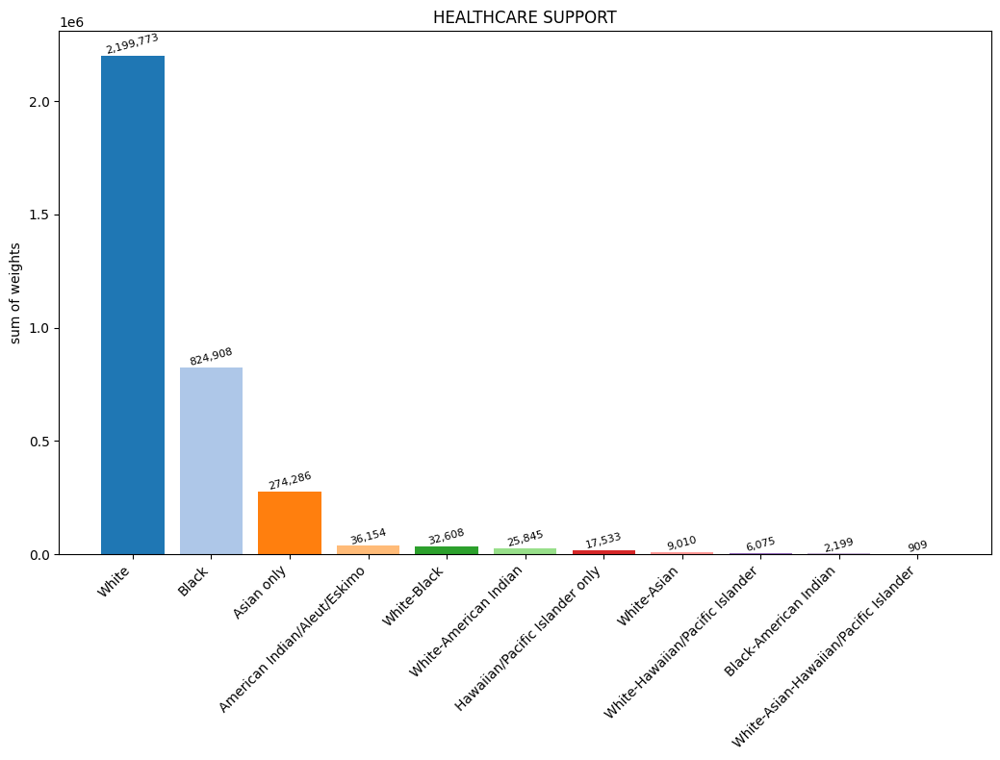

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


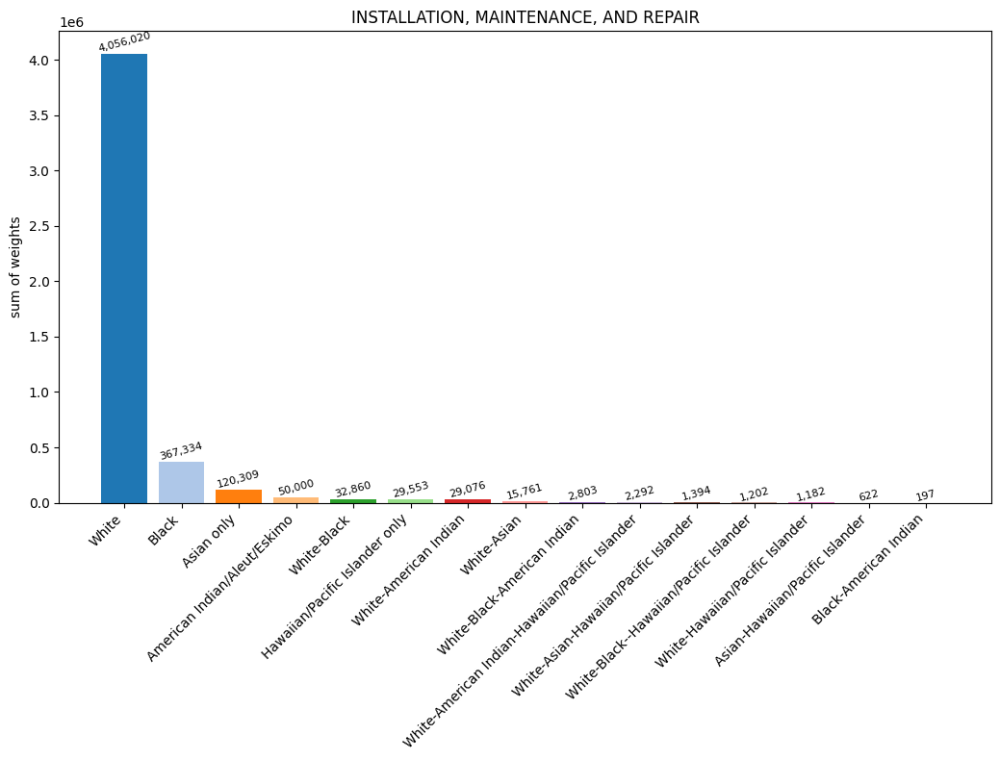

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


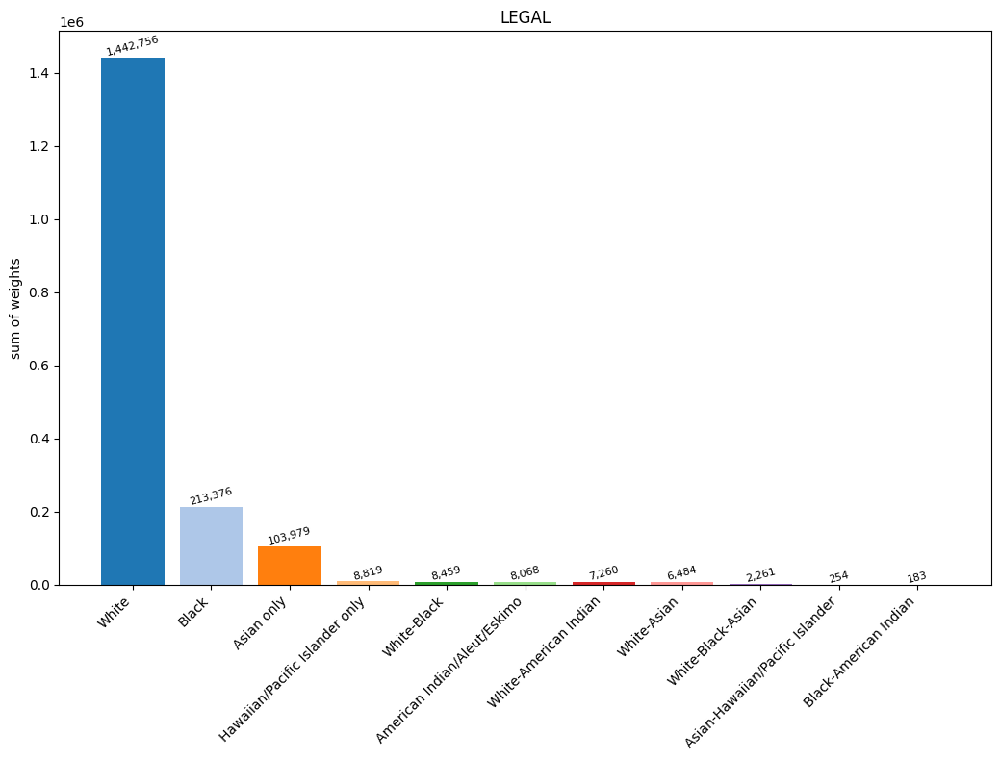

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


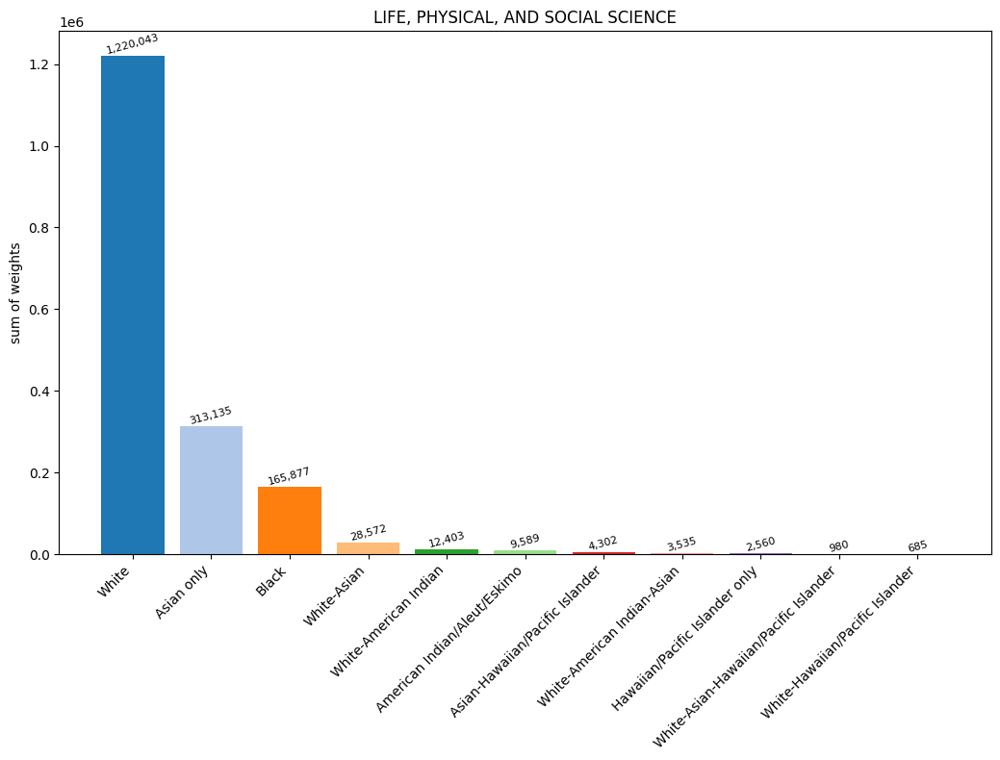

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


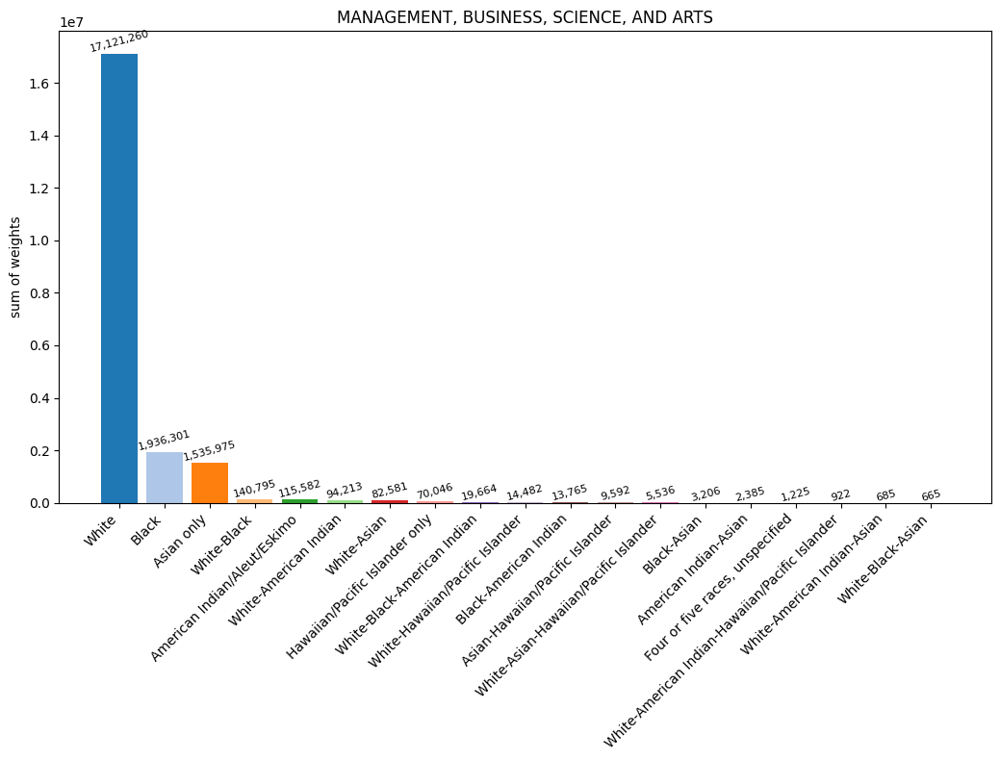

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


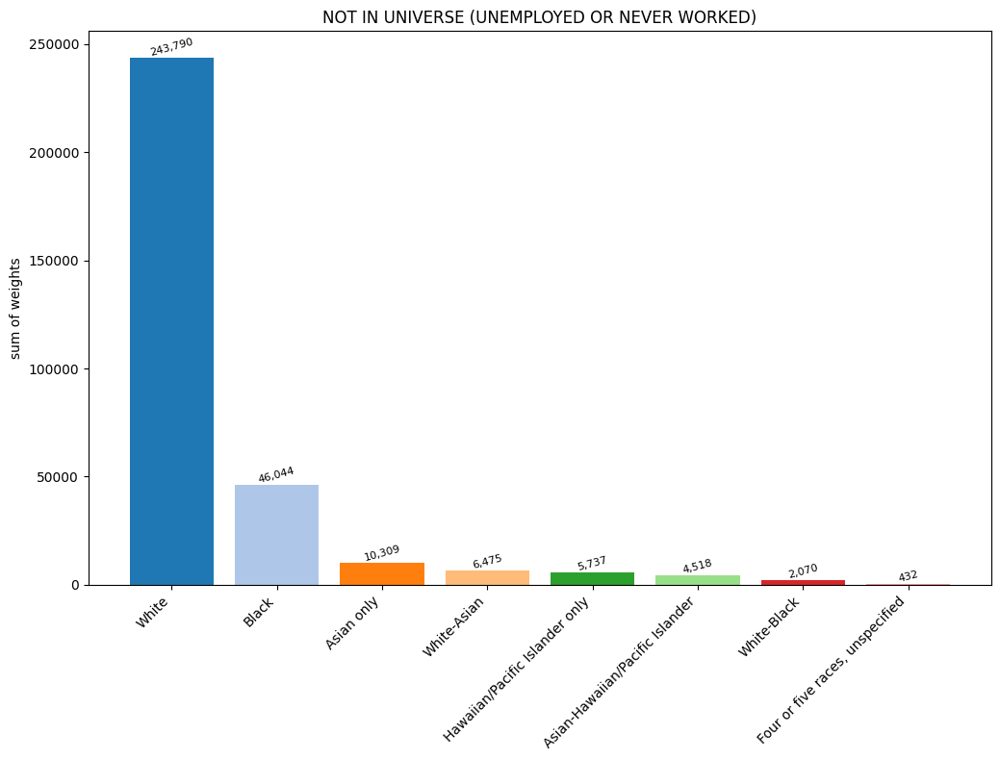

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


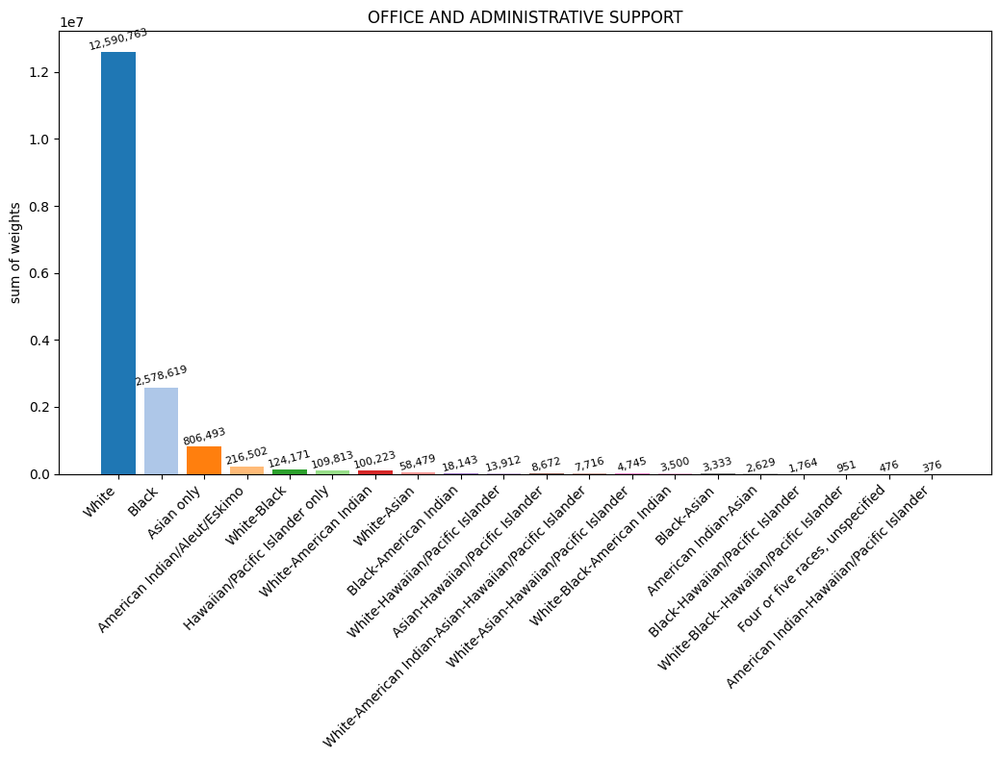

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


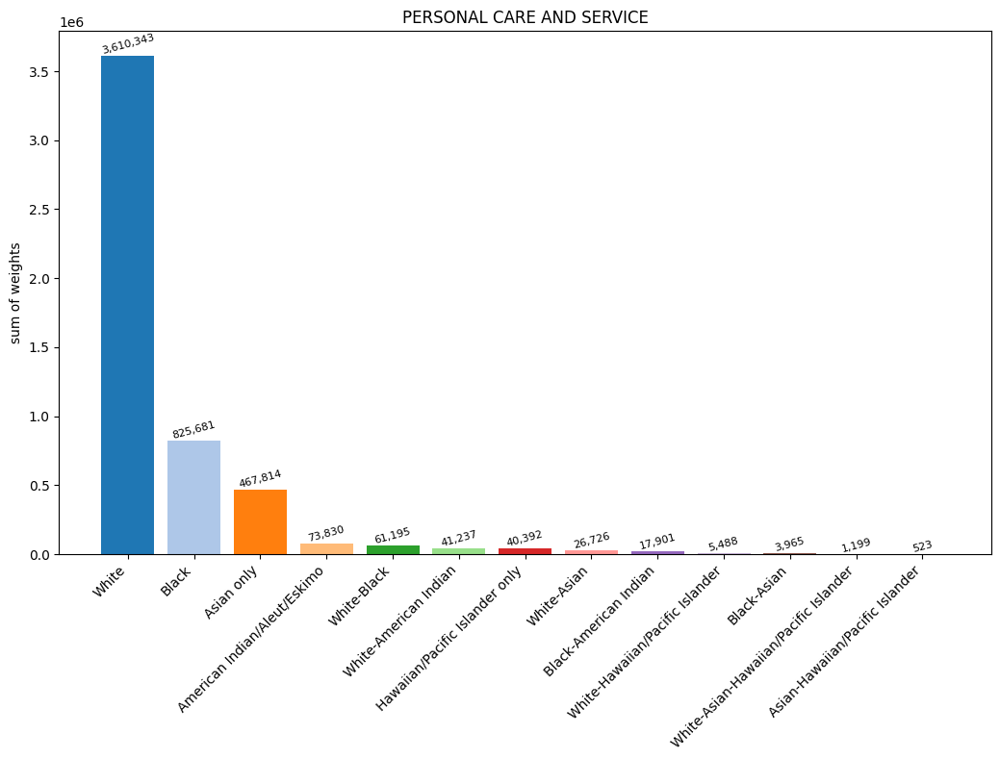

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


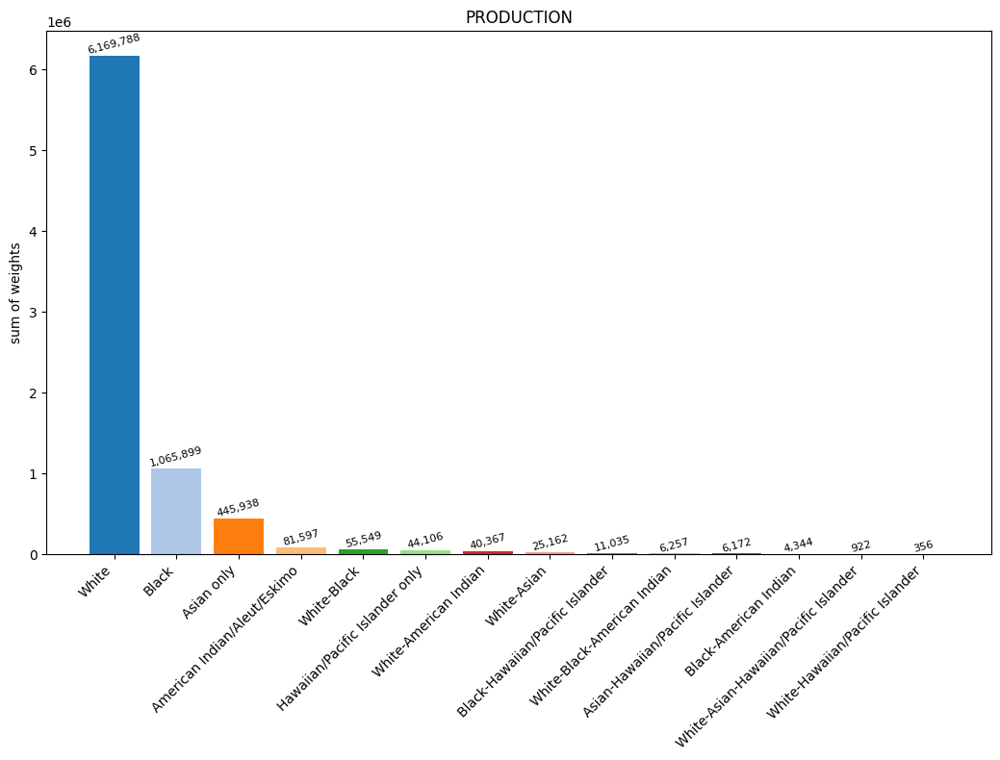

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


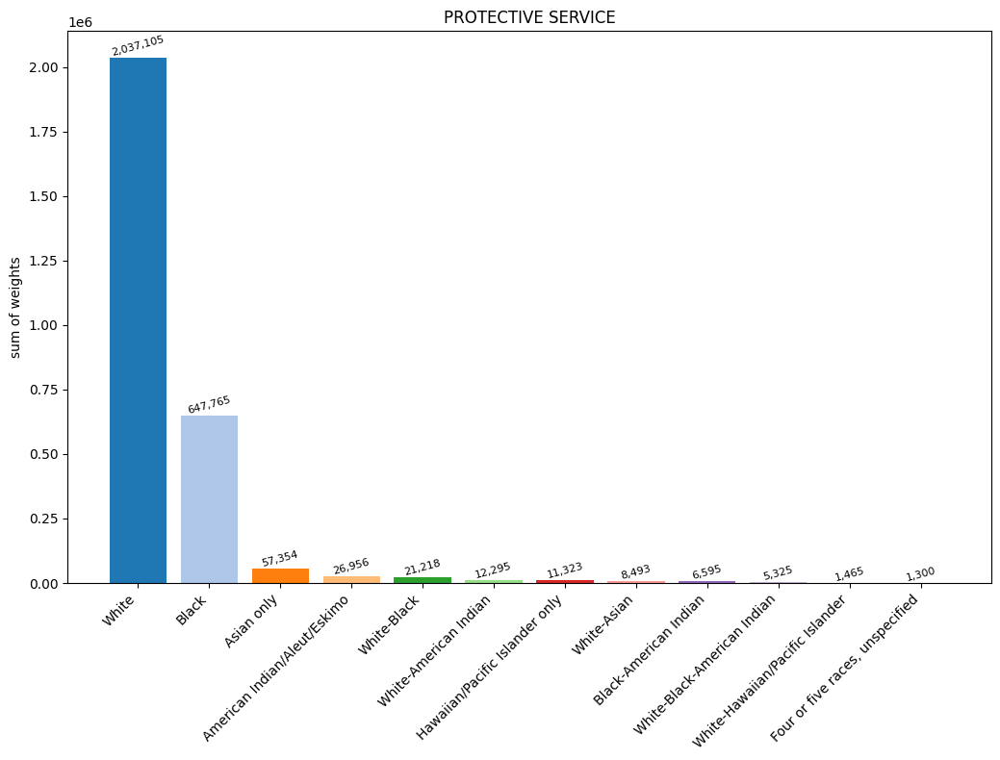

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


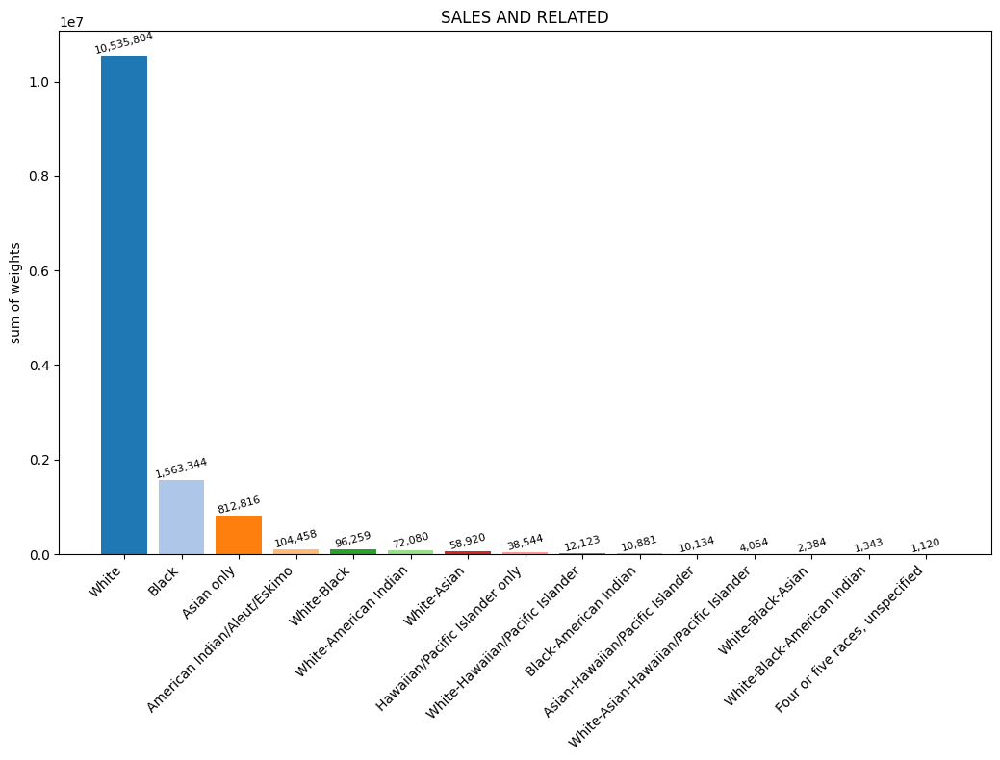

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


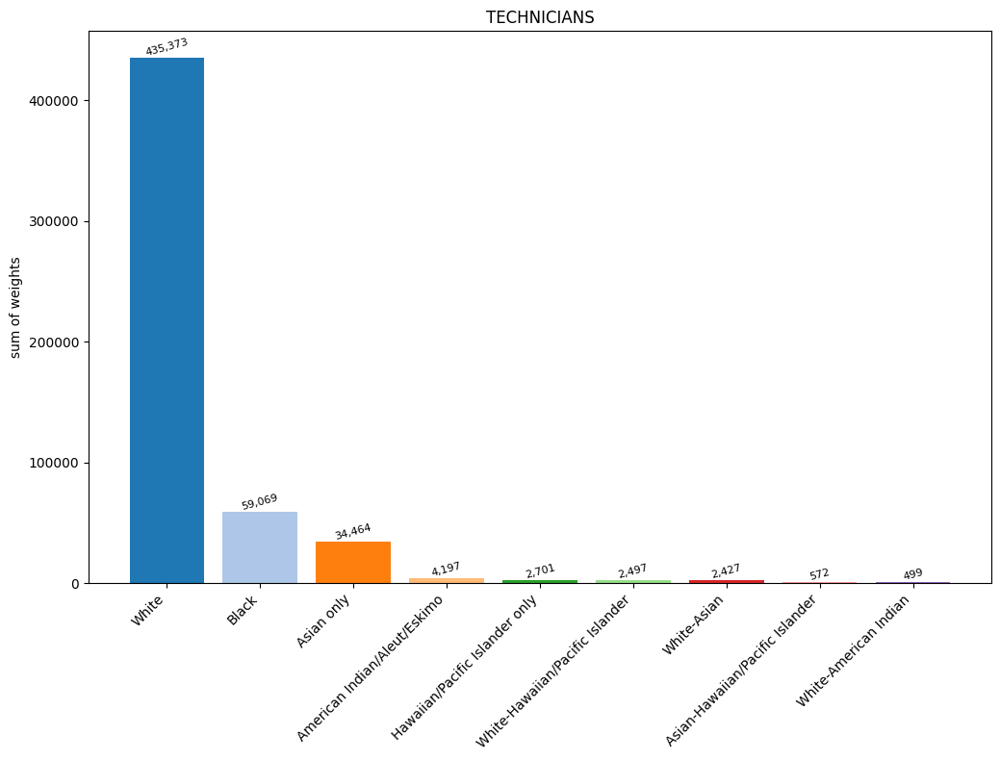

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\307010022.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(titles, rotation = 45, ha='right')


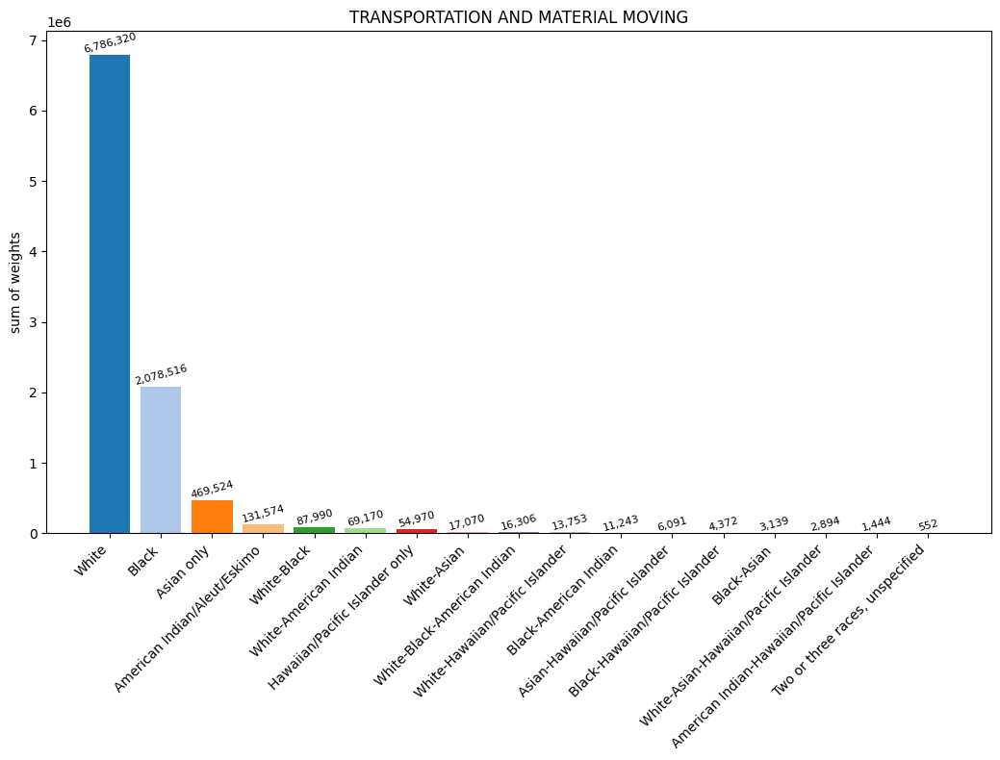

In [29]:
plot_occ_races(race_occ_df, races, percentage=False, weighted=True)

## Did jobs become more diverse in the past years (not that much grouping anymore)?

'Racial categories in the CPS have been more consistent than racial categories in the census. Up through 2002, the number of race categories ranged from 3 (white, negro, and other) to 5 (white, black, American Indian/Eskimo/Aleut, Asian or Pacific Islander, and other). Beginning in 2003, respondents could report more than one race, and the number of codes rose to 21, and then up to 26 codes in 2013.'

Which is why in the following plots the occupation categories seem to be more diverse than before. Most categories are quite similar when it comes to the amount of people of different race working in that field. Most categories have a mean diversity count of 8-12 over the years. However, some 'outliers' can be spotted: 
* *Technichians*: Undiverse category, shows a peak of 10 races working in that field in 2005. Overall its mean diversity count is 6 with a standard deviation of 1.8.
* *Extraction*: Least diverse category, shows a peak of 8 races working in that category in 2013. Overall its mean diversity count is 4 with a standard deviation of 1.3.
* *Farming, Fishing and Forestry*: Undiverse category, shows a peak of 11 in several years. Overall its mean diversity count is 7 with a higher standard deviation of 2.

* *Office and Administrative support*: Most diverse category, shows a peak of 11 races working in that category in 2023. Overall its mean diversity count is 13 with a standard deviation of 6 (which however might be this high because there were less races to choose from before 2003 and hence the high gap).
* Other very diverse categories are:
    * Food preperation and serving
    * Management, Business, Science and Arts
    * Sales and Related
    * Transportation and Material moving

Overall it does not seem like any category got more or less diverse over the years. More diverse categories have always been more diverse and the other way round. Some small inconsistencies are visible over the years, but the overall trend is steady.

diversity count = number of races working in that category

In [30]:
data_df = pd.read_csv(data_path, sep=';')

In [31]:
race_occ_df = pd.DataFrame()
race_occ_df['RACE'] = data_df['RACE']
race_occ_df['occ_code'] = data_df['OCC2010']
race_occ_df['occ_category'] = data_df['Category']
race_occ_df['ASECWT'] = data_df['ASECWT']
race_occ_df['YEAR'] = data_df['YEAR']

In [32]:
race_occ_df = pd.merge(race_occ_df, race_codes_df, on='RACE')

race_occ_df['occ_category'] = race_occ_df['occ_category'].astype('category')
race_occ_df['race_title'] = race_occ_df['race_title'].astype('category')

In [33]:
def print_nr_races_yearly(year: int, show_race_titles: bool = False):
    """
    print diversity information about a specific year
    """
    print(f'Nr. of races {year}: ', len(race_occ_df[race_occ_df['YEAR'] == year]['race_title'].unique()))

    if show_race_titles:
        print(race_occ_df[race_occ_df['YEAR'] == year]['race_title'].unique().tolist())

In [34]:
print_nr_races_yearly(1992, show_race_titles=True)
print_nr_races_yearly(2002)
print_nr_races_yearly(2003, show_race_titles=True)
print_nr_races_yearly(2013, show_race_titles=True)

Nr. of races 1992:  5
['White', 'Black', 'Other (single) race, n.e.c.', 'American Indian/Aleut/Eskimo', 'Asian or Pacific Islander']
Nr. of races 2002:  4
Nr. of races 2003:  21
['White', 'Black', 'American Indian/Aleut/Eskimo', 'Asian only', 'White-American Indian', 'Black-American Indian', 'White-Black-American Indian', 'Hawaiian/Pacific Islander only', 'White-Black', 'White-Asian', 'American Indian-Asian', 'Asian-Hawaiian/Pacific Islander', 'Two or three races, unspecified', 'Four or five races, unspecified', 'White-Asian-Hawaiian/Pacific Islander', 'White-Hawaiian/Pacific Islander', 'White-Black-Asian', 'Black-Asian', 'Black-Hawaiian/Pacific Islander', 'White-Black-American Indian-Asian', 'White-American Indian-Asian']
Nr. of races 2013:  25
['White', 'Black', 'American Indian/Aleut/Eskimo', 'Asian only', 'White-American Indian', 'Black-American Indian', 'White-Black-American Indian', 'Hawaiian/Pacific Islander only', 'White-Black', 'White-Asian', 'American Indian-Asian', 'Asian-Ha

In [35]:
race_occ_df.groupby(['occ_category', 'race_title', 'YEAR']).size().reset_index(name='count')

C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\3508755367.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  race_occ_df.groupby(['occ_category', 'race_title', 'YEAR']).size().reset_index(name='count')


,occ_category,race_title,YEAR,count
0,ARCHITECTURE AND ENGINEERING,American Indian-Asian,1968,0
1,ARCHITECTURE AND ENGINEERING,American Indian-Asian,1969,0
2,ARCHITECTURE AND ENGINEERING,American Indian-Asian,1970,0
3,ARCHITECTURE AND ENGINEERING,American Indian-Asian,1971,0
4,ARCHITECTURE AND ENGINEERING,American Indian-Asian,1972,0
...,...,...,...,...
40763,TRANSPORTATION AND MATERIAL MOVING,White-Hawaiian/Pacific Islander,2019,3
40764,TRANSPORTATION AND MATERIAL MOVING,White-Hawaiian/Pacific Islander,2020,4
40765,TRANSPORTATION AND MATERIAL MOVING,White-Hawaiian/Pacific Islander,2021,1
40766,TRANSPORTATION AND MATERIAL MOVING,White-Hawaiian/Pacific Islander,2022,3


C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2256395250.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = race_occ_df.groupby(['occ_category', 'race_title', 'YEAR']).size().reset_index(name='count')


C:\Users\jputz\AppData\Local\Temp\ipykernel_19640\2256395250.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (occupation_category, group_df), ax in zip(grouped_df.groupby('occ_category'), axs):


Text(0.5, 0.94, 'Diversity per occupation category over the years')

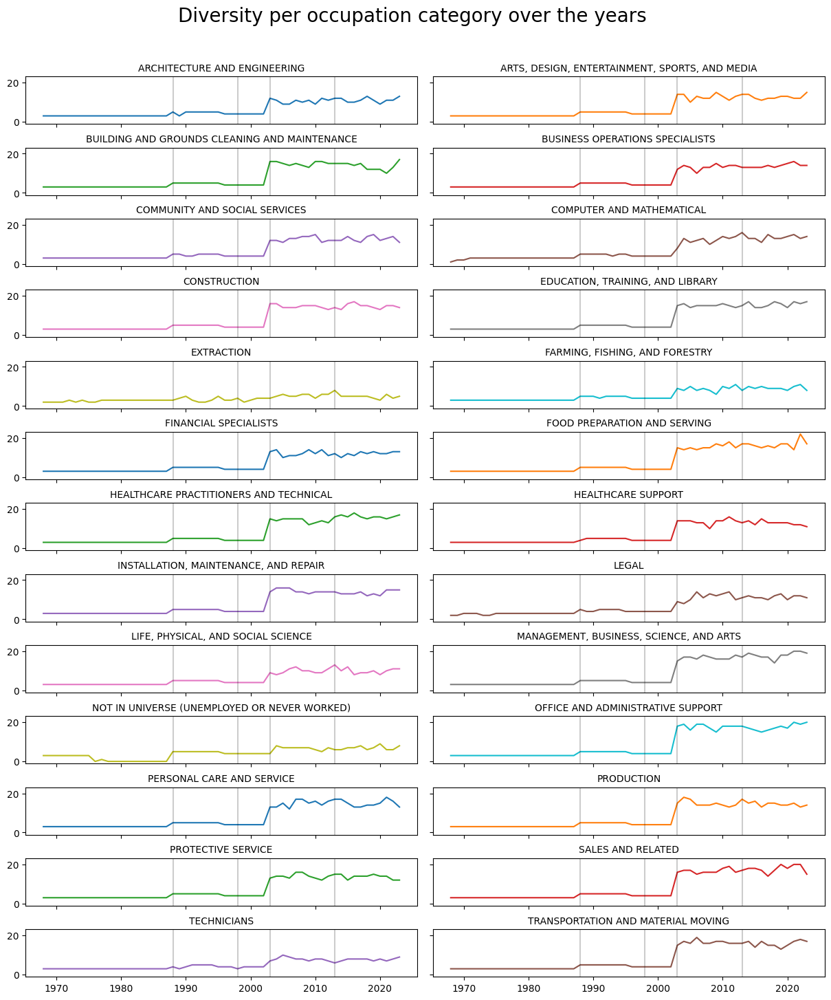

In [36]:
grouped_df = race_occ_df.groupby(['occ_category', 'race_title', 'YEAR']).size().reset_index(name='count')

fig, axs = plt.subplots(13,2, figsize=(15, 17), sharex=True, sharey=True)
axs = list(chain(*axs))
fig.subplots_adjust(hspace= 0.5, wspace=0.04)
colors = plt.rcParams["axes.prop_cycle"]()
for (occupation_category, group_df), ax in zip(grouped_df.groupby('occ_category'), axs):
    # Pivot the DataFrame to have 'race_title' as columns and 'count' as values
    pivot_df = group_df.pivot_table(index=['YEAR'], columns='race_title', values='count', fill_value=0)

    pivot_df['nr_races'] = (pivot_df != 0.0).sum(1)
    pivot_df = pivot_df.reset_index()

    c = next(colors)["color"]
    ax.plot(pivot_df['YEAR'], pivot_df['nr_races'], color=c)
    ax.set_title(occupation_category, fontsize =10)

    ax.axvline(x=1988, color='black', alpha=0.2)
    ax.axvline(x=1998, color='black', alpha=0.2)
    ax.axvline(x=2003, color='black', alpha=0.2)
    ax.axvline(x=2013, color='black', alpha=0.2)


fig.suptitle('Diversity per occupation category over the years',ha='center', fontsize=20, y = 0.94)

In [37]:
df = race_occ_df[['YEAR', 'occ_category', 'RACE']]
pivot_df = df.pivot_table(index='occ_category', columns='YEAR', aggfunc=lambda x: len(set(x)))
pivot_df['mean'] = pivot_df.mean(axis=1)
pivot_df['sd'] = pivot_df.std(axis=1)
display(pivot_df)

RACE                           \
YEAR                                           1968 1969 1970 1971 1972 1973   
occ_category                                                                   
ARCHITECTURE AND ENGINEERING                    3.0  3.0  3.0  3.0  3.0  3.0   
ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA  3.0  3.0  3.0  3.0  3.0  3.0   
BUILDING AND GROUNDS CLEANING AND MAINTENANCE   3.0  3.0  3.0  3.0  3.0  3.0   
BUSINESS OPERATIONS SPECIALISTS                 3.0  3.0  3.0  3.0  3.0  3.0   
COMMUNITY AND SOCIAL SERVICES                   3.0  3.0  3.0  3.0  3.0  3.0   
COMPUTER AND MATHEMATICAL                       1.0  2.0  2.0  3.0  3.0  3.0   
CONSTRUCTION                                    3.0  3.0  3.0  3.0  3.0  3.0   
EDUCATION, TRAINING, AND LIBRARY                3.0  3.0  3.0  3.0  3.0  3.0   
EXTRACTION                                      2.0  2.0  2.0  2.0  3.0  2.0   
FARMING, FISHING, AND FORESTRY                  3.0  3.0  3.0  3.0  3.0  3.0   
FINANCIAL SPECIALISTS                           3.0  3.0  3.0  3.0  3.0  3.0   
FOOD PREPARATION AND SERVING                    3.0  3.0  3.0  3.0  3.0  3.0   
HEALTHCARE PRACTITIONERS AND TECHNICAL          3.0  3.0  3.0  3.0  3.0  3.0   
HEALTHCARE SUPPORT                              3.0  3.0  3.0  3.0  3.0  3.0   
INSTALLATION, MAINTENANCE, AND REPAIR           3.0  3.0  3.0  3.0  3.0  3.0   
LEGAL                                           2.0  2.0  3.0  3.0  3.0  2.0   
LIFE, PHYSICAL, AND SOCIAL SCIENCE              3.0  3.0  3.0  3.0  3.0  3.0   
MANAGEMENT, BUSINESS, SCIENCE, AND ARTS         3.0  3.0  3.0  3.0  3.0  3.0   
NOT IN UNIVERSE (UNEMPLOYED OR NEVER WORKED)    3.0  3.0  3.0  3.0  3.0  3.0   
OFFICE AND ADMINISTRATIVE SUPPORT               3.0  3.0  3.0  3.0  3.0  3.0   
PERSONAL CARE AND SERVICE                       3.0  3.0  3.0  3.0  3.0  3.0   
PRODUCTION                                      3.0  3.0  3.0  3.0  3.0  3.0   
PROTECTIVE SERVICE                              3.0  3.0  3.0  3.0  3.0  3.0   
SALES AND RELATED                               3.0  3.0  3.0  3.0  3.0  3.0   
TECHNICIANS                                     3.0  3.0  3.0  3.0  3.0  3.0   
TRANSPORTATION AND MATERIAL MOVING              3.0  3.0  3.0  3.0  3.0  3.0   

                                                                    ...        \
YEAR                                           1974 1975 1976 1977  ...  2016   
occ_category                                                        ...         
ARCHITECTURE AND ENGINEERING                    3.0  3.0  3.0  3.0  ...  10.0   
ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA  3.0  3.0  3.0  3.0  ...  11.0   
BUILDING AND GROUNDS CLEANING AND MAINTENANCE   3.0  3.0  3.0  3.0  ...  14.0   
BUSINESS OPERATIONS SPECIALISTS                 3.0  3.0  3.0  3.0  ...  13.0   
COMMUNITY AND SOCIAL SERVICES                   3.0  3.0  3.0  3.0  ...  12.0   
COMPUTER AND MATHEMATICAL                       3.0  3.0  3.0  3.0  ...  11.0   
CONSTRUCTION                                    3.0  3.0  3.0  3.0  ...  17.0   
EDUCATION, TRAINING, AND LIBRARY                3.0  3.0  3.0  3.0  ...  14.0   
EXTRACTION                                      3.0  2.0  2.0  3.0  ...   5.0   
FARMING, FISHING, AND FORESTRY                  3.0  3.0  3.0  3.0  ...  10.0   
FINANCIAL SPECIALISTS                           3.0  3.0  3.0  3.0  ...  11.0   
FOOD PREPARATION AND SERVING                    3.0  3.0  3.0  3.0  ...  15.0   
HEALTHCARE PRACTITIONERS AND TECHNICAL          3.0  3.0  3.0  3.0  ...  18.0   
HEALTHCARE SUPPORT                              3.0  3.0  3.0  3.0  ...  15.0   
INSTALLATION, MAINTENANCE, AND REPAIR           3.0  3.0  3.0  3.0  ...  13.0   
LEGAL                                           2.0  3.0  3.0  3.0  ...  11.0   
LIFE, PHYSICAL, AND SOCIAL SCIENCE              3.0  3.0  3.0  3.0  ...   8.0   
MANAGEMENT, BUSINESS, SCIENCE, AND ARTS         3.0  3.0  3.0  3.0  ...  17.0   
NOT IN UNIVERSE (UNEMPLOY

## Can job transitions from not so diverse job categories to more diverse ones be observed? (Is there a trend to become more diverse? Is there a specific timespan when this started/ was most intense?)

In [38]:
data_df = pd.read_csv(data_path, sep=';')

In [39]:
with open('occ_2010_cat.json', 'r') as file:
    occ_2010_cat = json.load(file)

category_df = pd.DataFrame([(code, category) for category, codes in occ_2010_cat.items() for code in codes],
                           columns=['OCC2010', 'Category'])

In [40]:
race_occ_df = pd.DataFrame()
race_occ_df['YEAR'] = data_df['YEAR']
race_occ_df['RACE'] = data_df['RACE']
race_occ_df['ASECWT'] = data_df['ASECWT']
race_occ_df['occ_code'] = data_df['OCC2010']
race_occ_df['occ_category'] = data_df['Category']
race_occ_df['OCCLY'] = data_df['OCC10LY']

In [41]:
race_occ_df = pd.merge(race_occ_df, category_df, left_on='OCCLY', right_on = 'OCC2010')
race_occ_df = race_occ_df.rename(columns = {'Category': 'occ_category_LY'})
race_occ_df.drop('OCC2010', inplace=True, axis=1)

### Occupation transition per race
The results show that across all races it is more common to keep their current job. Only few occurences where more people transitioned to a different job than staying in the same could be observed: 
* American Indian-Asian
* White-Black Hawaiian/Pacific Islander
* White American Indian Hawaiian/Pacific Islander
* American Indian Hawaiian/Pacific Islander

In [42]:
same_occly = race_occ_df[race_occ_df['occ_code'] == race_occ_df['OCCLY']]

In [43]:
pivot_df_same = same_occly.pivot_table(index='YEAR', columns='RACE', aggfunc='size', fill_value=0)
pivot_df_same.columns.name = None
pivot_df_same = pivot_df_same.reset_index()

In [44]:
for year, df in same_occly.groupby('YEAR'):
    print(year, ': ', len(df['RACE'].unique()))
    print('Nr of jobs categories with no transition: ', len(df['occ_category'].unique()))
    print(df['occ_category'].unique())

1968 :  3
Nr of jobs categories with no transition:  26
['ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA'
 'MANAGEMENT, BUSINESS, SCIENCE, AND ARTS'
 'OFFICE AND ADMINISTRATIVE SUPPORT' 'TRANSPORTATION AND MATERIAL MOVING'
 'LIFE, PHYSICAL, AND SOCIAL SCIENCE' 'SALES AND RELATED' 'PRODUCTION'
 'EDUCATION, TRAINING, AND LIBRARY'
 'INSTALLATION, MAINTENANCE, AND REPAIR' 'FOOD PREPARATION AND SERVING'
 'ARCHITECTURE AND ENGINEERING' 'PERSONAL CARE AND SERVICE'
 'NOT IN UNIVERSE (UNEMPLOYED OR NEVER WORKED)' 'CONSTRUCTION'
 'HEALTHCARE PRACTITIONERS AND TECHNICAL' 'PROTECTIVE SERVICE'
 'FARMING, FISHING, AND FORESTRY' 'HEALTHCARE SUPPORT'
 'BUSINESS OPERATIONS SPECIALISTS' 'TECHNICIANS'
 'BUILDING AND GROUNDS CLEANING AND MAINTENANCE' 'EXTRACTION' 'LEGAL'
 'COMMUNITY AND SOCIAL SERVICES' 'FINANCIAL SPECIALISTS'
 'COMPUTER AND MATHEMATICAL']
1969 :  3
Nr of jobs categories with no transition:  26
['ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA'
 'MANAGEMENT, BUSINESS, SCIENCE, AND ARTS'
 '

In [45]:
diff_occly = race_occ_df[race_occ_df['occ_code'] != race_occ_df['OCCLY']]

In [46]:
pivot_diff = diff_occly.pivot_table(index='YEAR', columns='RACE', aggfunc='size', fill_value=0)
pivot_diff.columns.name = None
pivot_diff = pivot_diff.reset_index()

In [47]:
for year, df in diff_occly.groupby('YEAR'):
    print(year, ': ', len(df['RACE'].unique()))
    print('Nr of jobs categories with transition: ', len(df['occ_category'].unique()))
    print(df['occ_category'].unique())

1968 :  3
Nr of jobs categories with transition:  25
['MANAGEMENT, BUSINESS, SCIENCE, AND ARTS'
 'LIFE, PHYSICAL, AND SOCIAL SCIENCE' 'TRANSPORTATION AND MATERIAL MOVING'
 'SALES AND RELATED' 'OFFICE AND ADMINISTRATIVE SUPPORT'
 'INSTALLATION, MAINTENANCE, AND REPAIR' 'FARMING, FISHING, AND FORESTRY'
 'ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA'
 'FOOD PREPARATION AND SERVING' 'PRODUCTION'
 'BUSINESS OPERATIONS SPECIALISTS' 'EDUCATION, TRAINING, AND LIBRARY'
 'PERSONAL CARE AND SERVICE' 'CONSTRUCTION'
 'HEALTHCARE PRACTITIONERS AND TECHNICAL' 'HEALTHCARE SUPPORT'
 'BUILDING AND GROUNDS CLEANING AND MAINTENANCE'
 'ARCHITECTURE AND ENGINEERING' 'COMMUNITY AND SOCIAL SERVICES'
 'TECHNICIANS' 'LEGAL' 'PROTECTIVE SERVICE' 'FINANCIAL SPECIALISTS'
 'EXTRACTION' 'COMPUTER AND MATHEMATICAL']
1969 :  3
Nr of jobs categories with transition:  25
['MANAGEMENT, BUSINESS, SCIENCE, AND ARTS'
 'BUILDING AND GROUNDS CLEANING AND MAINTENANCE'
 'ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA' 'PRODUC

In [48]:
same = ['FOOD PREPARATION AND SERVING', 'PERSONAL CARE AND SERVICE', 'TECHNICIANS',
 'SALES AND RELATED', 'TRANSPORTATION AND MATERIAL MOVING', 'PRODUCTION',
 'OFFICE AND ADMINISTRATIVE SUPPORT', 'FINANCIAL SPECIALISTS', 'LEGAL',
 'HEALTHCARE SUPPORT', 'BUILDING AND GROUNDS CLEANING AND MAINTENANCE',
 'BUSINESS OPERATIONS SPECIALISTS',
 'MANAGEMENT, BUSINESS, SCIENCE, AND ARTS',
 'INSTALLATION, MAINTENANCE, AND REPAIR',
 'LIFE, PHYSICAL, AND SOCIAL SCIENCE', 'PROTECTIVE SERVICE', 'CONSTRUCTION',
 'FARMING, FISHING, AND FORESTRY',
 'ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA',
 'EDUCATION, TRAINING, AND LIBRARY',
 'HEALTHCARE PRACTITIONERS AND TECHNICAL',
 'NOT IN UNIVERSE (UNEMPLOYED OR NEVER WORKED)',
 'COMPUTER AND MATHEMATICAL', 'ARCHITECTURE AND ENGINEERING', 'EXTRACTION',
 'COMMUNITY AND SOCIAL SERVICES']

diff = ['TRANSPORTATION AND MATERIAL MOVING', 'CONSTRUCTION',
 'LIFE, PHYSICAL, AND SOCIAL SCIENCE',
 'BUILDING AND GROUNDS CLEANING AND MAINTENANCE', 'PROTECTIVE SERVICE',
 'FOOD PREPARATION AND SERVING', 'SALES AND RELATED',
 'MANAGEMENT, BUSINESS, SCIENCE, AND ARTS', 'COMMUNITY AND SOCIAL SERVICES',
 'EDUCATION, TRAINING, AND LIBRARY', 'FINANCIAL SPECIALISTS',
 'HEALTHCARE PRACTITIONERS AND TECHNICAL', 'PERSONAL CARE AND SERVICE',
 'PRODUCTION', 'OFFICE AND ADMINISTRATIVE SUPPORT',
 'FARMING, FISHING, AND FORESTRY', 'HEALTHCARE SUPPORT',
 'INSTALLATION, MAINTENANCE, AND REPAIR', 'BUSINESS OPERATIONS SPECIALISTS',
 'ARCHITECTURE AND ENGINEERING', 'TECHNICIANS', 'LEGAL',
 'ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA', 'EXTRACTION',
 'COMPUTER AND MATHEMATICAL']

set(same).symmetric_difference(set(diff))

{'NOT IN UNIVERSE (UNEMPLOYED OR NEVER WORKED)'}

In [49]:
melted_df_diff = pd.melt(pivot_diff, id_vars=['YEAR'], var_name='RACE', value_name='value')
melted_df_same = pd.melt(pivot_df_same, id_vars=['YEAR'], var_name='RACE', value_name='value')

melted_df_same

,YEAR,RACE,value
0,1968,100,33722
1,1969,100,35971
2,1970,100,42723
3,1971,100,42991
4,1972,100,42156
...,...,...,...
1563,2019,830,2
1564,2020,830,2
1565,2021,830,4
1566,2022,830,9


In [50]:
melted_df_same['RACE'].unique() == melted_df_diff['RACE'].unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [51]:
len(melted_df_diff['RACE'].unique())

28

The plot shows a per race comparison of how many people transitioned to another occupation  within the last year or not. The trend shows, that people mostly keep their occupation. Some races could not be chosen in earlier years, which explains the continuous zeros and the resulting straight lines for some.

In [52]:
race_codes_df

,RACE,race_title,start,end
0,100,White,1967,2023
1,200,Black,1967,2023
2,300,American Indian/Aleut/Eskimo,1988,2023
3,650,Asian or Pacific Islander,1988,2003
4,651,Asian only,2003,2023
5,652,Hawaiian/Pacific Islander only,2003,2023
6,700,"Other (single) race, n.e.c.",1967,1998
7,800,Two or more races,2003,2023
8,801,White-Black,2003,2023
9,802,White-American Indian,2003,2023


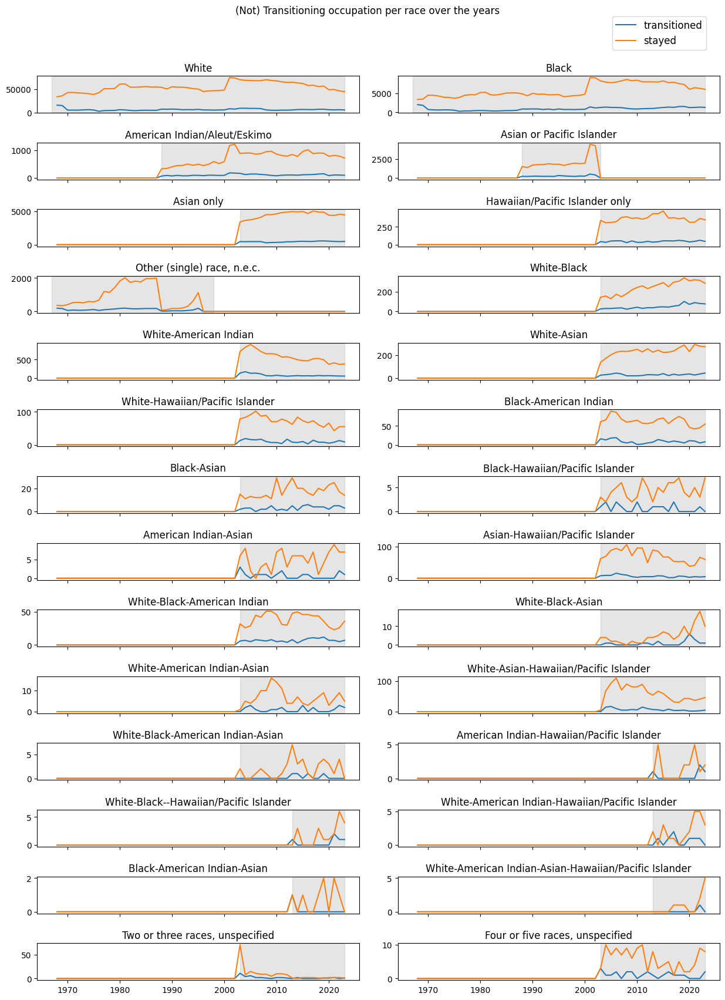

In [53]:
fig, axs = plt.subplots(14, 2, figsize=(15, 20), sharex = True)

axs = list(chain(*axs))
fig.subplots_adjust(hspace= 0.8, wspace=0.12)

# Loop through unique race codes
sorted_race_codes = np.sort(melted_df_diff['RACE'].unique())
for race_code, ax in zip(sorted_race_codes, axs):
    current_race = (race_codes_df['RACE'] == race_code)
    ax.set_title(race_codes_df[current_race]['race_title'].item())

    race_data_diff = melted_df_diff[melted_df_diff['RACE'] == race_code]
    ax.plot(race_data_diff['YEAR'], race_data_diff['value'], label = 'transitioned')

    race_data_same = melted_df_same[melted_df_same['RACE'] == race_code]
    ax.plot(race_data_same['YEAR'], race_data_same['value'], label = 'stayed')

    ax.axvspan(race_codes_df[current_race]['start'].item(), race_codes_df[current_race]['end'].item(), color="grey", alpha=0.2)

fig.suptitle('(Not) Transitioning occupation per race over the years', y=0.94)
fig.legend(*[*zip(*{l:h for h,l in zip(*ax.get_legend_handles_labels())}.items())][::-1], loc =  'upper right', fontsize = 12, bbox_to_anchor=(0.89, 0.935))

plt.show()

In [54]:
def compare_race_transitions(race_title: str = None, code: int = None):
    if race_title != None and code == None:
        race_code = race_codes_df[race_codes_df['race_title'] == race_title]['RACE'].item()
    else:
        race_code = code

    same = melted_df_same[melted_df_same['RACE'] == race_code]
    diff = melted_df_diff[melted_df_diff['RACE'] == race_code]
    comp = same.merge(diff, on = 'YEAR')
    comp.drop(['RACE_y', 'RACE_x'], axis=1, inplace = True)
    comp.rename(columns = {'value_x': 'stayed_count', 'value_y': 'transitioned_count'}, inplace = True)

    print(race_code, race_title)
    display(comp)

In [55]:
compare_race_transitions("White-American Indian-Asian-Hawaiian/Pacific Islander")

819 White-American Indian-Asian-Hawaiian/Pacific Islander


,YEAR,stayed_count,transitioned_count
0,1968,0,0
1,1969,0,0
2,1970,0,0
3,1971,0,0
4,1972,0,0
5,1973,0,0
6,1974,0,0
7,1975,0,0
8,1976,0,0
9,1977,0,0


### Weighed comparison of occupation & occupation category transitions per race

In [56]:
all_combinations = pd.DataFrame(list(product(race_occ_df['RACE'].unique(), range(1967, 2024))), columns=['RACE', 'YEAR'])

In [57]:
# kept previous job
summed_df_same = same_occly.groupby(['YEAR', 'RACE'])['ASECWT'].sum().reset_index()
summed_df_same.rename({'ASECWT': 'stayed_weighed'}, axis=1, inplace = True)

# changed job in previous year
summed_df_diff = diff_occly.groupby(['YEAR', 'RACE'])['ASECWT'].sum().reset_index()
summed_df_diff.rename({'ASECWT': 'transitioned_weighed'}, axis=1, inplace = True)

trans_vs_stayed = all_combinations.merge(summed_df_diff, on = ['YEAR', 'RACE'], how = 'left')
trans_vs_stayed = trans_vs_stayed.merge(summed_df_same, on = ['YEAR', 'RACE'], how = 'left')

In [58]:
# of those who changed jobs, how many stayed in same category?
# ! Not all races stay in the same category, e.g. 816
same_category = diff_occly[diff_occly['occ_category'] == diff_occly['occ_category_LY']]
same_category = same_category.groupby(['YEAR', 'RACE'])['ASECWT'].sum().reset_index()
same_category.rename({'ASECWT': 'same_occ_category'}, axis = 1, inplace = True)

# of those who changed jobs, how many switched category?
# ! Not all races switch to a different category
diff_category = diff_occly[diff_occly['occ_category'] != diff_occly['occ_category_LY']]
diff_category = diff_category.groupby(['YEAR', 'RACE'])['ASECWT'].sum().reset_index()
diff_category.rename({'ASECWT': 'diff_occ_category'}, axis = 1, inplace = True)

trans_vs_stayed = trans_vs_stayed.merge(same_category, on = ['YEAR', 'RACE'], how = 'left')
trans_vs_stayed = trans_vs_stayed.merge(diff_category, on = ['YEAR', 'RACE'], how='left')

NaN values represent that no person identifying as a specific race in that year switched to a different occupation category or stayed in the same category. Hence, those values can be replaced with 0.

In [59]:
trans_vs_stayed.isnull().sum()

RACE                       0
YEAR                       0
transitioned_weighed    1086
stayed_weighed          1003
same_occ_category       1133
diff_occ_category       1119
dtype: int64

In [60]:
trans_vs_stayed.fillna(0, inplace=True)

In [61]:
trans_vs_stayed['RACE'].unique()

array([100, 200, 650, 802, 300, 804, 700, 651, 803, 652, 805, 808, 801,
       813, 810, 809, 830, 820, 811, 807, 817, 815, 806, 814, 818, 816,
       812, 819], dtype=int64)

Asian or Pacific Islander only has data up until 2002. To make plotting a comparison possible, fill the rest of the years with 0

In [62]:
# 650 = Asian or Pacific Islander
trans_vs_stayed[trans_vs_stayed['RACE'] == 650]['YEAR']

114    1967
115    1968
116    1969
117    1970
118    1971
119    1972
120    1973
121    1974
122    1975
123    1976
124    1977
125    1978
126    1979
127    1980
128    1981
129    1982
130    1983
131    1984
132    1985
133    1986
134    1987
135    1988
136    1989
137    1990
138    1991
139    1992
140    1993
141    1994
142    1995
143    1996
144    1997
145    1998
146    1999
147    2000
148    2001
149    2002
150    2003
151    2004
152    2005
153    2006
154    2007
155    2008
156    2009
157    2010
158    2011
159    2012
160    2013
161    2014
162    2015
163    2016
164    2017
165    2018
166    2019
167    2020
168    2021
169    2022
170    2023
Name: YEAR, dtype: int64

In [72]:
race_codes_df

,RACE,race_title,start,end
0,100,White,1967,2023
1,200,Black,1967,2023
2,300,American Indian/Aleut/Eskimo,1988,2023
3,650,Asian or Pacific Islander,1988,2003
4,651,Asian only,2003,2023
5,652,Hawaiian/Pacific Islander only,2003,2023
6,700,"Other (single) race, n.e.c.",1967,1998
7,800,Two or more races,2003,2023
8,801,White-Black,2003,2023
9,802,White-American Indian,2003,2023


In [75]:
trans_vs_stayed[trans_vs_stayed['transitioned_weighed'] > trans_vs_stayed['stayed_weighed']]

,RACE,YEAR,transitioned_weighed,stayed_weighed,same_occ_category,diff_occ_category
666,808,2006,791.56,0.00,0.00,791.56
957,830,2012,1026.82,910.86,571.15,455.67
962,830,2017,942.80,339.12,0.00,942.80
1016,820,2014,2059.84,0.00,715.80,1344.04
1022,820,2020,1750.00,1108.00,0.00,1750.00
1023,820,2021,4690.00,857.50,4690.00,0.00
1025,820,2023,1970.09,552.30,0.00,1970.09
1079,811,2020,13496.10,6986.50,8619.70,4876.40
1120,807,2004,3091.19,2767.38,1447.22,1643.97
1126,807,2010,5087.72,2679.82,0.00,5087.72


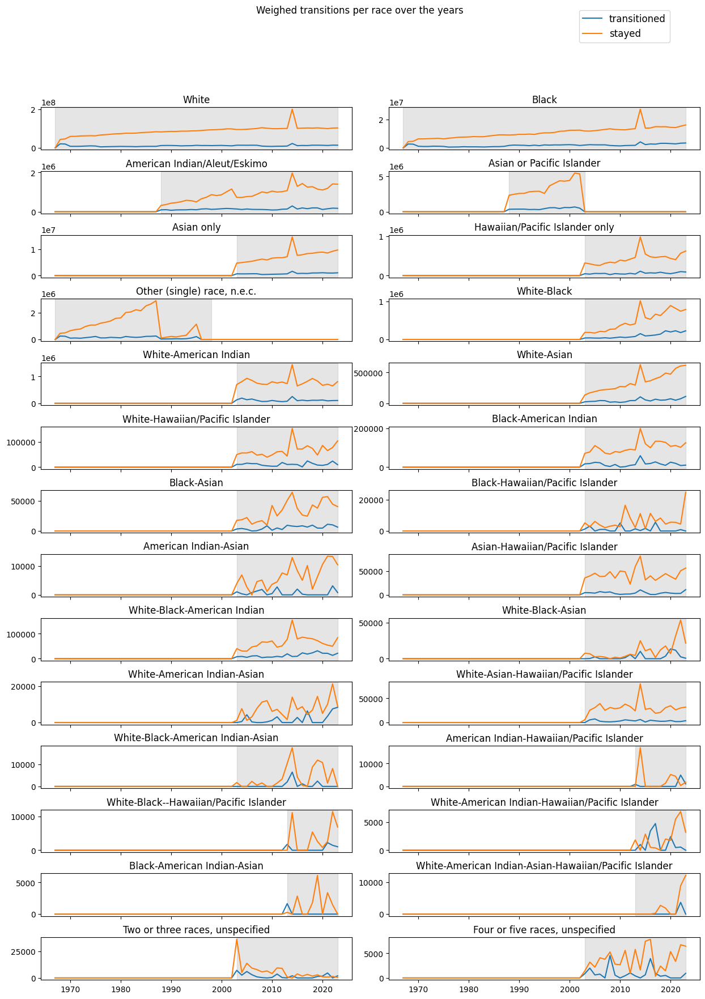

In [63]:
### all races
fig, axs = plt.subplots(14, 2, figsize=(15, 20), sharex = True)
### top 5 races
#fig, axs = plt.subplots(3, 2, figsize=(15, 10), sharex = False)


axs = list(chain(*axs))
fig.subplots_adjust(hspace= 0.5, wspace=0.12)

# Loop through unique race codes
### all races
sorted_race_codes = np.sort(trans_vs_stayed['RACE'].unique())
### top 5 races
#sorted_race_codes = [100, 200, 300, 651, 801]

for race_code, ax in zip(sorted_race_codes, axs):
    current_race = (race_codes_df['RACE'] == race_code)
    ax.set_title(race_codes_df[current_race]['race_title'].item())

    race_data = trans_vs_stayed[trans_vs_stayed['RACE'] == race_code]
    ax.plot(race_data['YEAR'], race_data['transitioned_weighed'], label = 'transitioned')
    ax.plot(race_data['YEAR'], race_data['stayed_weighed'], label = 'stayed')

    ax.axvspan(race_codes_df[current_race]['start'].item(), race_codes_df[current_race]['end'].item(), color="grey", alpha=0.2)

fig.suptitle('Weighed transitions per race over the years', y=0.97)
fig.legend(*[*zip(*{l:h for h,l in zip(*ax.get_legend_handles_labels())}.items())][::-1], loc =  'upper right', fontsize = 12, bbox_to_anchor=(0.87, 0.97))

### top 5 races
#fig.delaxes(ax = axs[5])
#plt.savefig(r'../../plots/occ_trans/weighted_trans_over_years_top5.png')

plt.show()

Of those who switched their job in the previous year, how many stayed in the same/transitioned to a different occupation category?

threshold, to not include all race categories
categorize race codes (two or more categories includes more races)

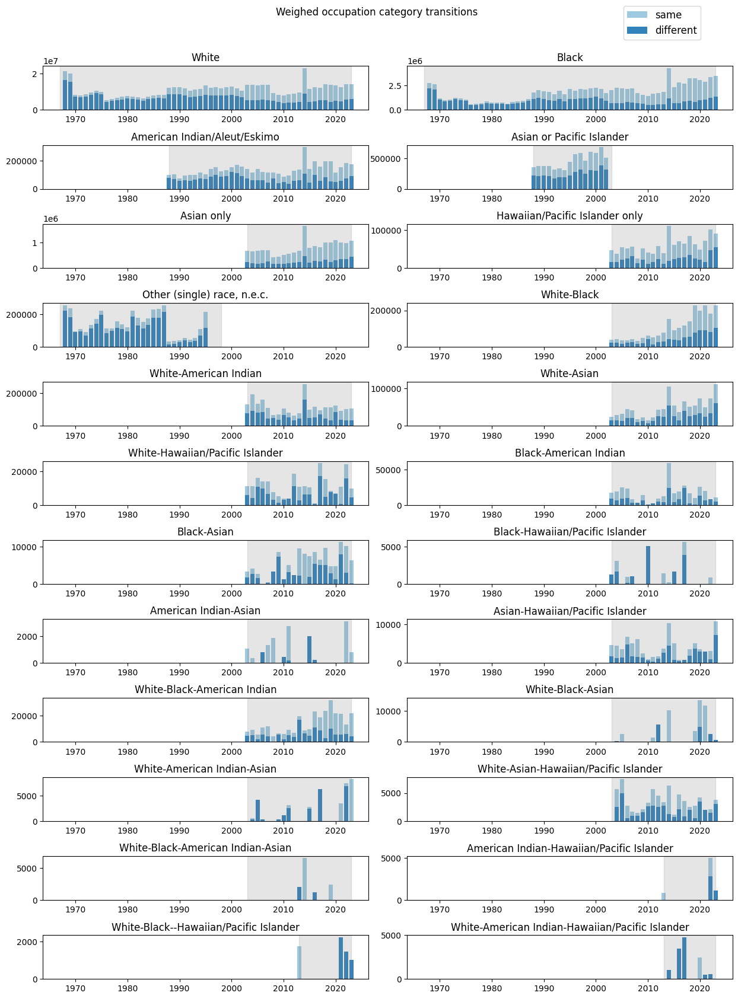

In [65]:
width = 0.35  # the width of the bars
colors_ = plt.colormaps['tab20c']

### all races
fig, axs = plt.subplots(12, 2,  figsize=(15, 20))
### top 5 races
#fig, axs = plt.subplots(3, 2, figsize=(15, 10), sharex = False)

axs = list(chain(*axs))
### all races
fig.subplots_adjust(hspace= 0.8, wspace=0.12)
### top 5 races
#fig.subplots_adjust(hspace= 0.5, wspace=0.12)

### all races
sorted_race_codes = np.sort(trans_vs_stayed['RACE'].unique())
### top 5 races
#sorted_race_codes = [100, 200, 300, 651, 801]

for race_code, ax in zip(sorted_race_codes, axs):
    df = trans_vs_stayed[trans_vs_stayed['RACE'] == race_code]

    current_race = (race_codes_df['RACE'] == race_code)
    ax.set_title(race_codes_df[current_race]['race_title'].item())

    ax.bar(df['YEAR'], df["same_occ_category"]+df["diff_occ_category"], label='same', color=colors_.colors[2]) 
    ax.bar(df["YEAR"], df["diff_occ_category"], color=colors_.colors[0], label='different') 

    ax.axvspan(race_codes_df[current_race]['start'].item(), race_codes_df[current_race]['end'].item(), color="grey", alpha=0.2)

### all races
fig.suptitle('Weighed occupation category transitions', y = 0.93)
fig.legend(*[*zip(*{l:h for h,l in zip(*ax.get_legend_handles_labels())}.items())][::-1], loc =  'upper right', fontsize = 12, bbox_to_anchor=(0.87, 0.935))
### top 5 races
#fig.suptitle('Weighed occupation category transitions', y = 0.97)
#fig.legend(*[*zip(*{l:h for h,l in zip(*ax.get_legend_handles_labels())}.items())][::-1], loc =  'upper right', fontsize = 12, bbox_to_anchor=(0.87, 0.97))

### all races
plt.savefig(r'../../plots/occ_trans/cat_trans.png')
### top 5 races
#fig.delaxes(ax = axs[5])
#plt.savefig(r'../../plots/occ_trans/cat_trans_top5.png')
plt.show()

In [212]:
race_occ_df.loc[(race_occ_df['occ_category'] != race_occ_df['occ_category_LY']) & 
                (race_occ_df['RACE'] == 816) &
                (race_occ_df['occ_code'] != race_occ_df['OCCLY'])]

,YEAR,RACE,ASECWT,occ_code,occ_category,OCCLY,occ_category_LY
216594,2022,816,1457.47,2540.0,"EDUCATION, TRAINING, AND LIBRARY",430.0,"MANAGEMENT, BUSINESS, SCIENCE, AND ARTS"
851870,2021,816,602.80,4760.0,SALES AND RELATED,9130.0,TRANSPORTATION AND MATERIAL MOVING
1457906,2021,816,1637.00,4840.0,SALES AND RELATED,5100.0,OFFICE AND ADMINISTRATIVE SUPPORT
2646158,2023,816,1028.13,2300.0,"EDUCATION, TRAINING, AND LIBRARY",5400.0,OFFICE AND ADMINISTRATIVE SUPPORT


In [213]:
race_occ_df.loc[(race_occ_df['RACE']==816) & (race_occ_df['YEAR'] == 2021)]

,YEAR,RACE,ASECWT,occ_code,occ_category,OCCLY,occ_category_LY
630471,2021,816,2018.0,8740.0,PRODUCTION,8740.0,PRODUCTION
851870,2021,816,602.8,4760.0,SALES AND RELATED,9130.0,TRANSPORTATION AND MATERIAL MOVING
1457906,2021,816,1637.0,4840.0,SALES AND RELATED,5100.0,OFFICE AND ADMINISTRATIVE SUPPORT
2644625,2021,816,567.2,5400.0,OFFICE AND ADMINISTRATIVE SUPPORT,5400.0,OFFICE AND ADMINISTRATIVE SUPPORT


### Other

In [214]:
race_occ_df[race_occ_df['RACE'] == 300]

,YEAR,RACE,ASECWT,occ_code,occ_category,OCCLY,occ_category_LY
52,1999,300,2540.83,5120.0,OFFICE AND ADMINISTRATIVE SUPPORT,2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA"
1181,1988,300,1844.89,2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA",2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA"
1359,1991,300,1361.65,2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA",2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA"
1414,1992,300,888.86,2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA",2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA"
1425,1992,300,435.02,2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA",2910.0,"ARTS, DESIGN, ENTERTAINMENT, SPORTS, AND MEDIA"
...,...,...,...,...,...,...,...
4051292,2015,300,305.60,4720.0,SALES AND RELATED,1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE"
4051360,2006,300,1124.95,1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE",1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE"
4051467,2014,300,1485.65,1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE",1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE"
4051509,2018,300,315.90,1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE",1930.0,"LIFE, PHYSICAL, AND SOCIAL SCIENCE"
